In [1]:
### Notebook for P3D stuff!
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "1"

import jax
jax.config.update('jax_platform_name', 'gpu')
from jax.lib import xla_bridge
print("jax version",jax.__version__)
print(xla_bridge.get_backend().platform)

import numpy as np
import jax.numpy as jnp 

%pylab inline

jax version 0.4.26
gpu
%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


In [2]:
!nvidia-smi


Wed Apr  2 22:26:55 2025       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 530.30.02              Driver Version: 530.30.02    CUDA Version: 12.1     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                  Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf            Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA GeForce RTX 2080 Ti      Off| 00000000:1A:00.0 Off |                  N/A |
| 16%   26C    P8                1W / 250W|     18MiB / 11264MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

/home/guoqi/.conda/envs/MAPLE/lib/python3.9/pty.py:85: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


|   6  NVIDIA GeForce RTX 2080 Ti      Off| 00000000:23:00.0 Off |                  N/A |
| 16%   29C    P8               17W / 250W|      1MiB / 11264MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+----------------------+
|   7  NVIDIA GeForce RTX 2080 Ti      Off| 00000000:24:00.0 Off |                  N/A |
| 16%   29C    P8                1W / 250W|      1MiB / 11264MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+----------------------+
                                                                                         
+---------------------------------------------------------------------------------------+
| Processes:                                                                            |
|  GPU   G

In [3]:
#from jaxpm.kernels import *
#uses jaxpm for some kernels... maybe?

In [4]:
#First things... set the redshift

z= 2.0

#set box geometry, probably should wrap this into the fiducial model file (hdf5?) to lead to less fiddling bugs

bs =  50#box size in Mpc/h
nc =  100#number of pixels per side

mesh_shape = [nc,nc,nc]
box_size = [bs,bs,bs]

ptcl_grid_shape = (nc,) * 3
ptcl_spacing = bs/nc



In [5]:
#some fourier space routines
from helper_functions import *

kvec = rfftnfreq_2d(ptcl_grid_shape, ptcl_spacing)
k = jnp.sqrt(sum(k**2 for k in kvec))
#this vector is needed for lots of fourier space transformation operations later on...
print(k.shape)

/tmp/ipykernel_56917/2721841557.py:5: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  k = jnp.sqrt(sum(k**2 for k in kvec))
2025-04-02 22:26:57.954519: W external/xla/xla/service/gpu/nvptx_compiler.cc:718] The NVIDIA driver's CUDA version is 12.1 which is older than the ptxas CUDA version (12.8.93). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility packages.


(100, 100, 51)


In [6]:
#in this setup, LOS (z) is along the 0 axis, be careful when loading in data!

kz = jnp.ones(k.shape)*kvec[0]**2

kx = jnp.ones(k.shape)*(kvec[1]**2+kvec[2]**2)
#tiny deltas are added to avoid div by zero errors
kk = (kx+kz)+10**(-8)
kmu = jnp.sqrt((kz/(k**2+0.00001)))


In [7]:
np.max(k)


Array(10.882796, dtype=float32)

In [8]:
#m_array[:,0][:50].max()
from jax import jit, checkpoint, custom_vjp
from jax.scipy.ndimage import map_coordinates

#loading in fiducial model
m_array = np.load("pkell_red_50.npy")
m_array = jnp.array(m_array[np.where(m_array[:,1]<=8)])
kmax = m_array[-1,0]
print(m_array.shape,kmax)


(100, 3) 15.607467


In [9]:
import jaxinterp2d

k_in = (k.flatten()/kmax*20-0.54)

l0 = np.where(m_array[:,1]==0)[0]
k_l0 = m_array[l0,0]
Pk_l0 = m_array[l0,2]
func1 = map_coordinates(Pk_l0,np.array([k_in]),mode="nearest",order=1)
func1 = func1.reshape(k.shape[0],k.shape[1],k.shape[2])

l2 = np.where(m_array[:,1]==2)[0]
k_l2 = m_array[l2,0]
Pk_l2 = m_array[l2,2]
func2 = map_coordinates(Pk_l2,np.array([k_in]),mode="nearest",order=1)
func2 = func2.reshape(k.shape[0],k.shape[1],k.shape[2])

l4 = np.where(m_array[:,1]==4)[0]
k_l4 = m_array[l4,0]
Pk_l4 = m_array[l4,2]
func4 = map_coordinates(Pk_l4,np.array([k_in]),mode="nearest",order=1)
func4 = func4.reshape(k.shape[0],k.shape[1],k.shape[2])

l6 = np.where(m_array[:,1]==6)[0]
k_l6 = m_array[l6,0]
Pk_l6 = m_array[l6,2]
func6 = map_coordinates(Pk_l6,np.array([k_in]),mode="nearest",order=1)
func6 = func6.reshape(k.shape[0],k.shape[1],k.shape[2])

l8 = np.where(m_array[:,1]==8)[0]
k_l8 = m_array[l8,0]
Pk_l8 = m_array[l8,2]
func8 = map_coordinates(Pk_l8,np.array([k_in]),mode="nearest",order=1)
func8 = func8.reshape(k.shape[0],k.shape[1],k.shape[2])

# l10 = np.where(m_array[:,1]==10)[0]
# k_l10 = m_array[l10,0]
# Pk_l10 = m_array[l10,2]
# func10 = map_coordinates(Pk_l10,np.array([k_in]),mode="nearest",order=1)
# func10 = func10.reshape(k.shape[0],k.shape[1],k.shape[2])

# l12 = np.where(m_array[:,1]==12)[0]
# k_l12 = m_array[l12,0]
# Pk_l12 = m_array[l12,2]
# func12 = map_coordinates(Pk_l12,np.array([k_in]),mode="nearest",order=1)
# func12 = func12.reshape(k.shape[0],k.shape[1],k.shape[2])


In [10]:
# plt.plot(k_l0,Pk_l0,color='red')
# plt.scatter(np.array([k_in])[0],map_coordinates(Pk_l0,np.array([k_in]),mode="nearest",order=3),s=3)
# plt.xlabel("k")
# plt.ylabel("Pk")
# plt.title(r"$\ell=0$")
# plt.loglog()

In [11]:
k_l0

Array([ 0.5933727,  1.2859824,  2.0516453,  2.8347514,  3.6281013,
        4.424479 ,  5.2197375,  6.0153003,  6.814117 ,  7.6137304,
        8.411835 ,  9.210772 , 10.010572 , 10.809766 , 11.609148 ,
       12.408537 , 13.207074 , 14.007173 , 14.807906 , 15.607467 ],      dtype=float32)

In [12]:
from scipy.special import legendre

# np.min(func1*legendre(0)(kmu)+func2*legendre(2)(kmu)+func4*legendre(4)(kmu)+func6*legendre(6)(kmu)+func8*legendre(8)(kmu))

In [13]:
k_ind_optim_max = 8
ell_bins=5
k_bins=20
tff = m_array[:,2].reshape(ell_bins,k_bins)
theta_fid = m_array[:,2].reshape(ell_bins,k_bins)[:,:k_ind_optim_max]
# theta_fid = m_array[:k_bins,2].reshape(1,k_bins)[:,:k_ind_optim_max]

from scipy.special import legendre

def power_b(theta,tff=tff):    
    tff = tff.at[:,:k_ind_optim_max].set(theta.reshape(ell_bins,k_ind_optim_max))
    # tff = tff.at[0,:k_ind_optim_max].set(theta.reshape(1,k_ind_optim_max).ravel())
    func1 = map_coordinates(tff[0], np.array([k_in]), mode="nearest", order=1)
    func1 = func1.reshape(k.shape[0],k.shape[1],k.shape[2])
    func2 = map_coordinates(tff[1], np.array([k_in]), mode="nearest", order=1)
    func2 = func2.reshape(k.shape[0],k.shape[1],k.shape[2])
    func4 = map_coordinates(tff[2], np.array([k_in]), mode="nearest", order=1)
    func4 = func4.reshape(k.shape[0],k.shape[1],k.shape[2])
    func6 = map_coordinates(tff[3], np.array([k_in]), mode="nearest", order=1)
    func6 = func6.reshape(k.shape[0],k.shape[1],k.shape[2])
    func8 = map_coordinates(tff[4], np.array([k_in]), mode="nearest", order=1)
    func8 = func8.reshape(k.shape[0],k.shape[1],k.shape[2])
    # func10 = map_coordinates(tff[5], np.array([k_in]), mode="nearest", order=1)
    # func10 = func10.reshape(k.shape[0],k.shape[1],k.shape[2])
    # func12 = map_coordinates(tff[6], np.array([k_in]), mode="nearest", order=1)
    # func12 = func12.reshape(k.shape[0],k.shape[1],k.shape[2])
    func = jax.nn.relu(func1*legendre(0)(kmu)+func2*legendre(2)(kmu)+func4*legendre(4)(kmu)+func6*legendre(6)(kmu)+func8*legendre(8)(kmu))
    # func = jax.nn.relu(func1*legendre(0)(kmu)+func2*legendre(2)(kmu)+func4*legendre(4)(kmu))
    return func*8


In [14]:
#muse componenet...
from functools import partial
import jax
import jax.numpy as jnp
from muse_inference.jax import JaxMuseProblem

In [15]:

#file name
prefix = "V1_DENSE_"
loc = "./configs/"

naa = np.load(loc+prefix+"naa.npy")
kernel = np.load(loc+prefix+"kernel.npy")
skewers_skn = np.load(loc+prefix+"skewers_skn.npy")
skewers_dla = np.load(loc+prefix+"skewers_dla.npy")
skewers_fin = np.load(loc+prefix+"skewers_fin.npy")



@jit
def cic_readout_jit_jnc(mesh,naa,kernel,bs=False):
    #"highly optimized" CIC, need to preprocess lots of things... don't diff output coords
    meshvals = mesh.flatten()[naa].reshape(-1,8).T#mesh[tuple(neighboor_coords[0,:,:].T.tolist())]
    weightedvals = meshvals.T* kernel[0]
    values = np.sum(weightedvals, axis=-1)
    
    return values



In [16]:
tf_cut_flat = theta_fid.flatten()

noise_level = 1.0

def gen_map_lya(theta,z):
    modes = z[:nc**3].reshape((nc,nc,nc))    
    Plin = power_b(theta)
    conv_field = jnp.fft.rfftn(modes).conj()*Plin**(1/2)
    lin_modes_real = jnp.fft.irfftn(conv_field).T[:,:,:]

    lya_values = cic_readout_jit_jnc(lin_modes_real,naa,kernel)
    return lya_values
                 
class Jax3DMuseProblem_flat(JaxMuseProblem):

    def __init__(self, **kwargs):
        super().__init__(**kwargs)

    #@jax.jit
    def sample_x_z(self, key, θ):
        keys = jax.random.split(key, 2)
        z = jax.random.normal(keys[0], (nc*nc*nc,))

        # x = gen_map_lya(θ,z) + (0.05*skewers_skn)*jax.random.normal(keys[1], (kernel.shape[1],)) #1*jax.random.normal(keys[1], (32**3,)).reshape((32,32,32))
        x = gen_map_lya(θ,z) + (0.084*skewers_skn)*jax.random.normal(keys[1], (kernel.shape[1],)) #1*jax.random.normal(keys[1], (32**3,)).reshape((32,32,32))
   #     print(z.shape,x.shape)
        return (x, z)

  #  @jax.jit
    def logLike(self, x, z, θ):
        # return -(jnp.sum((x - gen_map_lya(θ,z))**2/((0.05*skewers_skn)**2))+ jnp.sum(z**2.0))
        return -(jnp.sum((x - gen_map_lya(θ,z))**2/((0.084*skewers_skn)**2))+ jnp.sum(z**2.0))

  #  @jax.jit
    def logPrior(self, θ):
        return -jnp.sum(((θ-jnp.array(tf_cut_flat)*1.1)**2 / (2*(tf_cut_flat*0.4)**2)))
    


In [17]:
prob = Jax3DMuseProblem_flat(implicit_diff=True,jit=False)
key = jax.random.PRNGKey(100)
(x, z) = prob.sample_x_z(key, tf_cut_flat)
prob.set_x(x)

In [18]:
modes = z[:nc**3].reshape((nc,nc,nc))    
Plin = power_b(tf_cut_flat)
conv_field = jnp.fft.rfftn(modes).conj()*Plin**(1/2)
lin_modes_real = jnp.fft.irfftn(conv_field).T[:,:,:]

np.save("example_gen_field",lin_modes_real)

In [19]:
rng = jax.random.PRNGKey(1)

In [20]:
x_data = x

In [24]:
from numpy.random import SeedSequence, default_rng
from copy import copy

start_point = jnp.array(tf_cut_flat)*1.2#+np.random.randn(len(tf_cut_flat))*jnp.array(tf_cut_flat)*0.01)

def _split_rng(rng, N):
    keyz = []
    for i in range(N):
        rng, subkey = jax.random.split(rng)
        keyz.append(rng)
    return keyz
    
θ = start_point

maxsteps = 200
nsims= 10
rng = jax.random.PRNGKey(1)

xz_sims = [prob.sample_x_z(_rng, θ) for _rng in _split_rng(rng, nsims)]
xs = [x_data] + [x for (x,_) in xz_sims]
ẑs = [z*0]     + [z*0 for (x, z) in xz_sims]

In [25]:
print(x_data)

[ 0.16751751 -0.01214643 -0.05784959 ... -0.09553907 -0.00741648
 -0.00421106]


In [26]:
from jax import grad, hessian, jacfwd, jvp, value_and_grad, vmap

def gradθ_hessθ_logPrior(θ, transformed_θ=None):
        g = grad(prob.logPrior)(θ)
        H = hessian(lambda θ_vec: prob.logPrior(unravel_θ(θ_vec)))(ravel_θ(θ))
        return (g, H)

step: 1 0.7
step: 2 0.6579999999999999
step: 3 0.6185199999999998


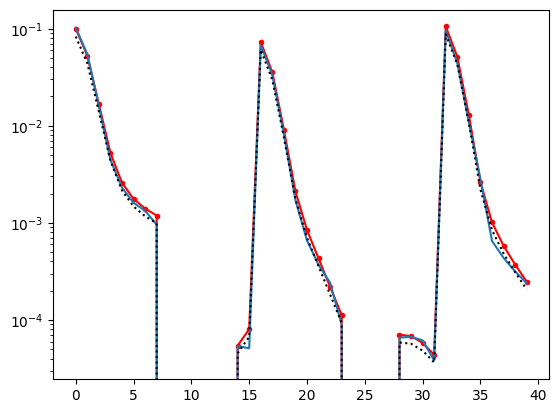

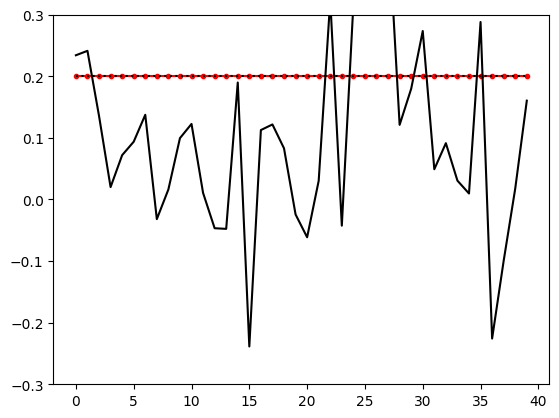

step: 4 0.5814087999999998
step: 5 0.5465242719999999
step: 6 0.5137328156799998


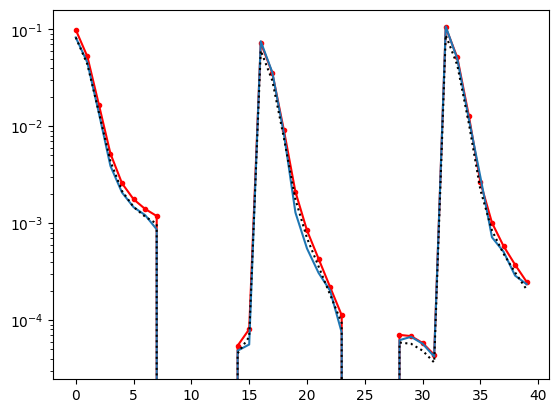

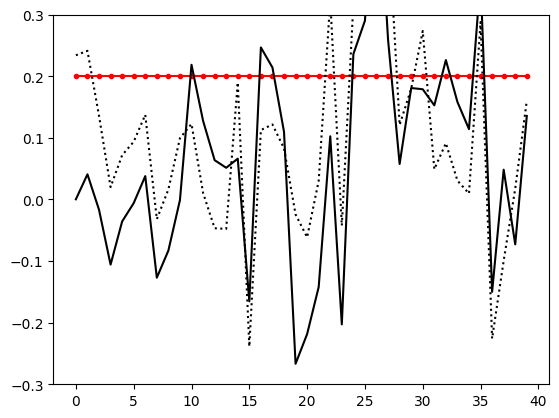

step: 7 0.4829088467391998
step: 8 0.4539343159348478
step: 9 0.4266982569787569


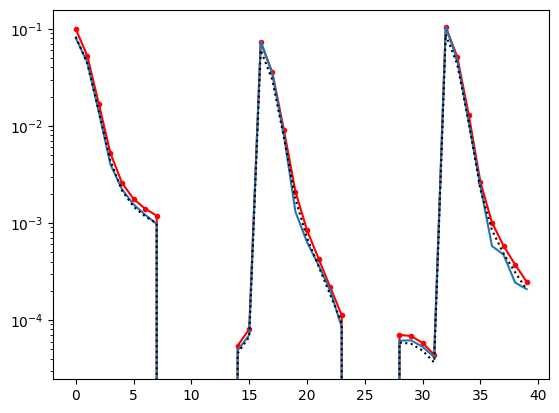

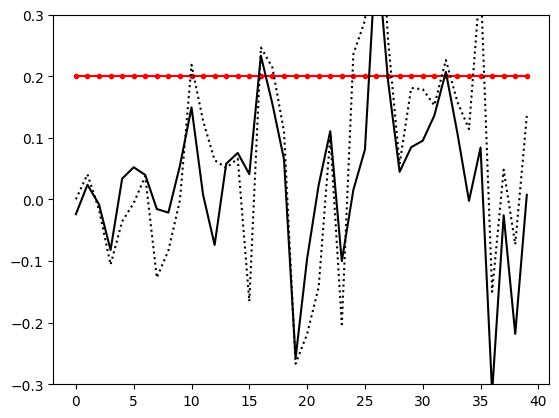

step: 10 0.4010963615600315
step: 11 0.37703057986642957
step: 12 0.35440874507444375


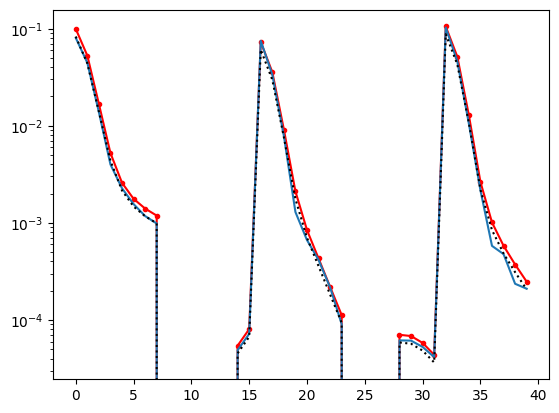

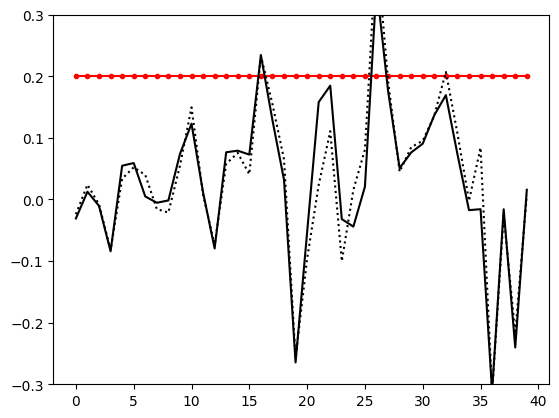

step: 13 0.3331442203699771
step: 14 0.3131555671477785
step: 15 0.29436623311891175


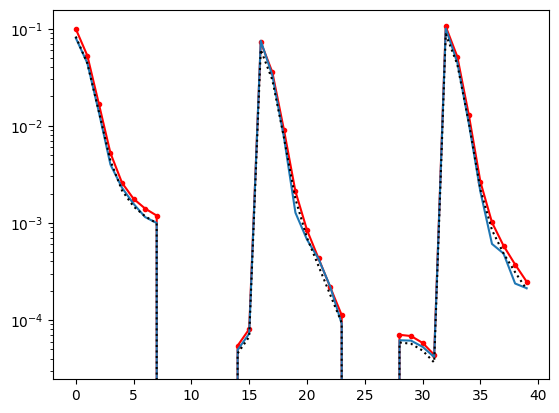

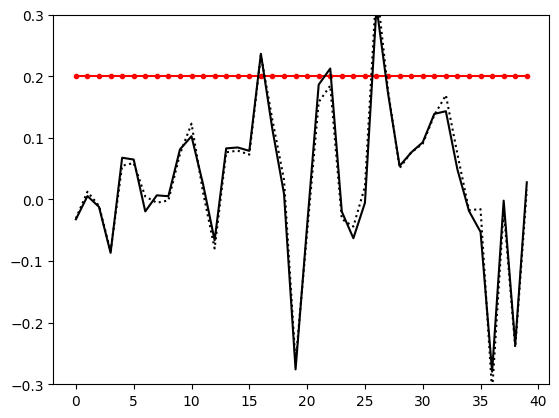

step: 16 0.27670425913177704
step: 17 0.2601020035838704
step: 18 0.24449588336883818


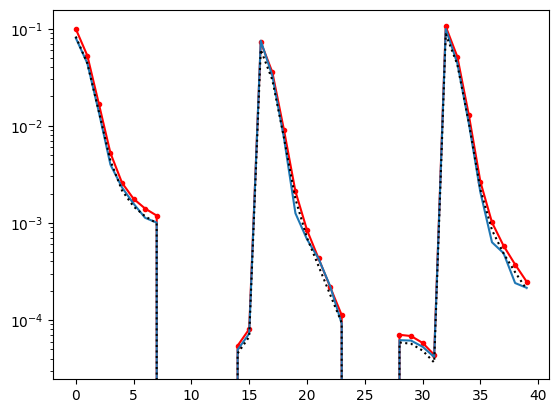

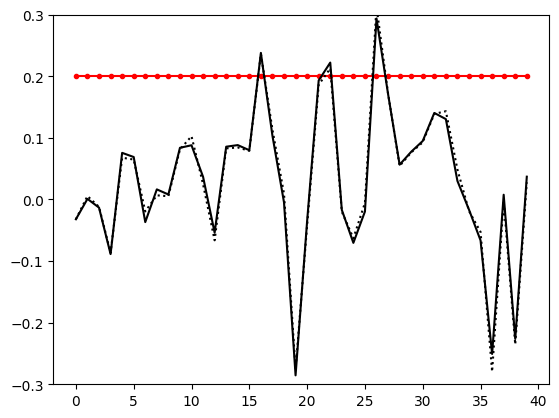

step: 19 0.22982613036670788
step: 20 0.21603656254470538
step: 21 0.5


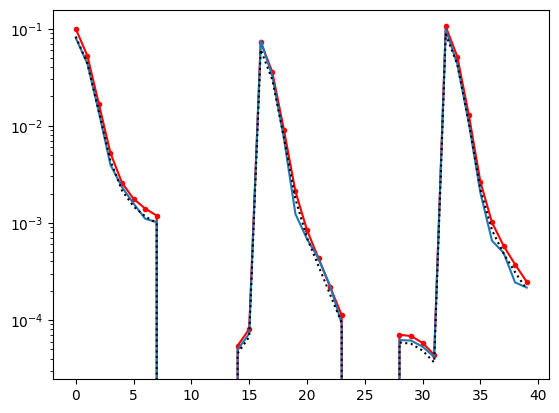

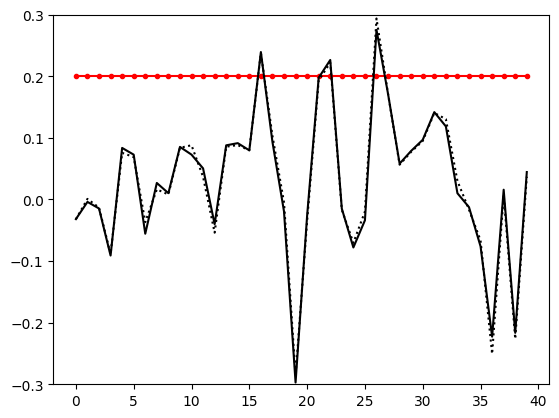

step: 22 0.47
step: 23 0.44179999999999997
step: 24 0.41529199999999994


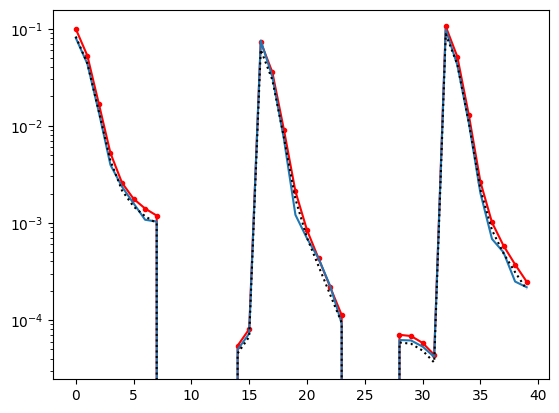

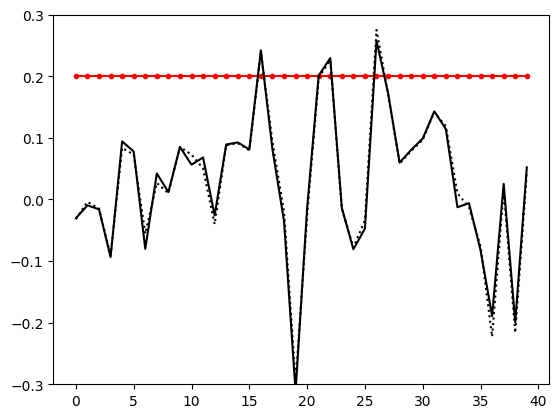

step: 25 0.3903744799999999
step: 26 0.3669520111999999
step: 27 0.34493489052799986


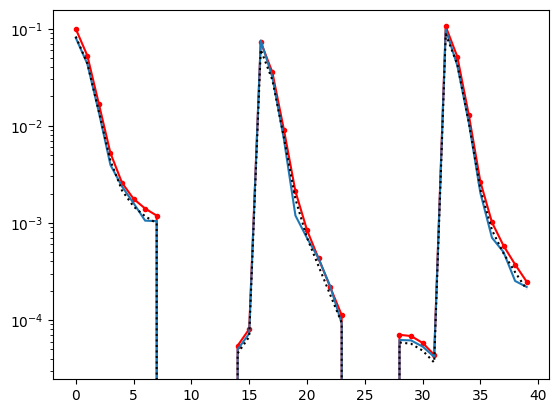

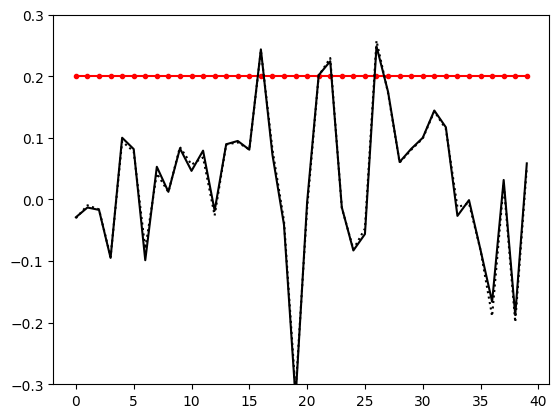

step: 28 0.32423879709631986
step: 29 0.30478446927054065
step: 30 0.2864974011143082


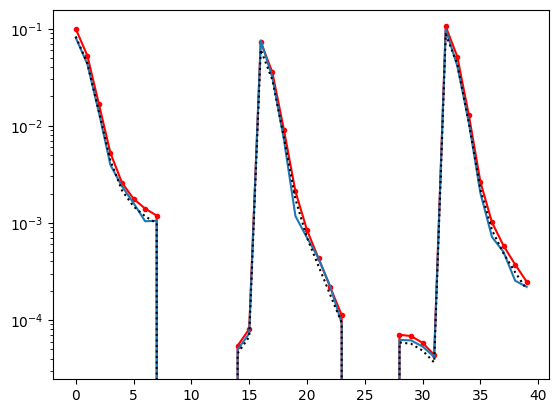

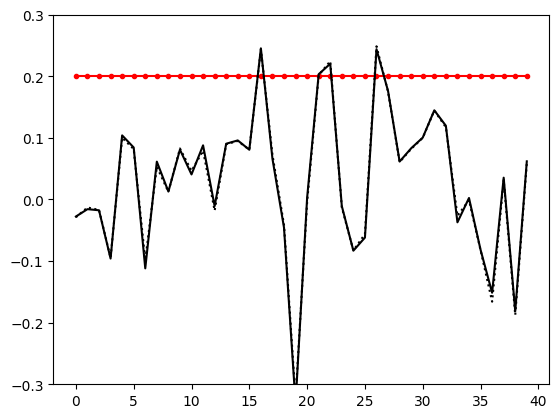

step: 31 0.2693075570474497
step: 32 0.2531491036246027
step: 33 0.2379601574071265


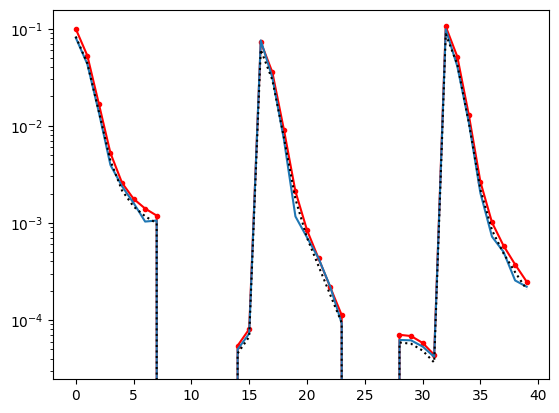

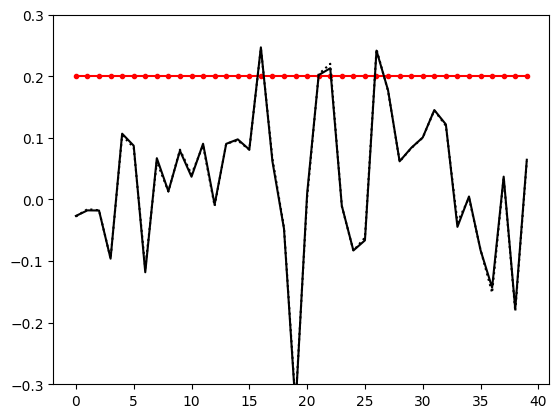

step: 34 0.2236825479626989
step: 35 0.21026159508493697
step: 36 0.19764589937984073


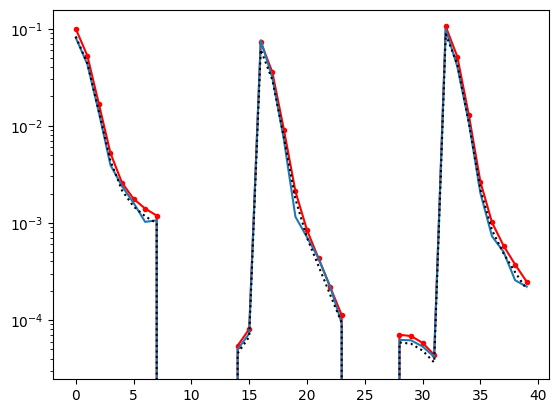

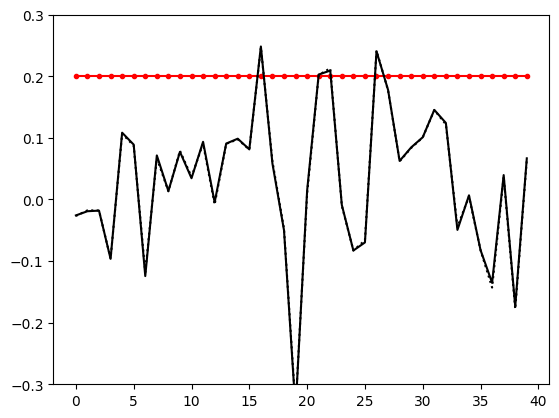

step: 37 0.18578714541705027
step: 38 0.17463991669202725
step: 39 0.1641615216905056


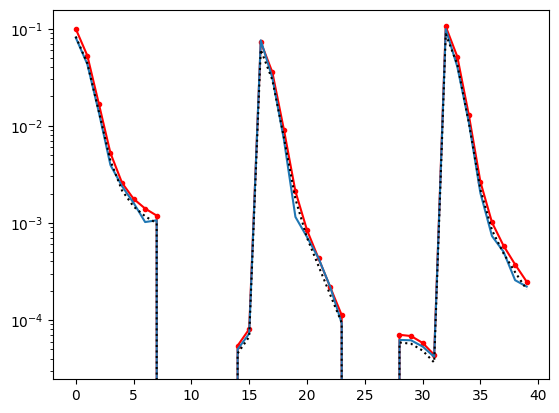

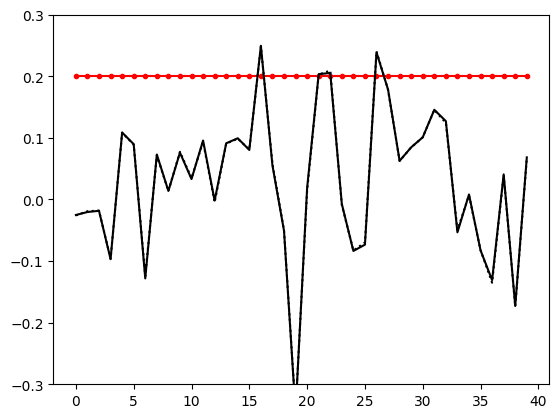

step: 40 0.15431183038907526
step: 41 0.5
step: 42 0.47


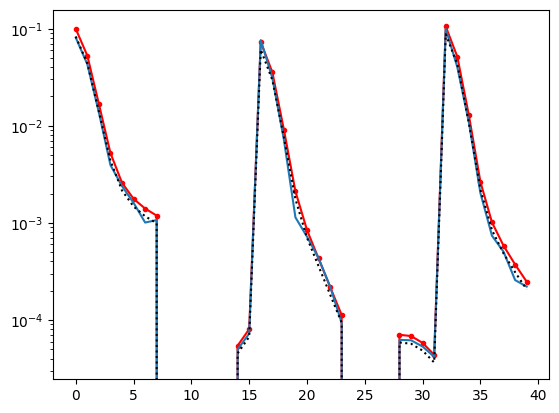

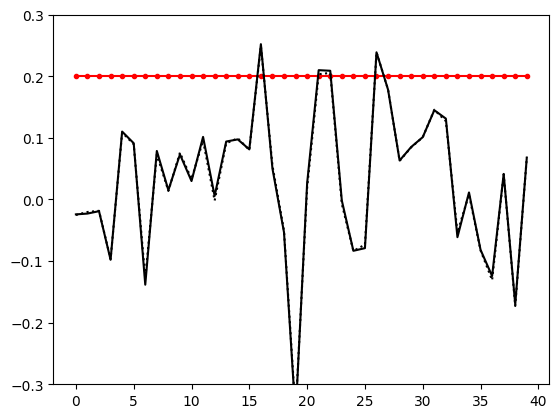

step: 43 0.44179999999999997
step: 44 0.41529199999999994
step: 45 0.3903744799999999


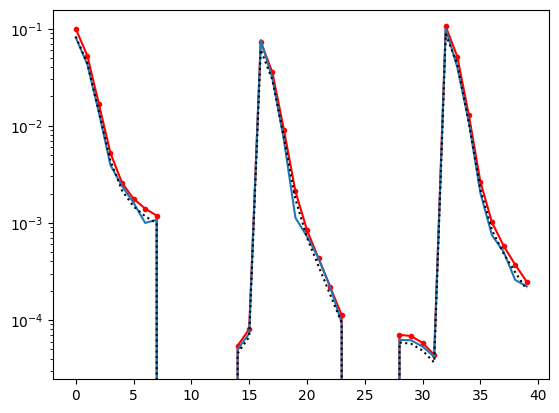

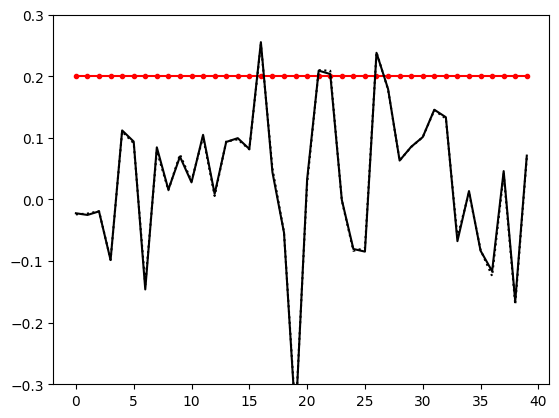

step: 46 0.3669520111999999
step: 47 0.34493489052799986
step: 48 0.32423879709631986


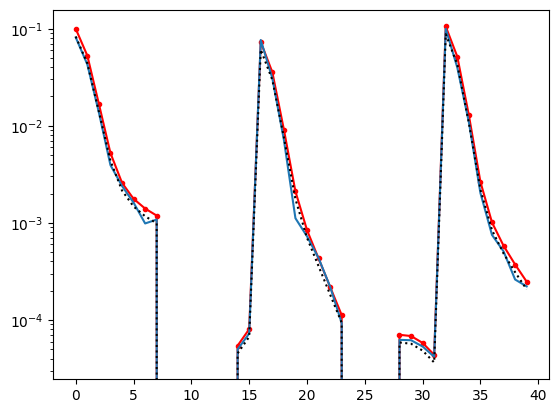

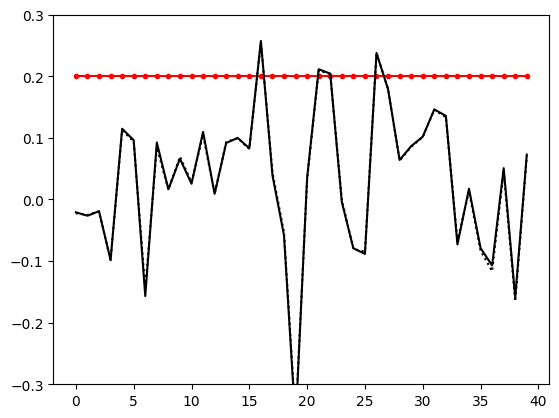

step: 49 0.30478446927054065
step: 50 0.2864974011143082
step: 51 0.2693075570474497


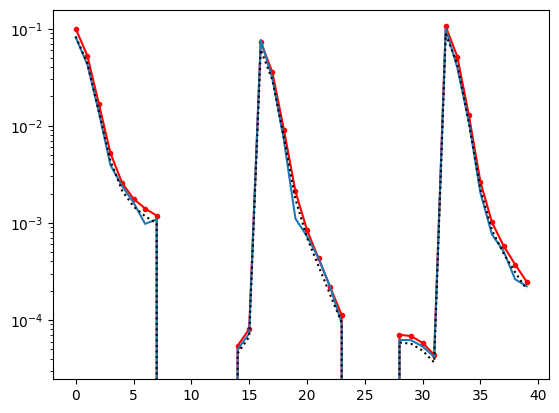

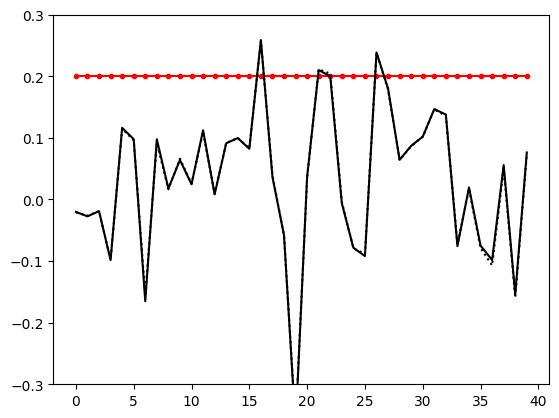

step: 52 0.2531491036246027
step: 53 0.2379601574071265
step: 54 0.2236825479626989


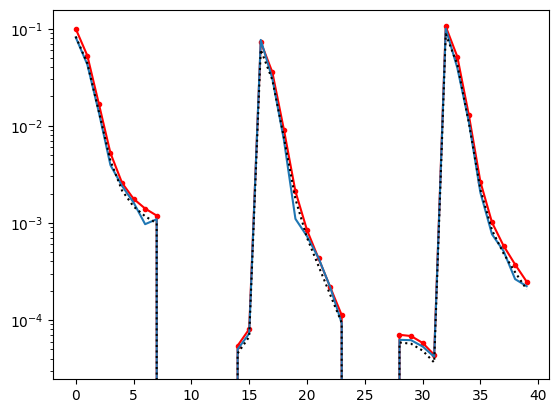

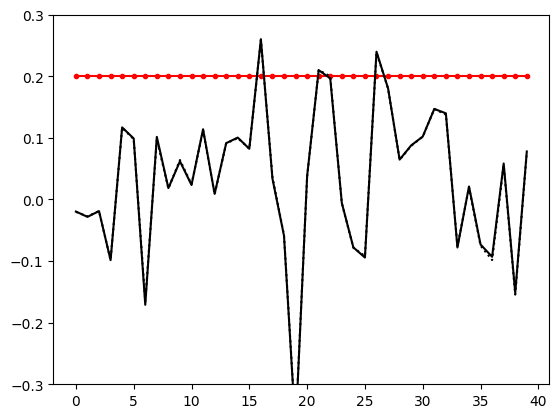

step: 55 0.21026159508493697
step: 56 0.19764589937984073
step: 57 0.18578714541705027


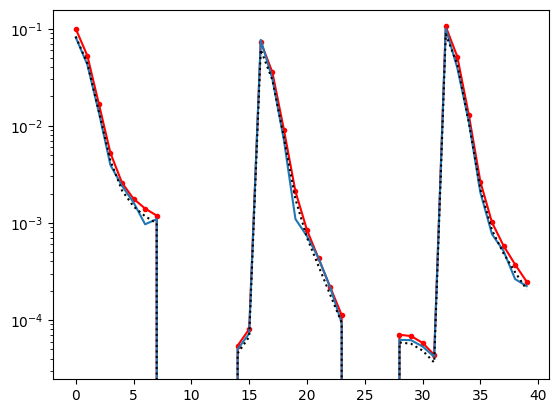

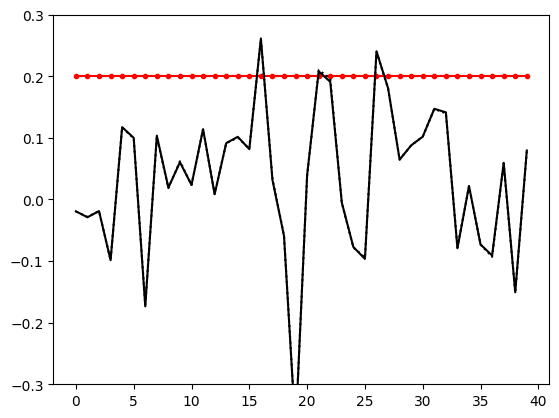

step: 58 0.17463991669202725
step: 59 0.1641615216905056
step: 60 0.15431183038907526


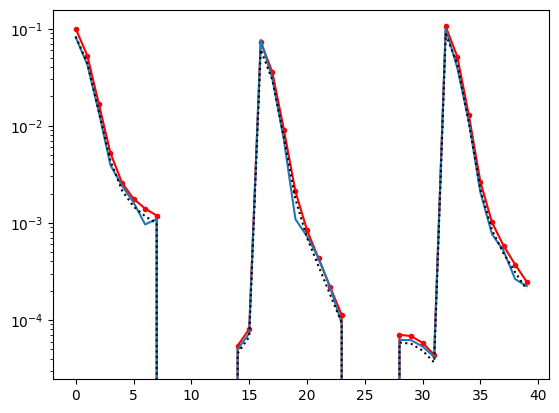

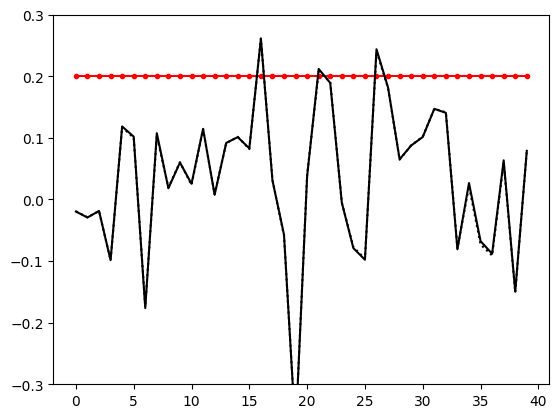

step: 61 0.5
step: 62 0.47
step: 63 0.44179999999999997


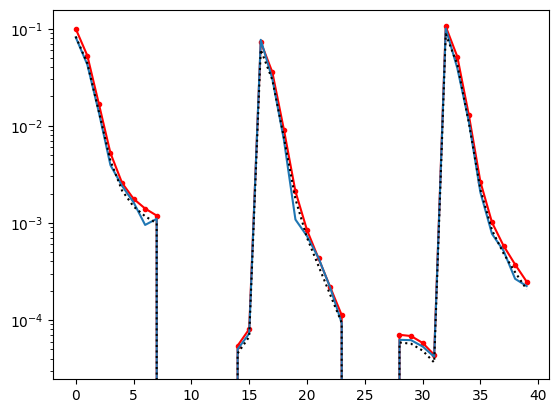

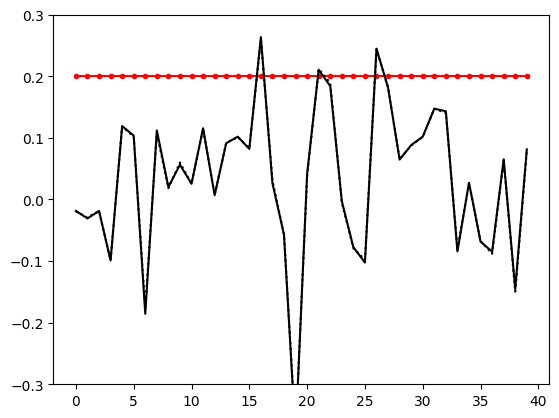

step: 64 0.41529199999999994
step: 65 0.3903744799999999
step: 66 0.3669520111999999


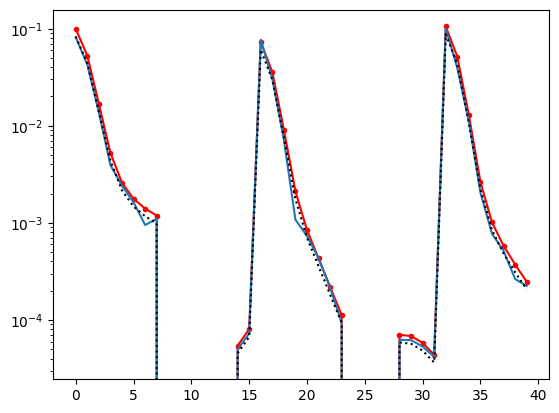

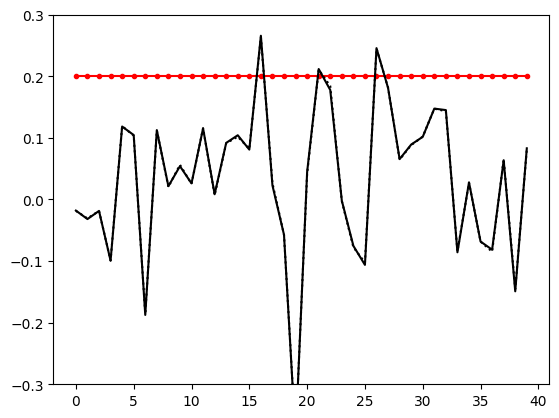

step: 67 0.34493489052799986
step: 68 0.32423879709631986
step: 69 0.30478446927054065


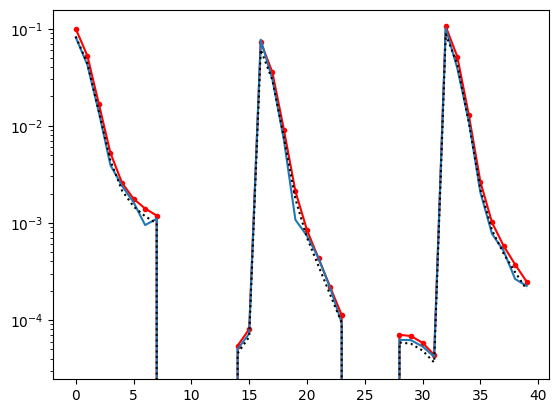

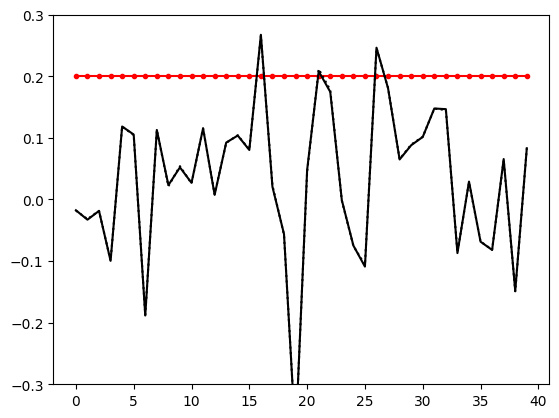

step: 70 0.2864974011143082
step: 71 0.2693075570474497
step: 72 0.2531491036246027


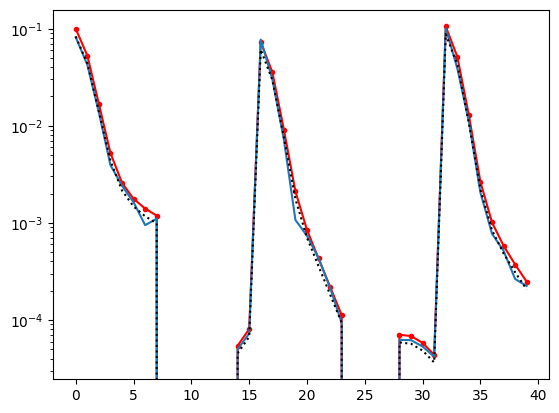

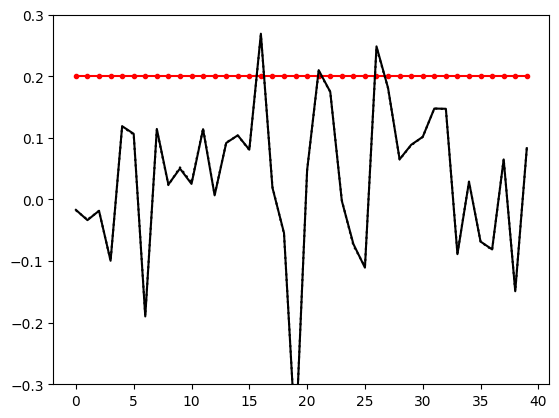

step: 73 0.2379601574071265
step: 74 0.2236825479626989
step: 75 0.21026159508493697


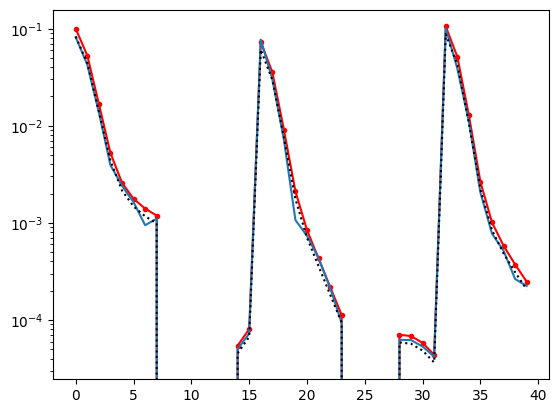

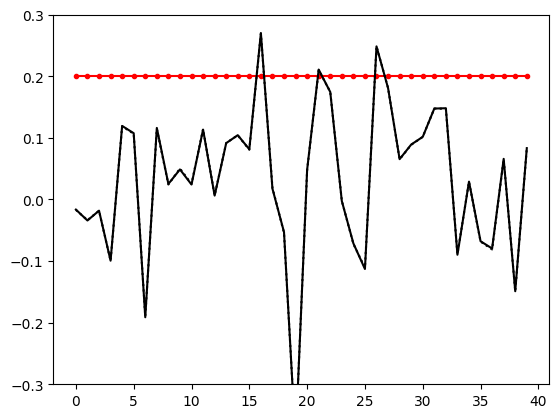

step: 76 0.19764589937984073
step: 77 0.18578714541705027
step: 78 0.17463991669202725


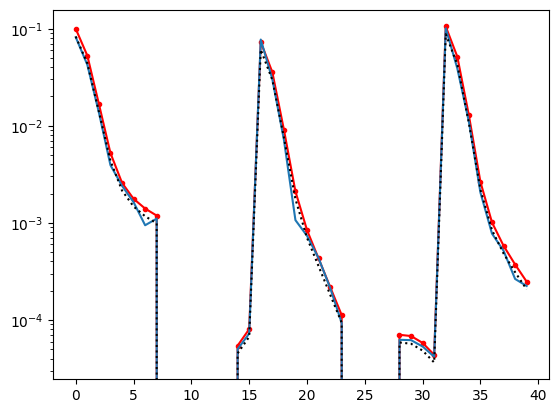

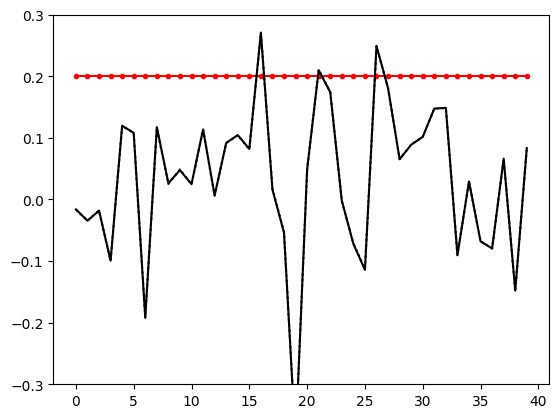

step: 79 0.1641615216905056
step: 80 0.15431183038907526
step: 81 0.5


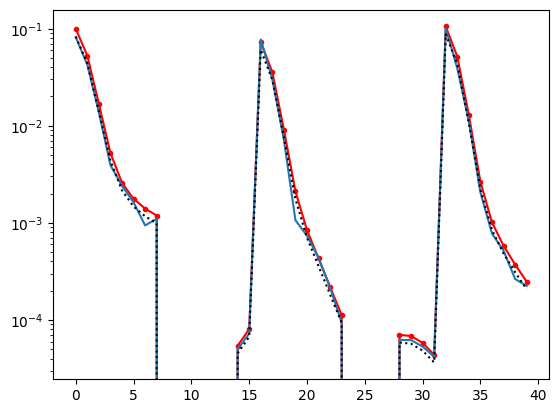

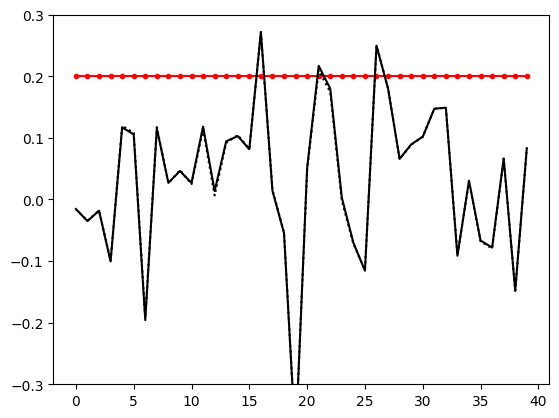

step: 82 0.47
step: 83 0.44179999999999997
step: 84 0.41529199999999994


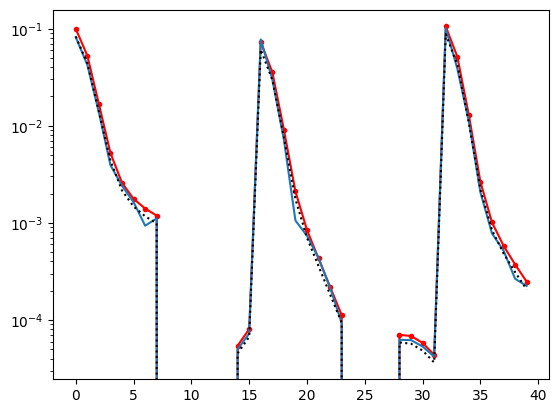

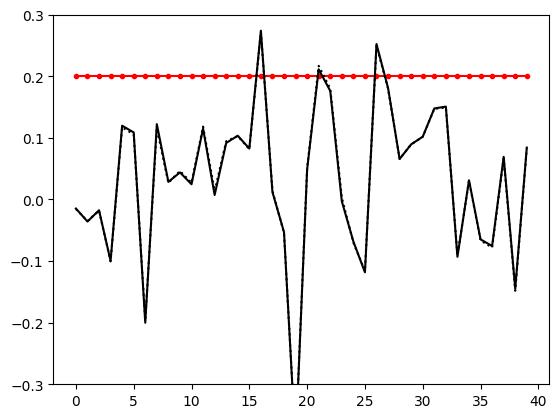

step: 85 0.3903744799999999
step: 86 0.3669520111999999
step: 87 0.34493489052799986


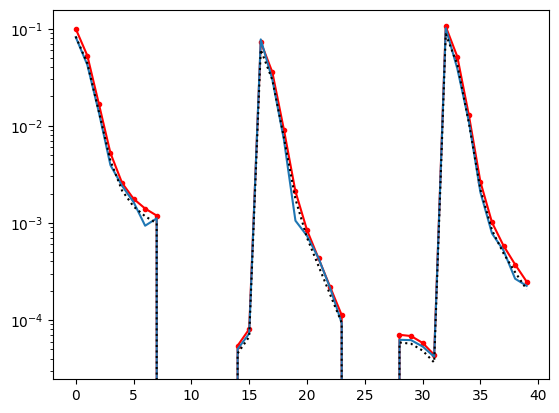

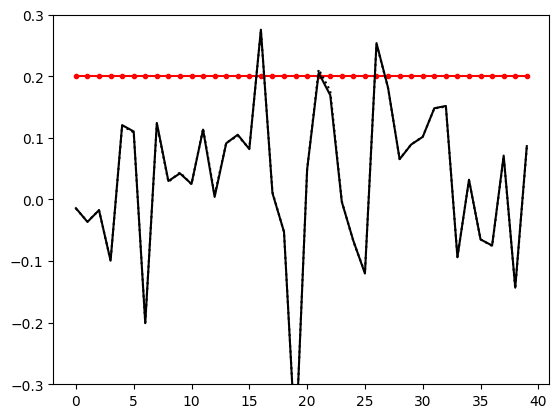

step: 88 0.32423879709631986
step: 89 0.30478446927054065
step: 90 0.2864974011143082


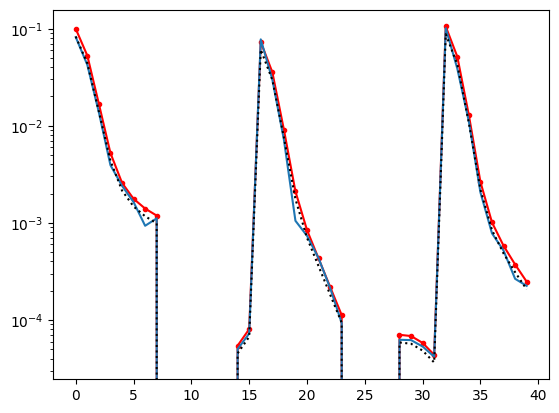

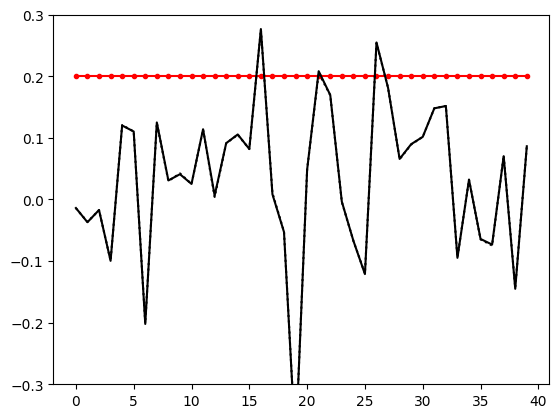

step: 91 0.2693075570474497
step: 92 0.2531491036246027
step: 93 0.2379601574071265


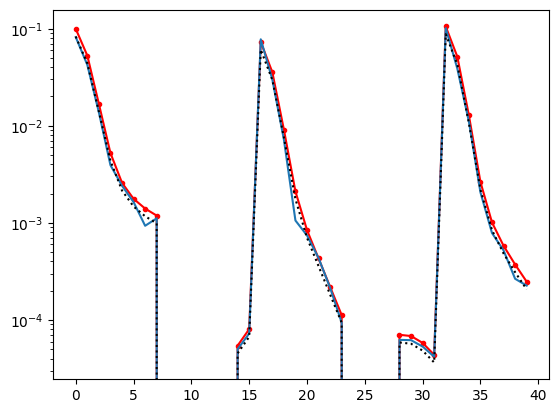

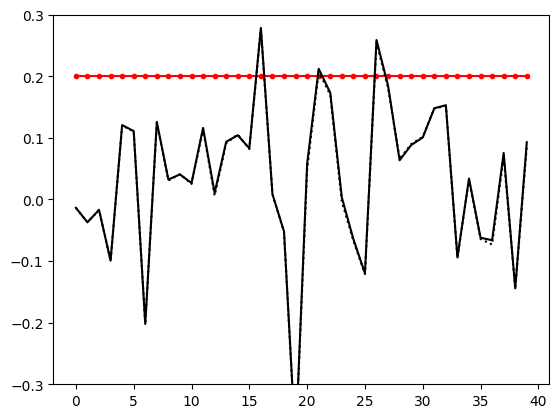

step: 94 0.2236825479626989
step: 95 0.21026159508493697
step: 96 0.19764589937984073


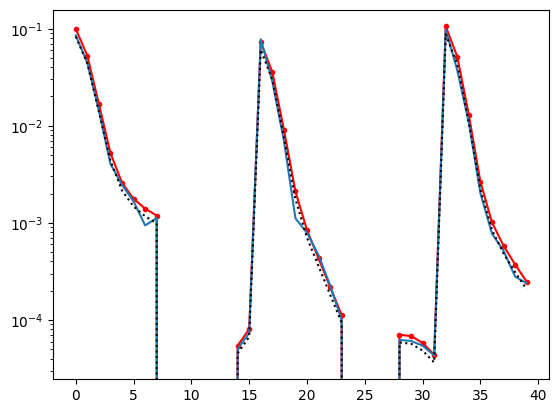

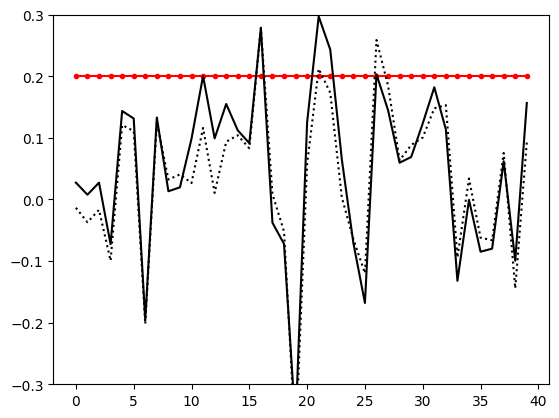

step: 97 0.18578714541705027
step: 98 0.17463991669202725
step: 99 0.1641615216905056


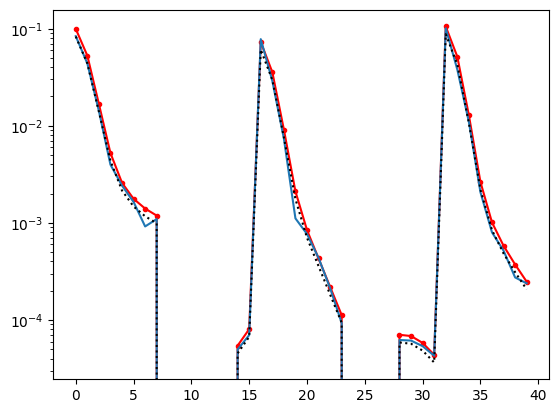

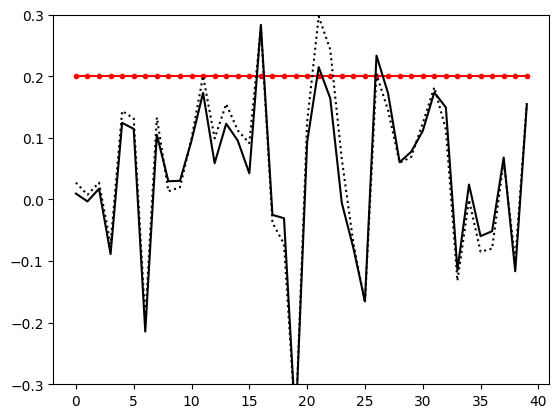

step: 100 0.15431183038907526
step: 101 0.5
step: 102 0.47


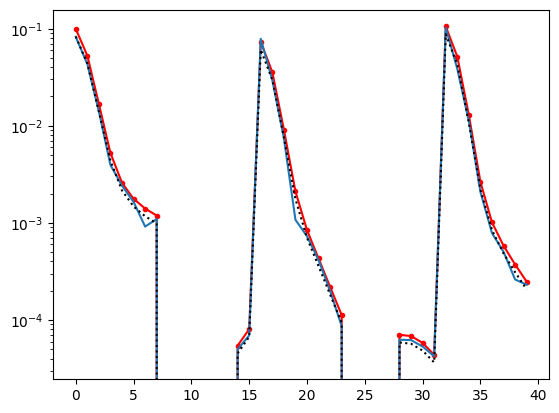

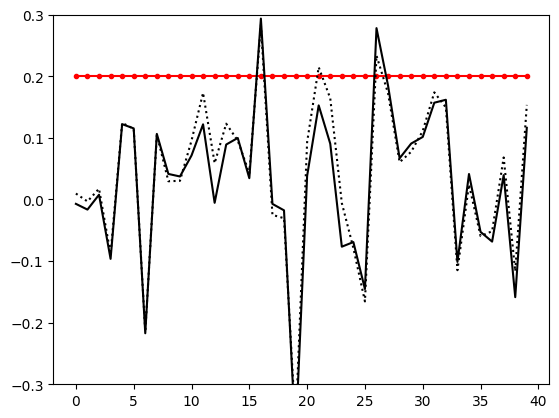

step: 103 0.44179999999999997
step: 104 0.41529199999999994
step: 105 0.3903744799999999


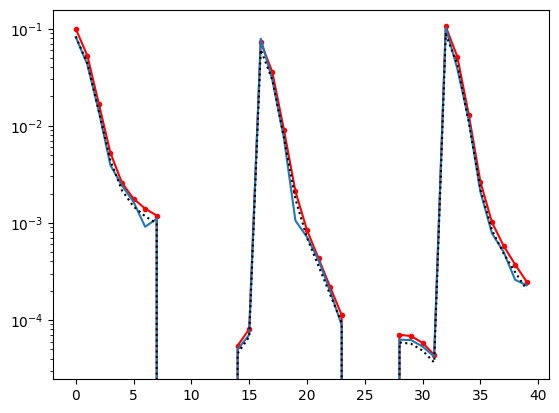

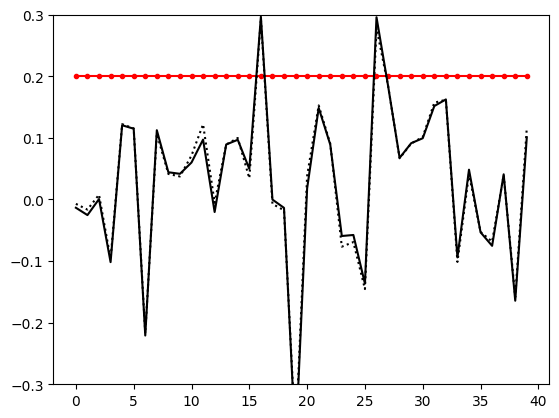

step: 106 0.3669520111999999
step: 107 0.34493489052799986
step: 108 0.32423879709631986


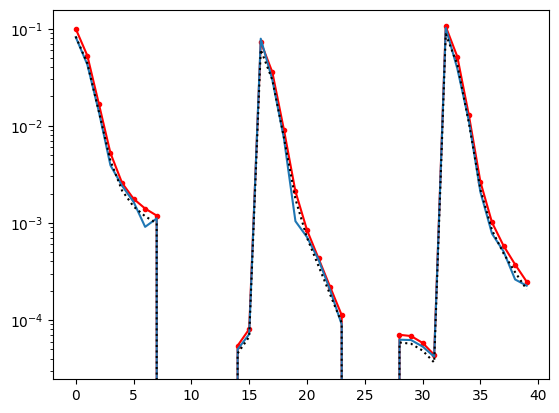

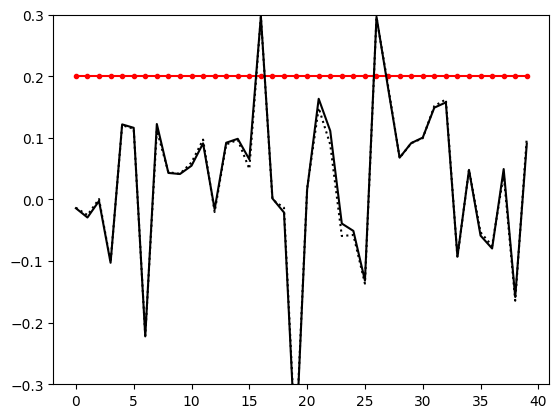

step: 109 0.30478446927054065
step: 110 0.2864974011143082
step: 111 0.2693075570474497


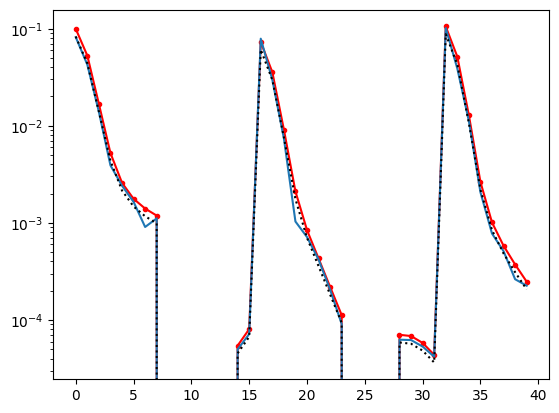

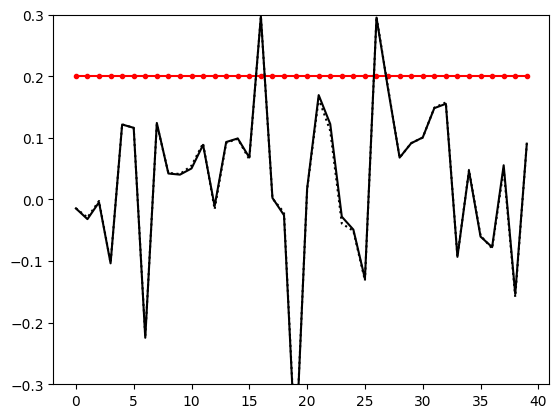

step: 112 0.2531491036246027
step: 113 0.2379601574071265
step: 114 0.2236825479626989


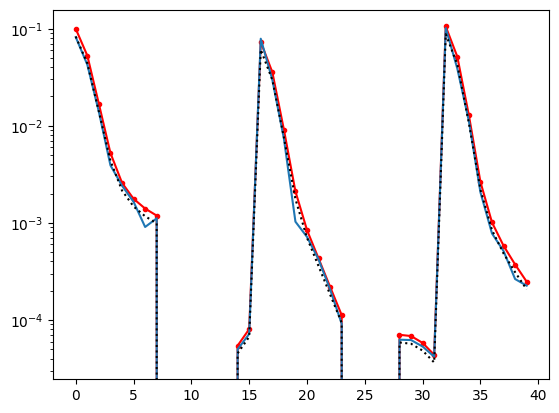

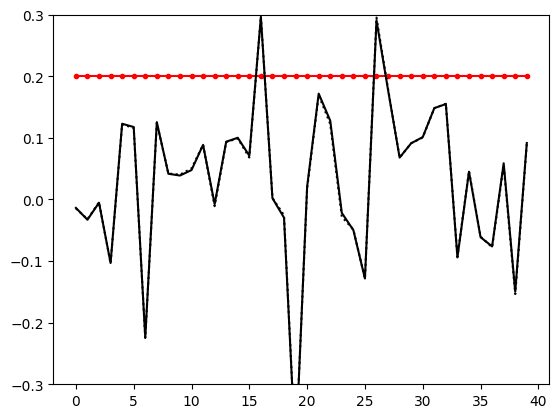

step: 115 0.21026159508493697
step: 116 0.19764589937984073
step: 117 0.18578714541705027


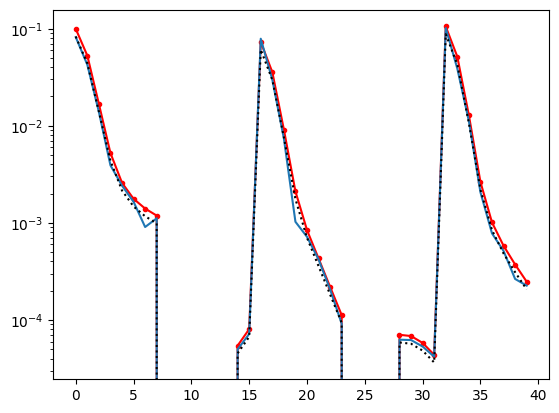

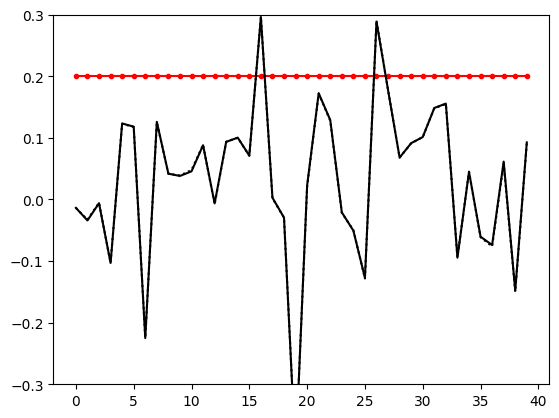

step: 118 0.17463991669202725
step: 119 0.1641615216905056
step: 120 0.15431183038907526


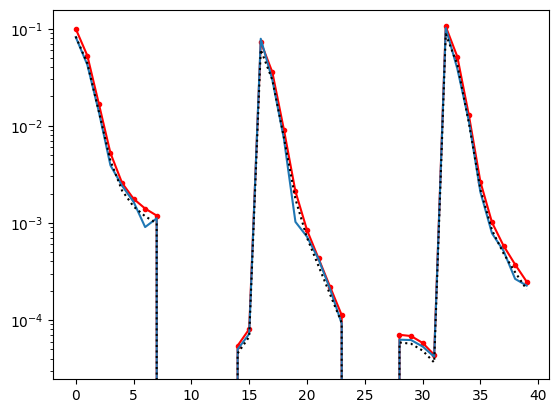

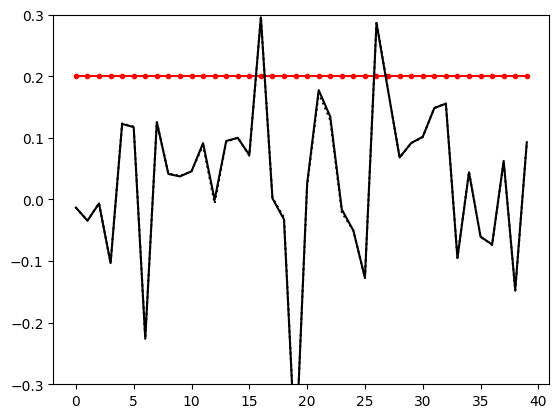

step: 121 0.5
step: 122 0.47
step: 123 0.44179999999999997


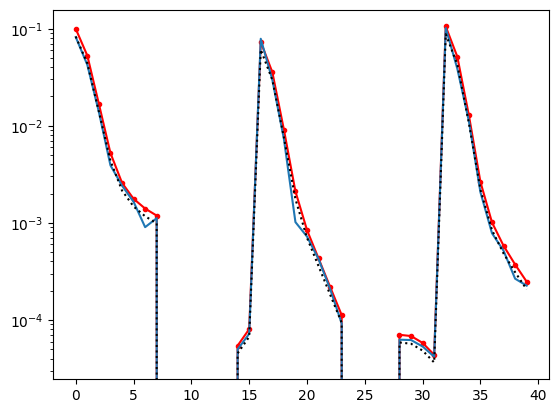

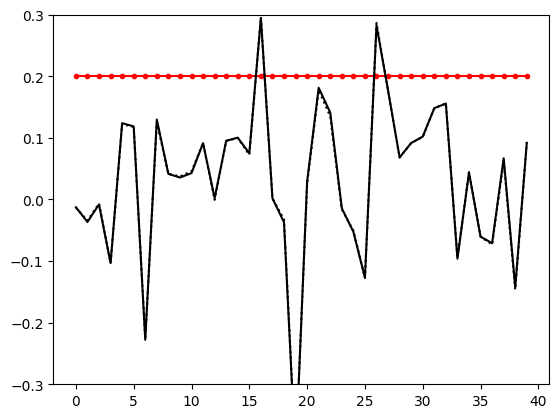

step: 124 0.41529199999999994
step: 125 0.3903744799999999
step: 126 0.3669520111999999


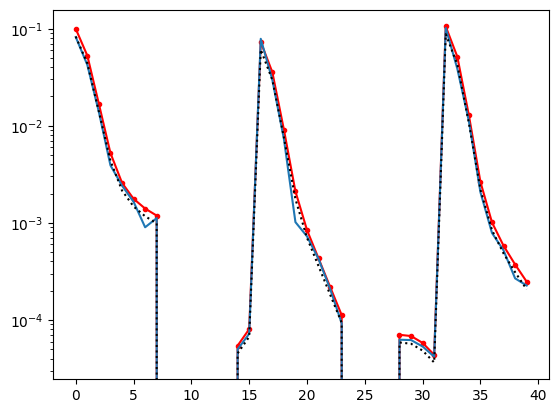

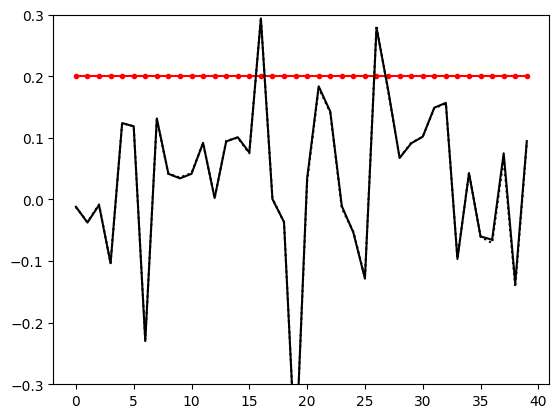

step: 127 0.34493489052799986
step: 128 0.32423879709631986
step: 129 0.30478446927054065


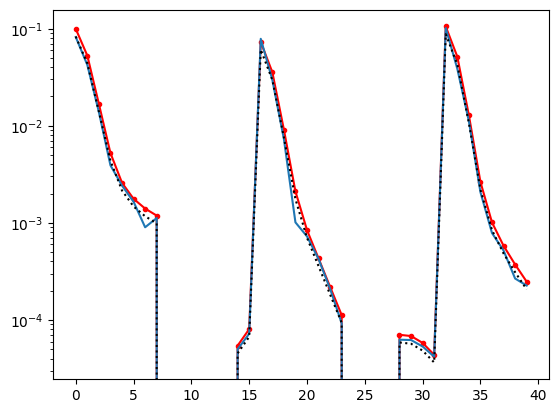

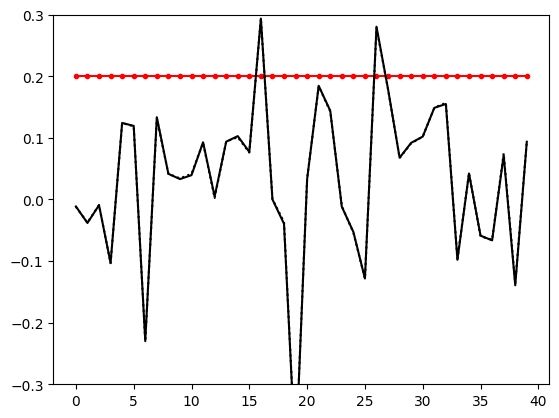

step: 130 0.2864974011143082
step: 131 0.2693075570474497
step: 132 0.2531491036246027


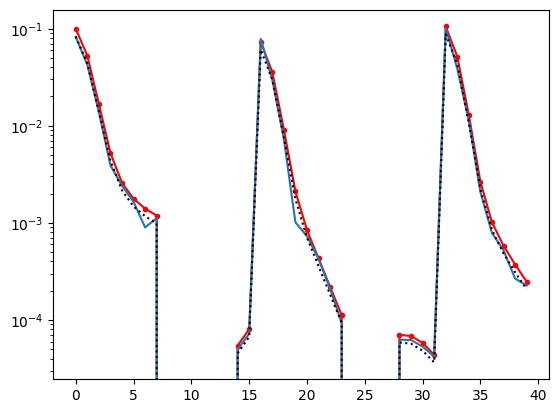

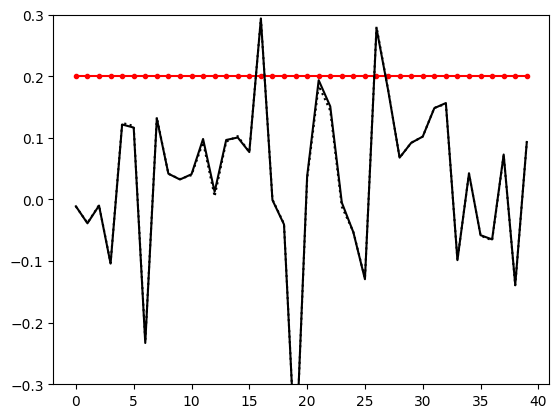

step: 133 0.2379601574071265
step: 134 0.2236825479626989
step: 135 0.21026159508493697


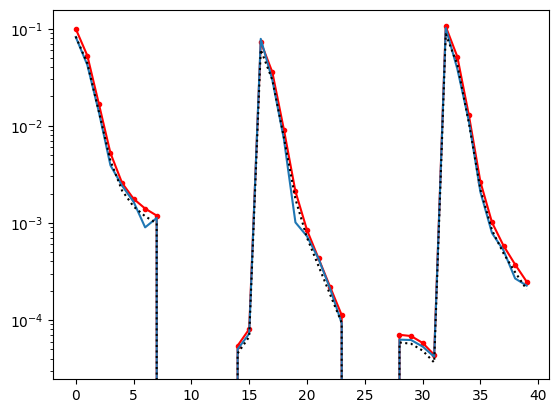

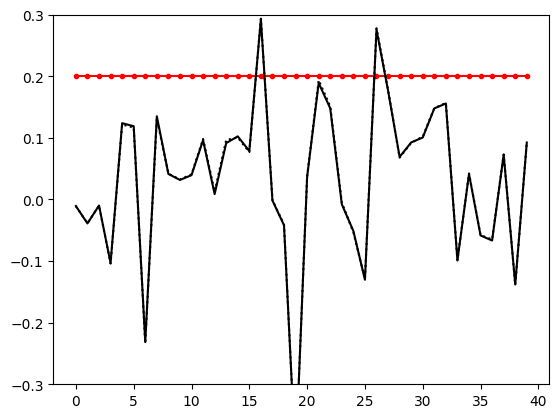

step: 136 0.19764589937984073
step: 137 0.18578714541705027
step: 138 0.17463991669202725


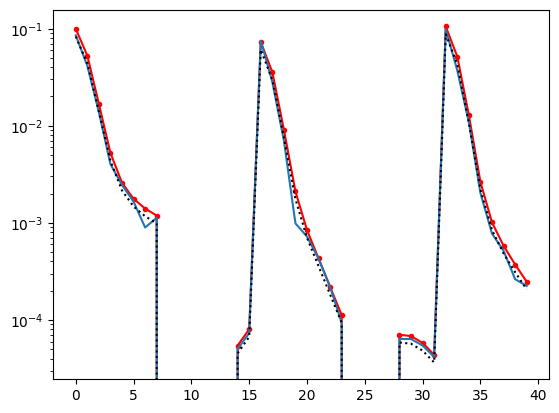

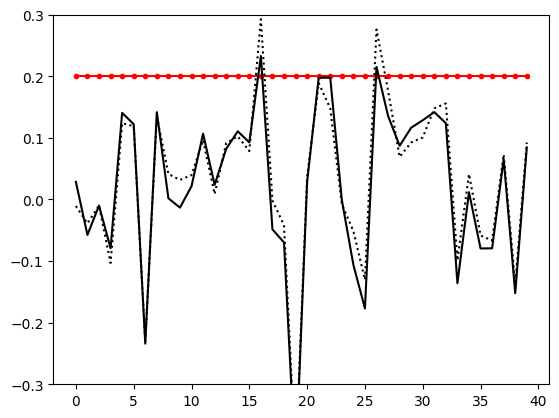

step: 139 0.1641615216905056
step: 140 0.15431183038907526
step: 141 0.5


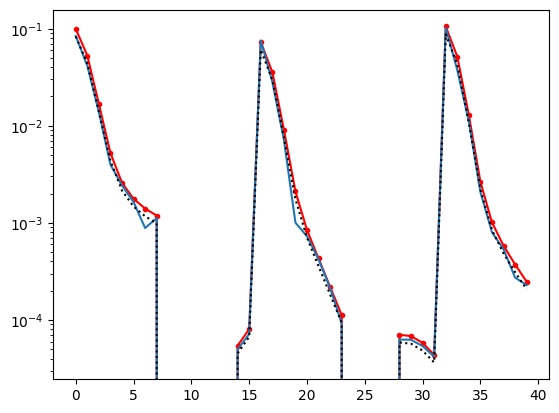

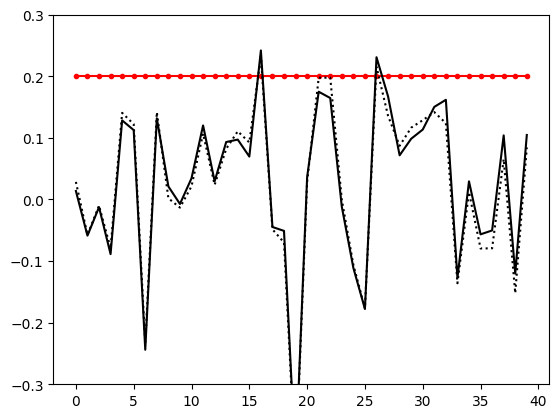

step: 142 0.47
step: 143 0.44179999999999997
step: 144 0.41529199999999994


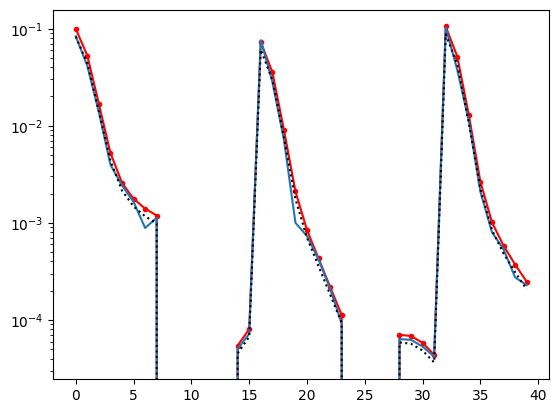

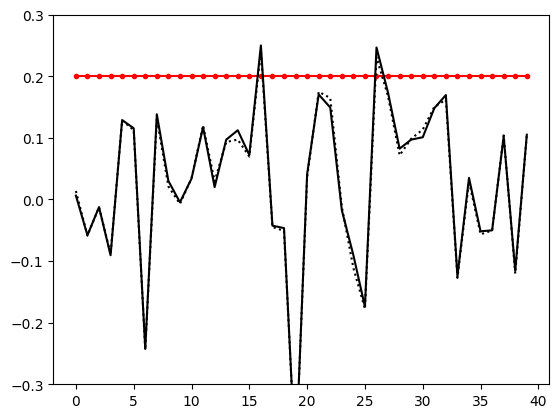

step: 145 0.3903744799999999
step: 146 0.3669520111999999
step: 147 0.34493489052799986


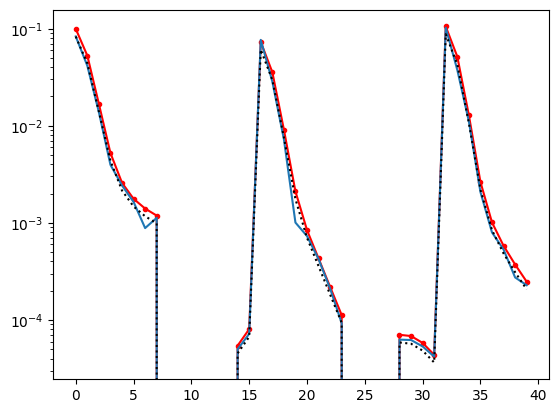

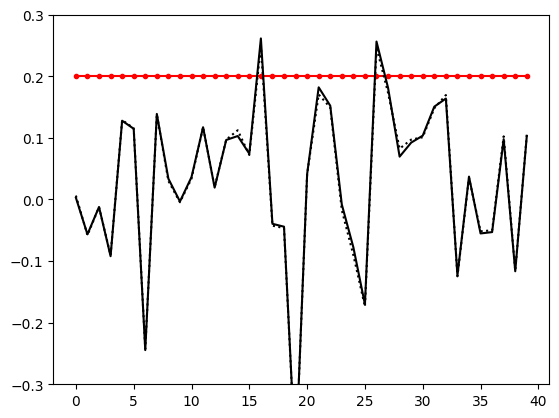

step: 148 0.32423879709631986
step: 149 0.30478446927054065
step: 150 0.2864974011143082


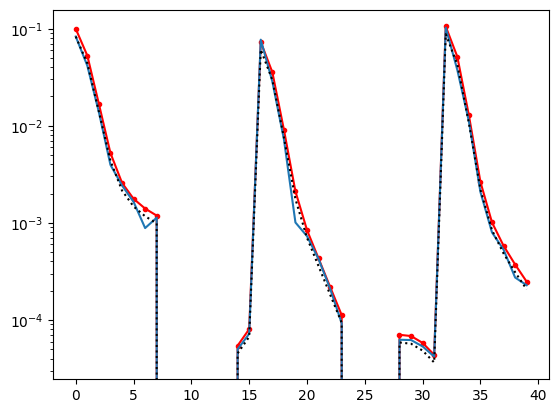

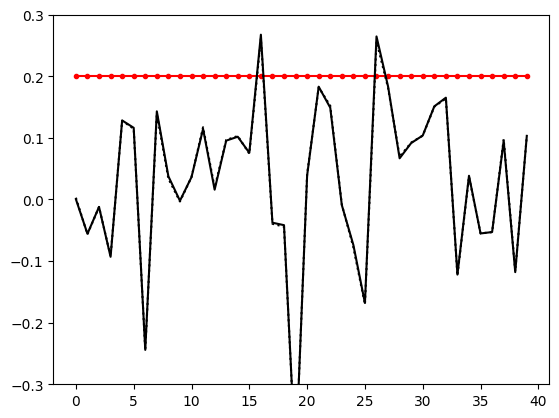

step: 151 0.2693075570474497
step: 152 0.2531491036246027
step: 153 0.2379601574071265


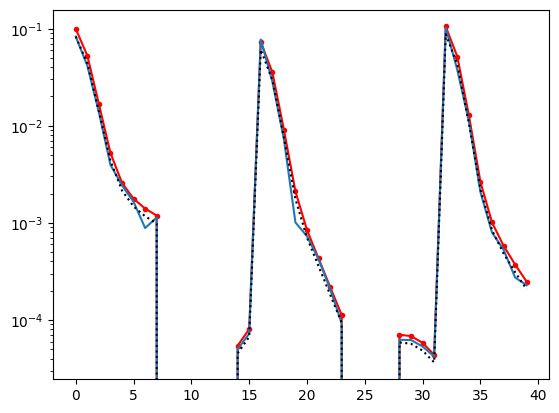

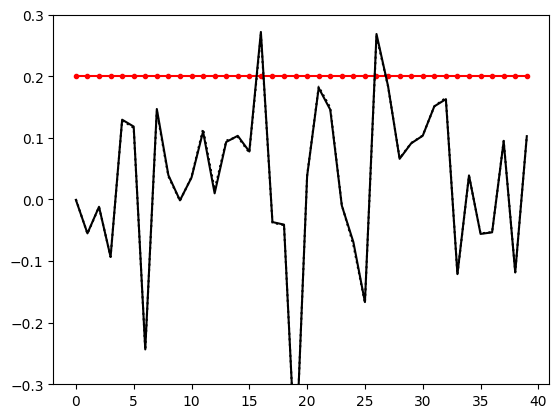

step: 154 0.2236825479626989
step: 155 0.21026159508493697
step: 156 0.19764589937984073


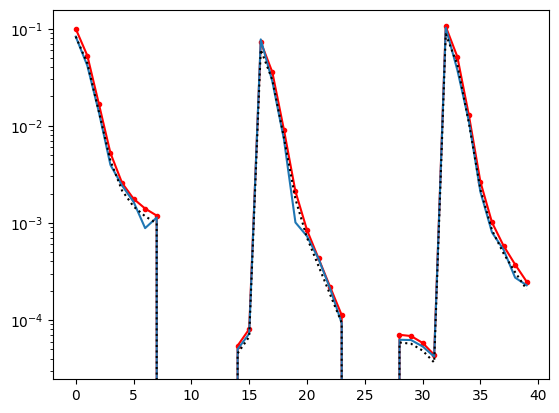

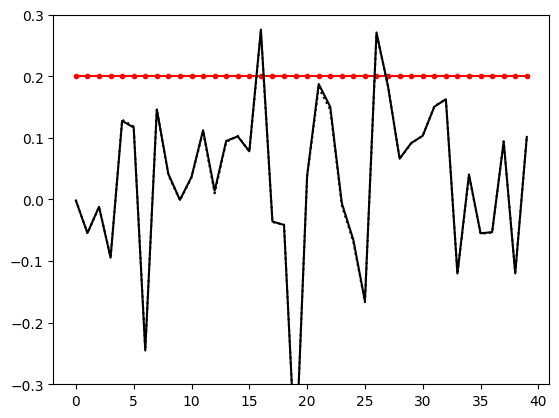

step: 157 0.18578714541705027
step: 158 0.17463991669202725
step: 159 0.1641615216905056


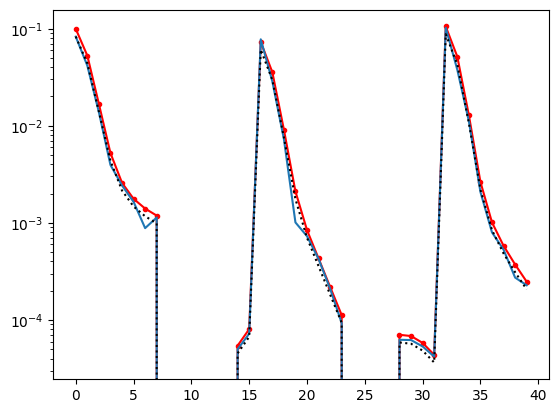

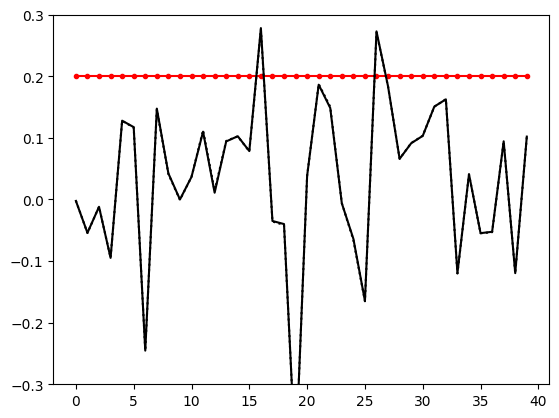

step: 160 0.15431183038907526
step: 161 0.5
step: 162 0.47


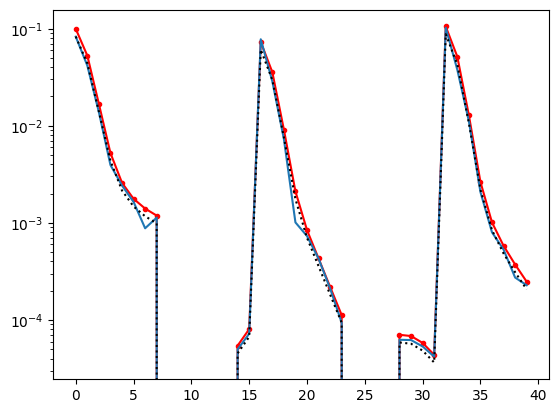

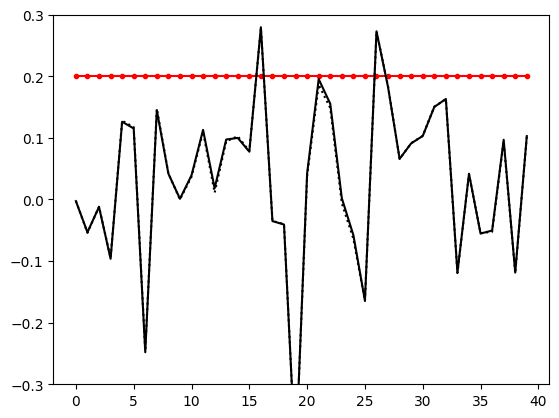

step: 163 0.44179999999999997
step: 164 0.41529199999999994
step: 165 0.3903744799999999


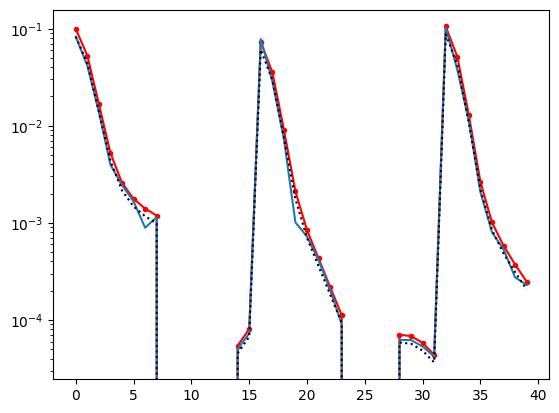

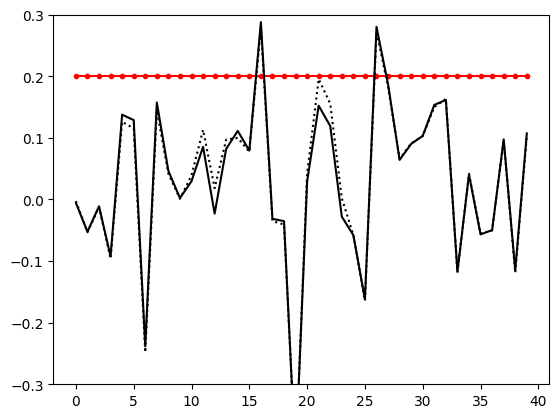

step: 166 0.3669520111999999
step: 167 0.34493489052799986
step: 168 0.32423879709631986


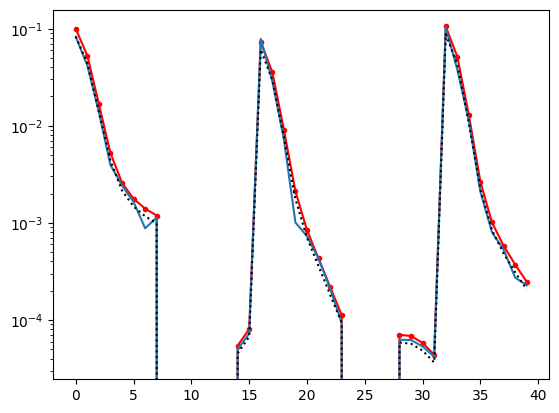

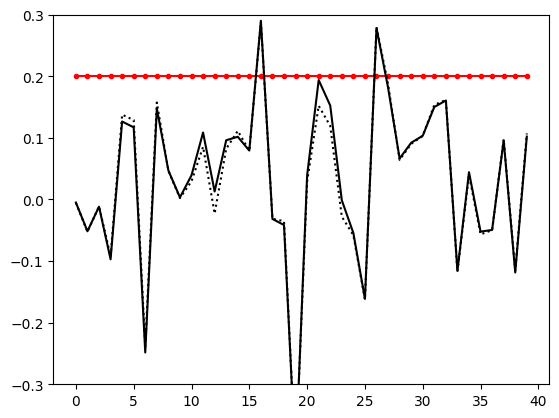

step: 169 0.30478446927054065
step: 170 0.2864974011143082
step: 171 0.2693075570474497


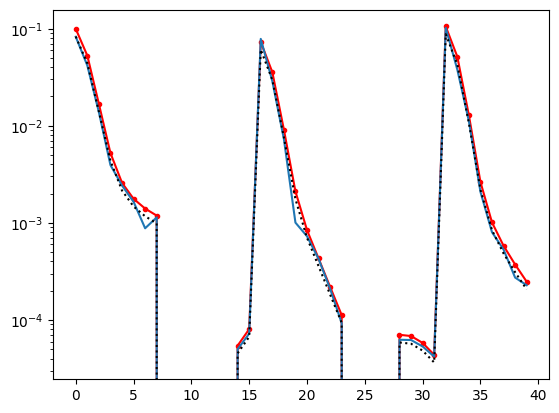

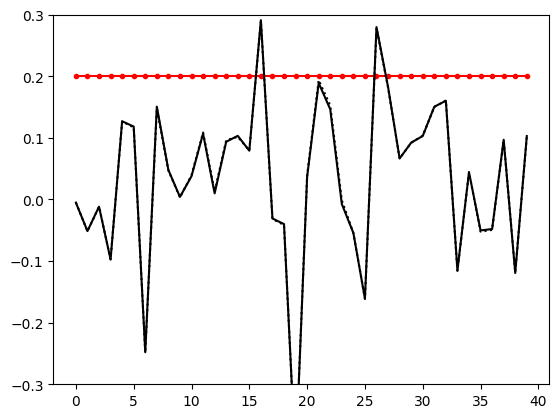

step: 172 0.2531491036246027
step: 173 0.2379601574071265
step: 174 0.2236825479626989


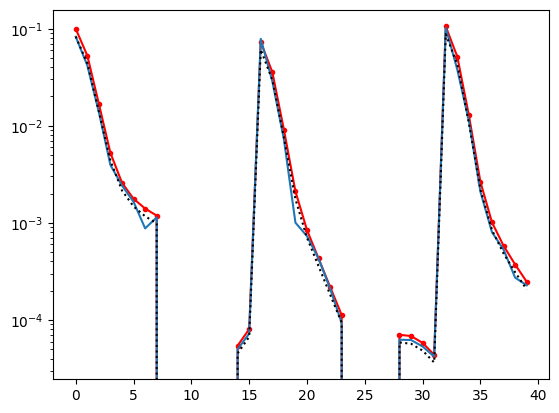

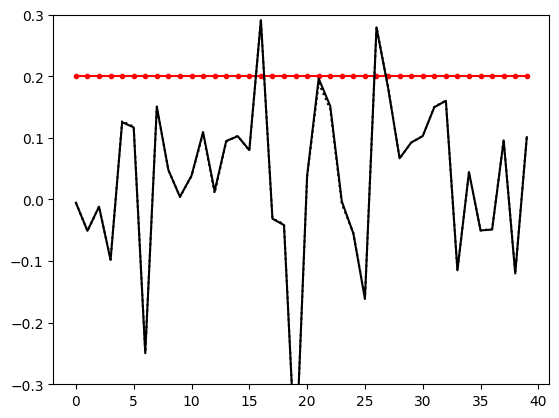

step: 175 0.21026159508493697
step: 176 0.19764589937984073
step: 177 0.18578714541705027


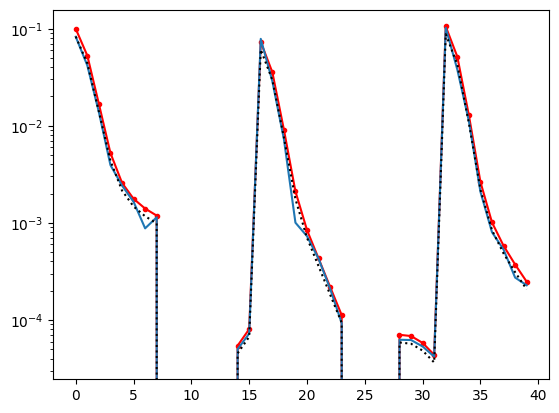

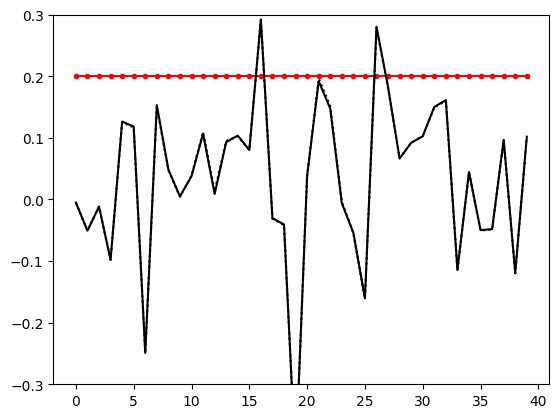

step: 178 0.17463991669202725
step: 179 0.1641615216905056
step: 180 0.15431183038907526


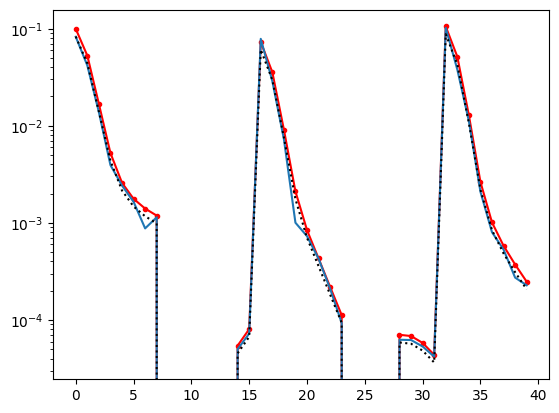

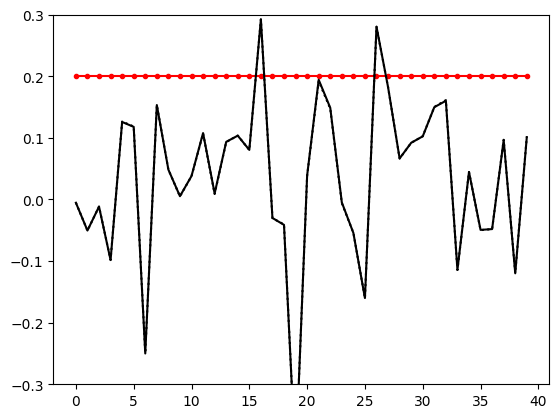

step: 181 0.5
step: 182 0.47
step: 183 0.44179999999999997


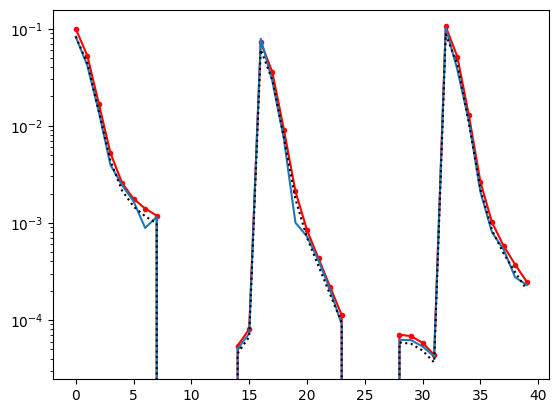

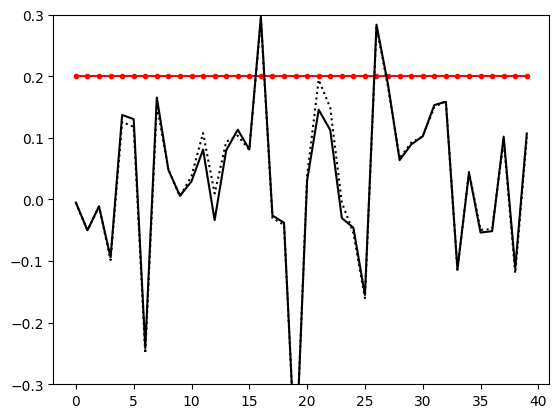

step: 184 0.41529199999999994
step: 185 0.3903744799999999
step: 186 0.3669520111999999


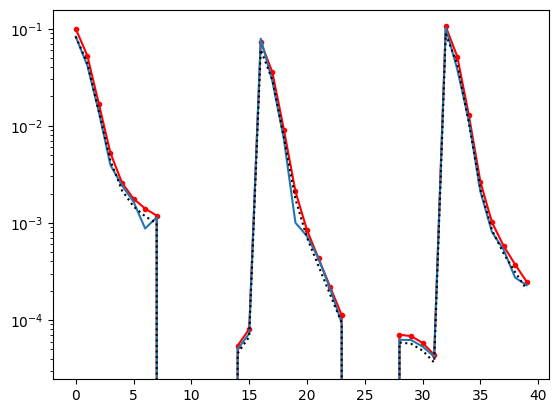

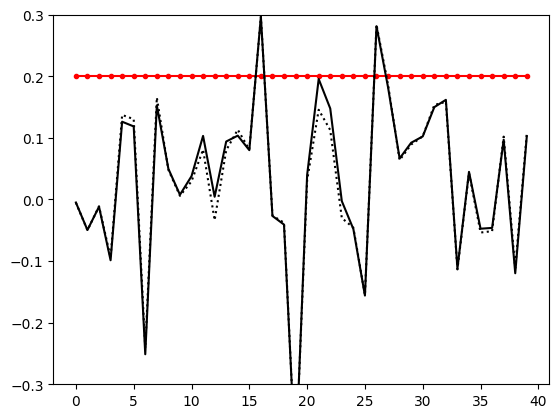

step: 187 0.34493489052799986
step: 188 0.32423879709631986
step: 189 0.30478446927054065


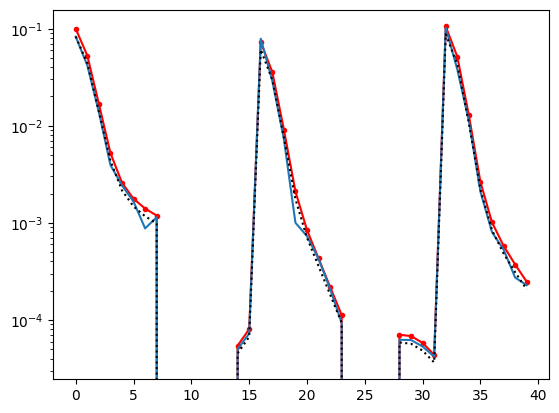

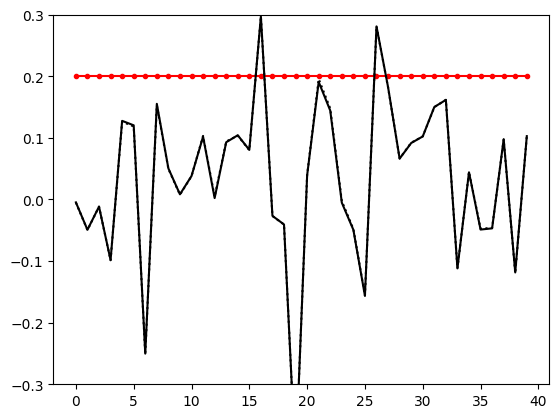

step: 190 0.2864974011143082
step: 191 0.2693075570474497
step: 192 0.2531491036246027


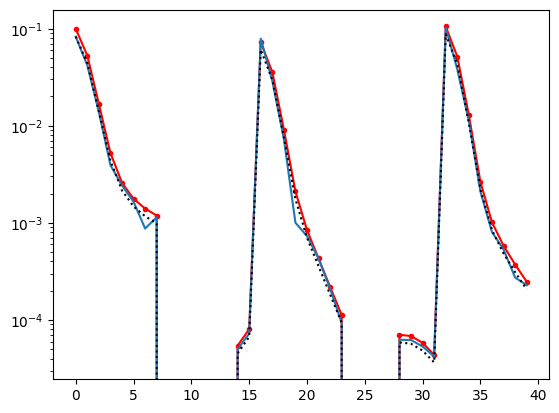

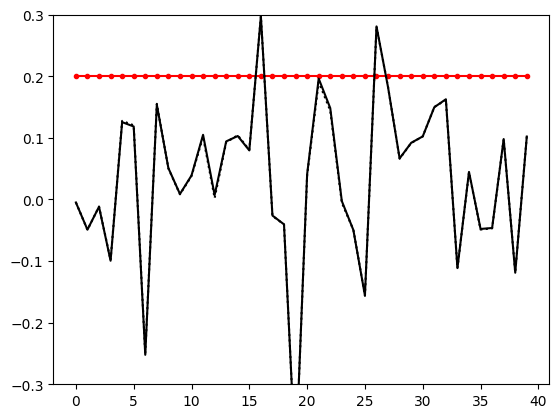

step: 193 0.2379601574071265
step: 194 0.2236825479626989
step: 195 0.21026159508493697


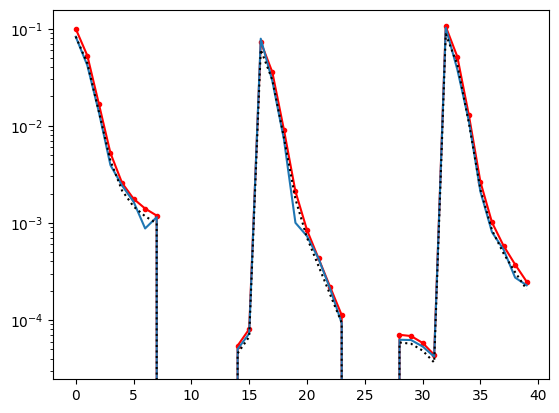

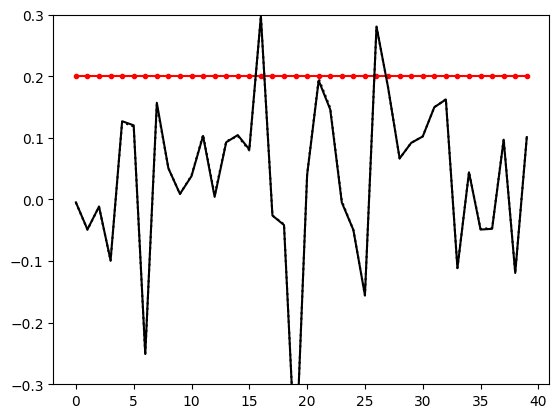

step: 196 0.19764589937984073
step: 197 0.18578714541705027
step: 198 0.17463991669202725


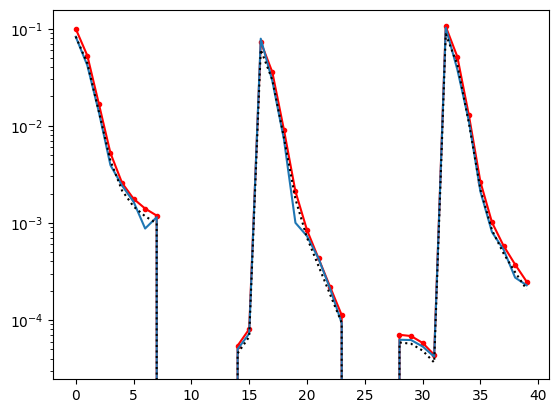

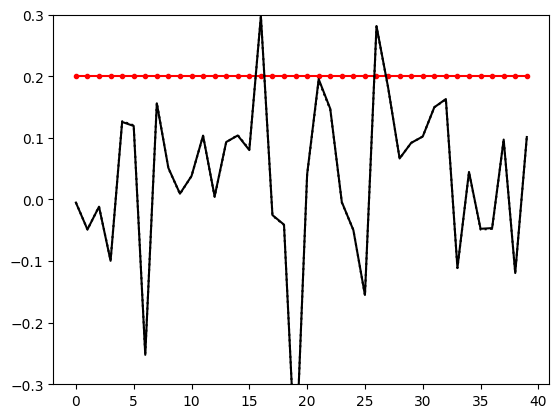

step: 199 0.1641615216905056
step: 200 0.15431183038907526


In [27]:
from datetime import datetime, timedelta
from jax.scipy.optimize import minimize

from multiprocessing.pool import ThreadPool as Pool 
pool = Pool() #jax pmap? check re-compilation times?
pmap = pool.map

#method = 'L-BFGS-B'
method = "l-bfgs-experimental-do-not-rely-on-this"
θ_rtol = 1e-5
z_rtol = 1e-5

θ_tol = 1e-5
z_tol = 1e-6

history = []
α=0.7
beta = 0.25

θ̃ = start_point
θ = start_point# if result.θ is not None else θ_start)
θL = start_point
Nθ = len(ravel_θ(θ̃))
time = timedelta(0)
for i in range(1, maxsteps+1):
        print("step:",i,α)
        t0 = datetime.now()

        if i > 1:
            xs = [x_data] + [prob.sample_x_z(_rng, θ)[0] for _rng in _split_rng(rng,nsims)]
            θ_tol = np.sqrt(-np.diag(H̃_inv_post)) * θ_rtol

        if i > 2:
            Δθ̃ = ravel_θ(history[-1]["θ̃"])- ravel_θ(history[-2]["θ̃"])
          #  if np.sqrt(-np.inner(Δθ̃, np.inner(np.linalg.pinv(history[-1]["H̃_inv_post"]), Δθ̃))) < θ_rtol:
           #     break

        # MUSE gradient
        def get_MAPs(x_z):
            x, ẑ_prev = x_z
            result = prob.z_MAP_and_score(x, ẑ_prev, θ, method=method, z_tol=z_tol, θ_tol=θ_tol)
            
            return result

        MAPs = list(pmap(get_MAPs, zip(xs, ẑs)))

        ẑs = [MAP.z for MAP in MAPs]
   #     if save_MAP_history:
    #        MAP_history_dat, *MAP_history_sims = [MAP.history for MAP in MAPs]
        s_MAP_dat, *s_MAP_sims = [MAP.s for MAP in MAPs]
        s̃_MAP_dat, *s̃_MAP_sims = [MAP.s̃ for MAP in MAPs]
        s̃_MUSE = unravel_θ(ravel_θ(s̃_MAP_dat) - np.nanmean(np.stack(list(map(ravel_θ, s̃_MAP_sims))), axis=0))
        s̃_prior, H̃_prior = gradθ_hessθ_logPrior(θ̃, transformed_θ=True)
        s̃_post = unravel_θ(ravel_θ(s̃_MUSE) + ravel_θ(s̃_prior))

        # print(s̃_MAP_sims)
        # H̃_inv_like_sims = np.diag(-1 / np.nanvar(np.stack(list(map(ravel_θ, s̃_MAP_sims))), axis=0))
        epsilon = 1e-8  # A small value to avoid division by zero
        variance = np.nanvar(np.stack(list(map(ravel_θ, s̃_MAP_sims))), axis=0)
        variance += epsilon  # Add epsilon to the variance to prevent zero values
        H̃_inv_like_sims = np.diag(-1 / variance)
        # print(H̃_inv_like_sims)
        
       # try:
        # H̃_inv_post = np.linalg.pinv(np.linalg.pinv(H̃_inv_like_sims) + ravel_θ(H̃_prior).reshape(Nθ,Nθ))
        H̃_inv_post = np.linalg.pinv(np.linalg.pinv(H̃_inv_like_sims) + ravel_θ(H̃_prior).reshape(Nθ,Nθ))
        #except:
        #    print("error on Hessian inversion calc, prior ignored and trying again...")
       # H̃_inv_post = H̃_inv_like_sims
        t = datetime.now() - t0
        time += t

        history.append({
            "t":t, "θ̃":θ̃, "θ":θ,
            "s_MAP_dat": s_MAP_dat, "s_MAP_sims": s_MAP_sims,
            "s̃_MAP_dat": s̃_MAP_dat, "s̃_MAP_sims": s̃_MAP_sims, 
            "s̃_MUSE": s̃_MUSE,
            "s̃_prior": s̃_prior, "s̃_post": s̃_post, 
            "H̃_inv_post": H̃_inv_post, "H̃_prior": H̃_prior, 
            "H̃_inv_like_sims": H̃_inv_like_sims,
            "θ_tol": θ_tol,
        #    "MAP_history_dat": MAP_history_dat, 
         #   "MAP_history_sims": MAP_history_sims,
        })
        θ̃update = np.clip((np.inner(H̃_inv_post, ravel_θ(s̃_post))),-jnp.abs(ravel_θ(θ̃)*beta),jnp.abs(ravel_θ(θ̃)*beta))
        θ̃ = unravel_θ((ravel_θ(θ̃) - α * θ̃update))
        θ = θ̃
        # print(((θ-tf_cut_flat)/tf_cut_flat))
        #print(θ)
        if i%3==0:
            plt.semilogy(start_point,"r.-")
            plt.plot(θ)
            plt.plot(tf_cut_flat,"k:")
            plt.show()
            
            
            plt.plot((start_point-tf_cut_flat)/tf_cut_flat,"r.-")
            plt.plot((θ-tf_cut_flat)/tf_cut_flat,"k")
            plt.plot((θL-tf_cut_flat)/tf_cut_flat,"k:")
    
            plt.ylim([-.3,.3])
            plt.show()
            
            θL = θ
            #LR decay
        if i%20==0 and i!=0:
            α = 0.5
        else:
            α *= 0.94

step: 200 0.5
step: 201 0.5


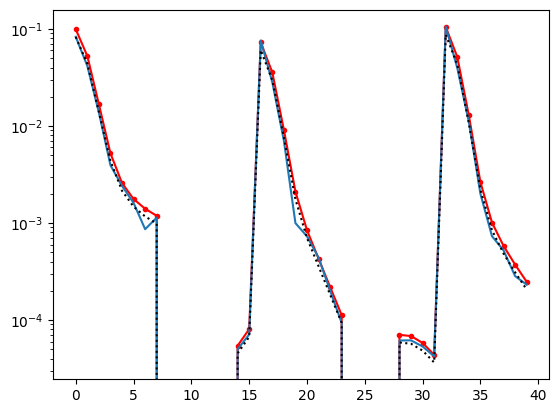

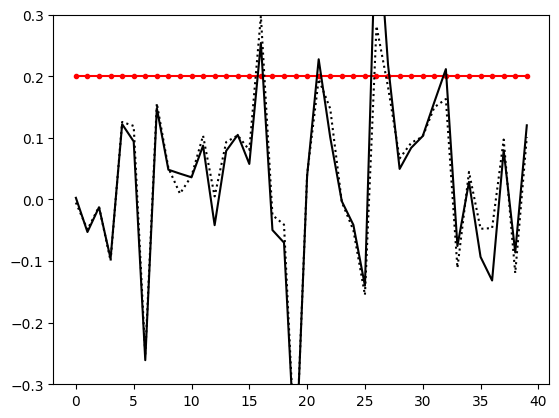

step: 202 0.45
step: 203 0.405
step: 204 0.36450000000000005


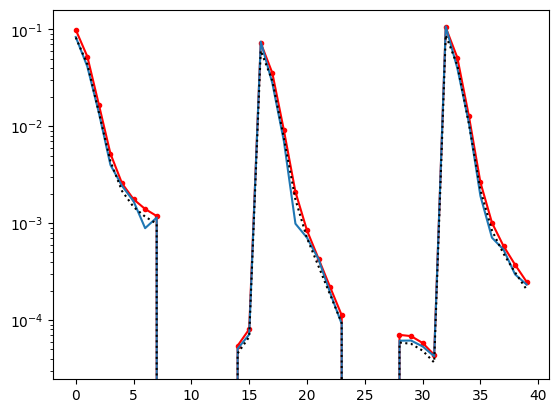

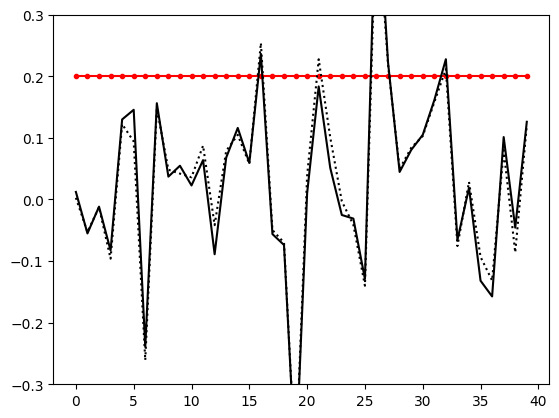

step: 205 0.32805000000000006
step: 206 0.2952450000000001
step: 207 0.2657205000000001


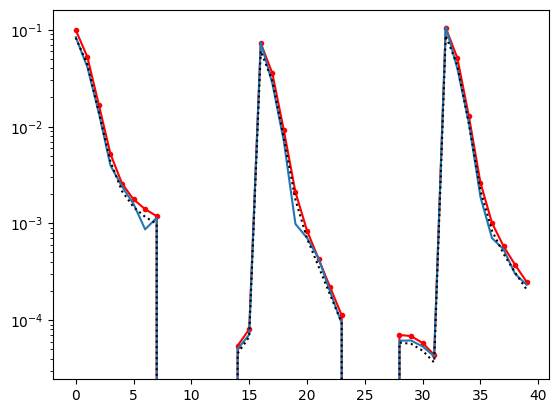

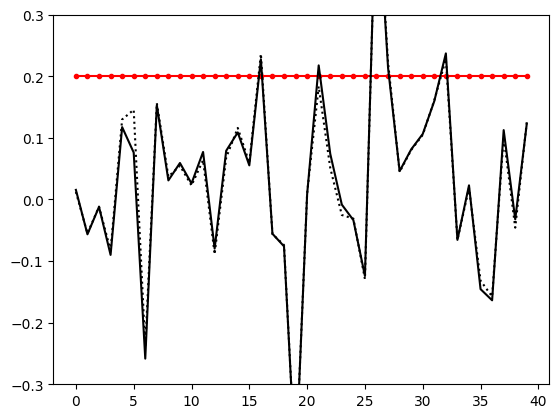

step: 208 0.23914845000000007
step: 209 0.21523360500000008
step: 210 0.19371024450000007


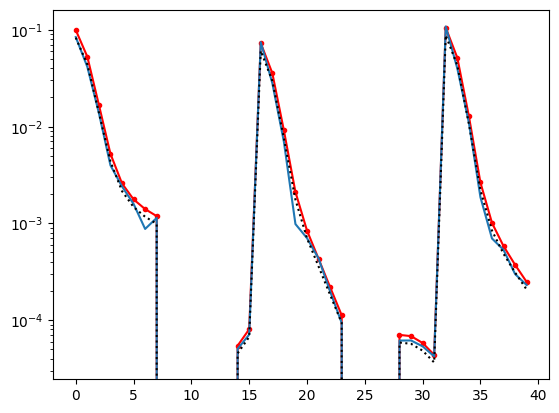

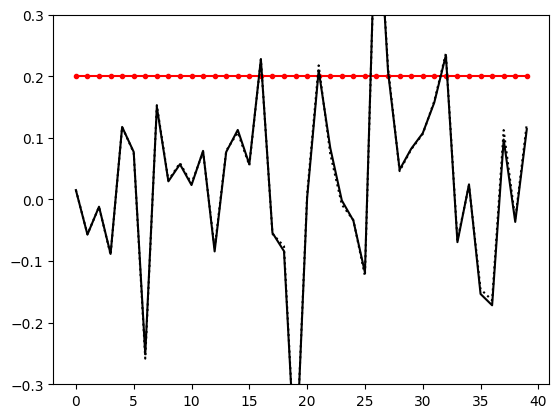

step: 211 0.17433922005000008
step: 212 0.15690529804500009
step: 213 0.14121476824050008


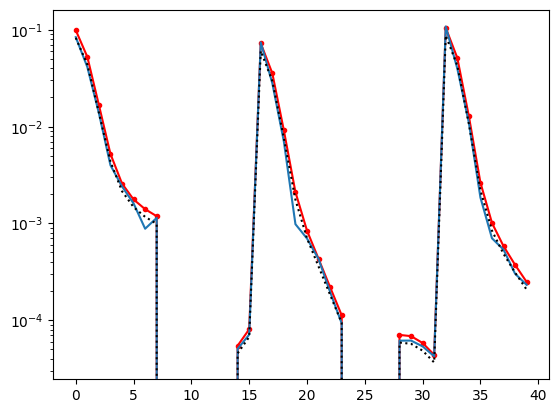

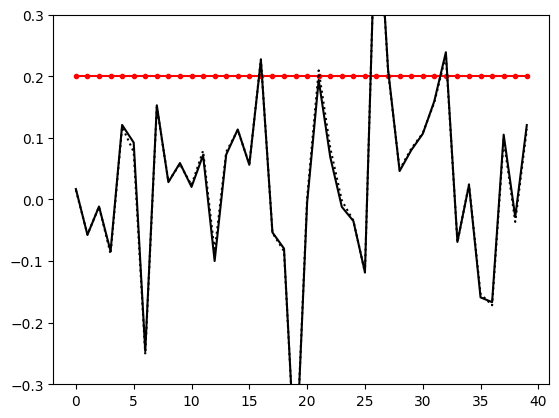

step: 214 0.12709329141645007
step: 215 0.11438396227480506
step: 216 0.10294556604732455


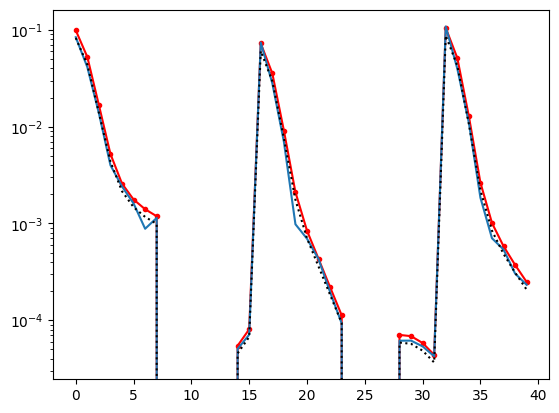

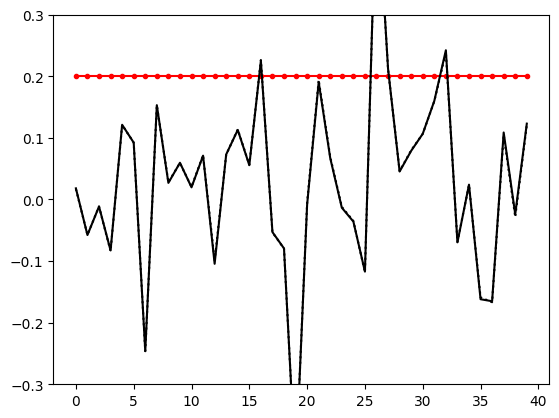

step: 217 0.0926510094425921
step: 218 0.08338590849833288
step: 219 0.0750473176484996


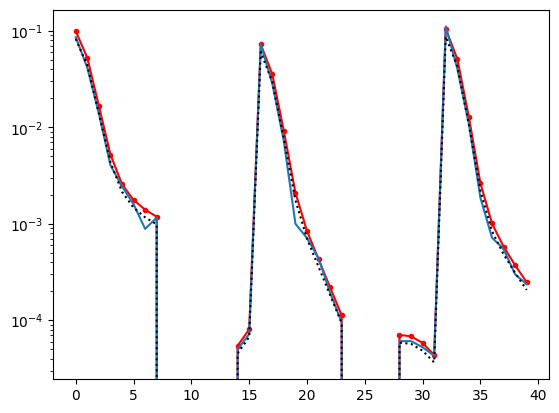

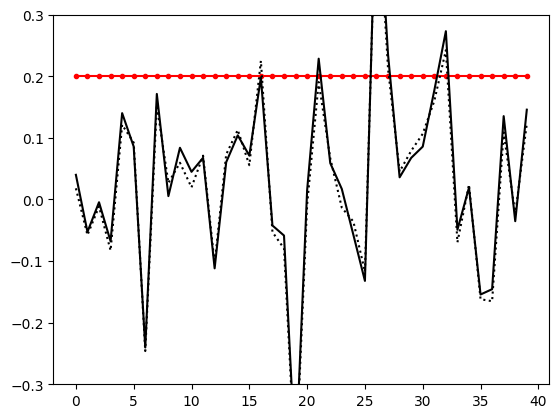

step: 220 0.06754258588364964
step: 221 0.5
step: 222 0.45


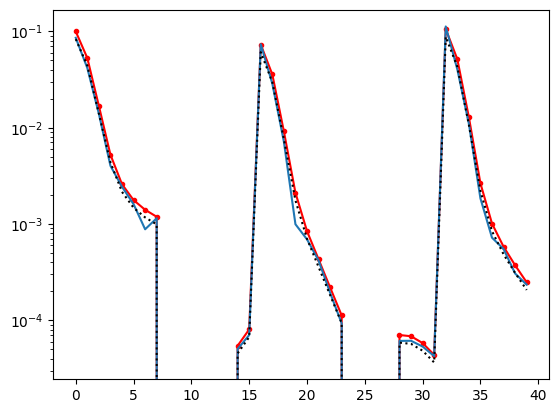

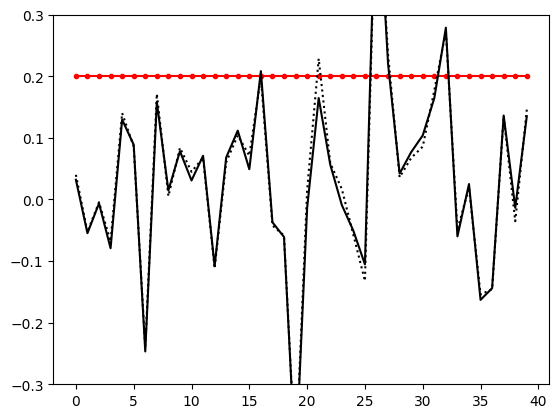

step: 223 0.405
step: 224 0.36450000000000005
step: 225 0.32805000000000006


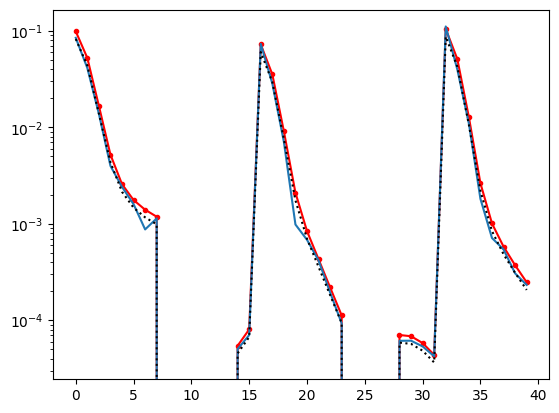

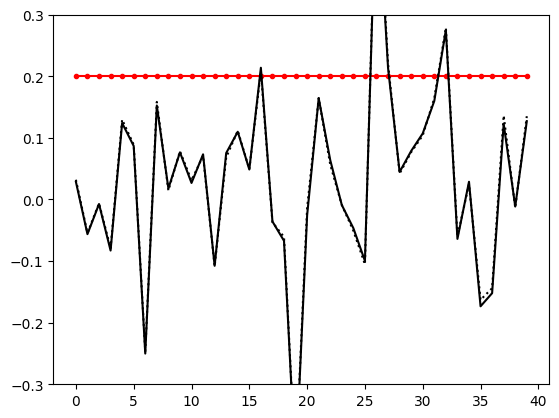

step: 226 0.2952450000000001
step: 227 0.2657205000000001
step: 228 0.23914845000000007


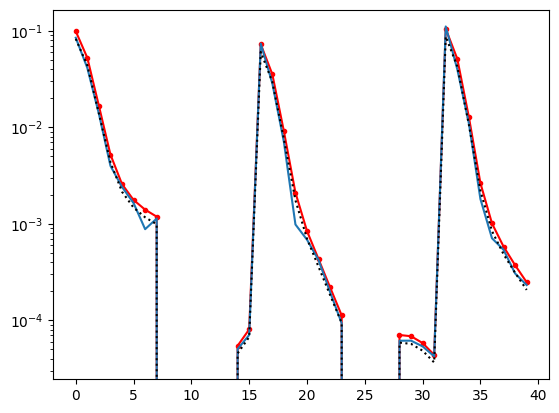

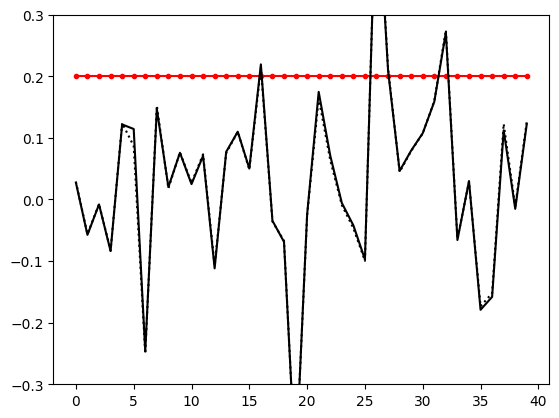

step: 229 0.21523360500000008
step: 230 0.19371024450000007
step: 231 0.17433922005000008


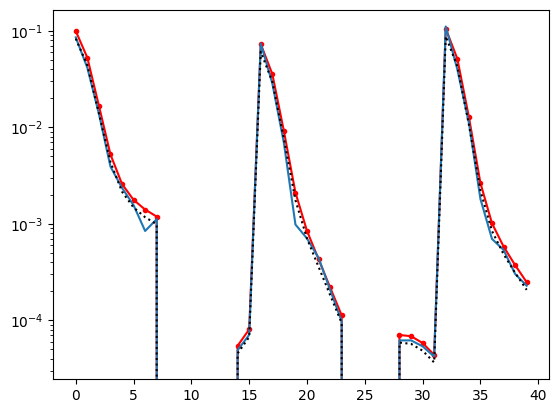

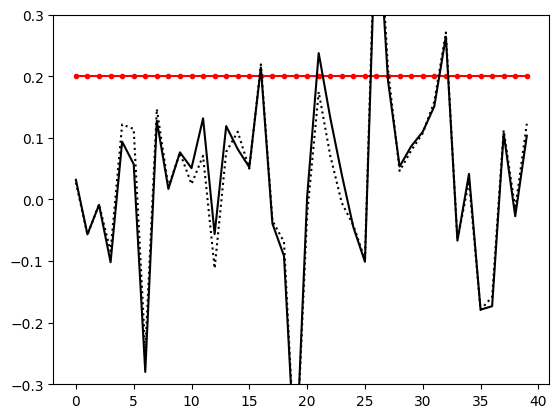

step: 232 0.15690529804500009
step: 233 0.14121476824050008
step: 234 0.12709329141645007


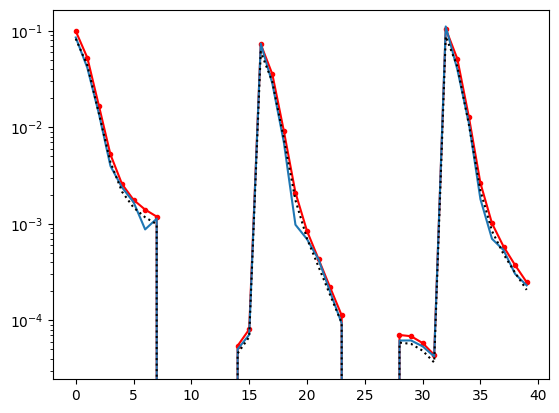

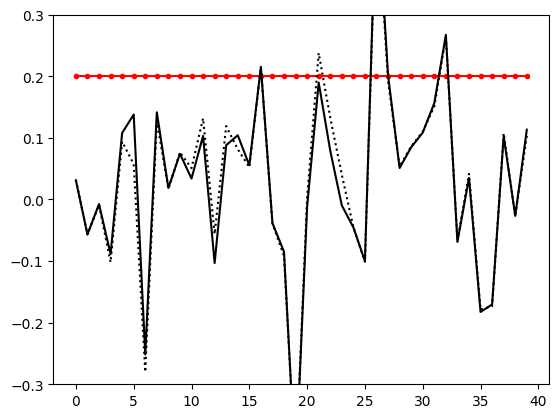

step: 235 0.11438396227480506
step: 236 0.10294556604732455
step: 237 0.0926510094425921


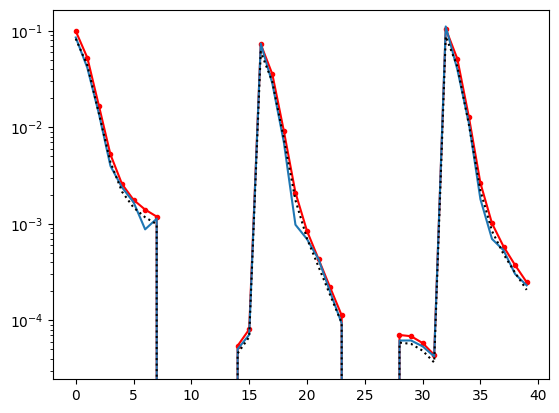

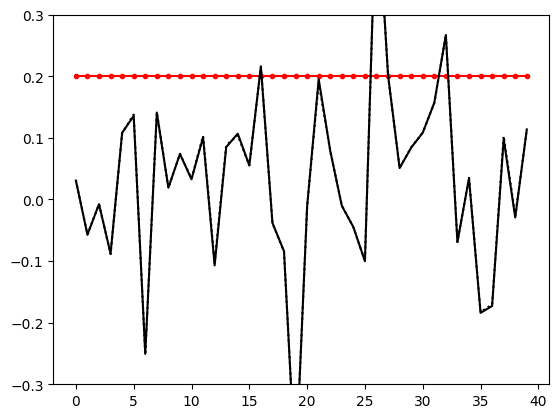

step: 238 0.08338590849833288
step: 239 0.0750473176484996
step: 240 0.06754258588364964


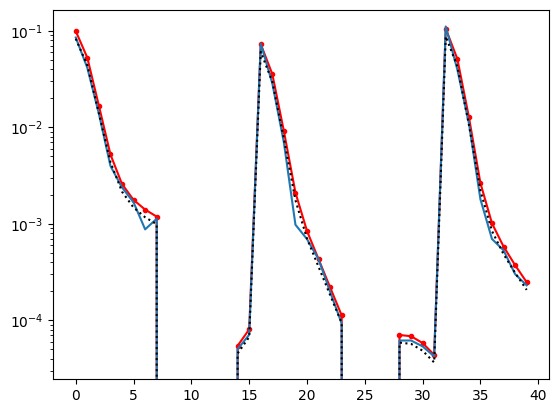

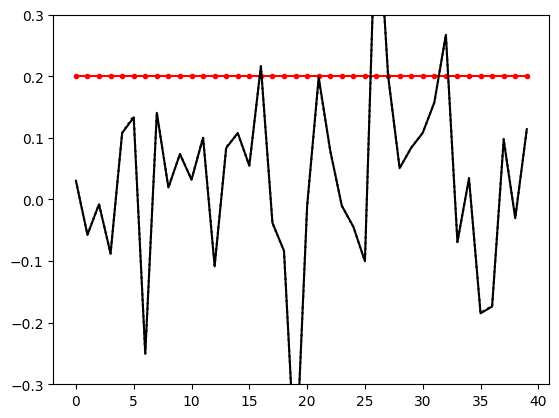

step: 241 0.5
step: 242 0.45
step: 243 0.405


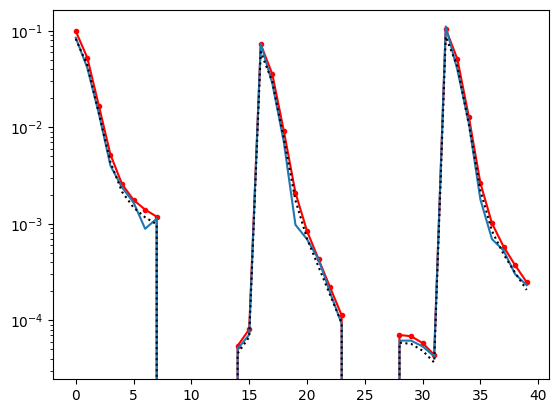

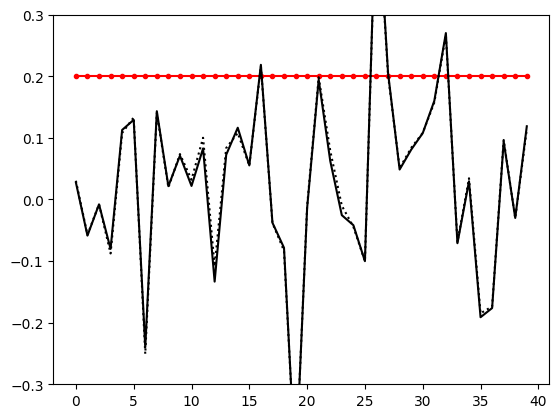

step: 244 0.36450000000000005
step: 245 0.32805000000000006
step: 246 0.2952450000000001


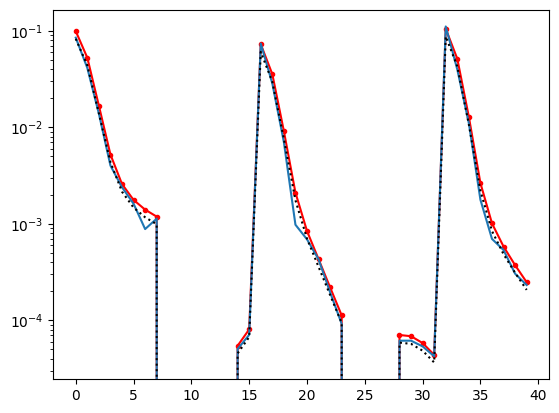

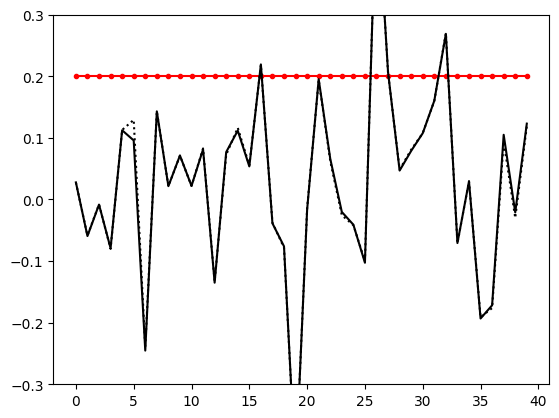

step: 247 0.2657205000000001
step: 248 0.23914845000000007
step: 249 0.21523360500000008


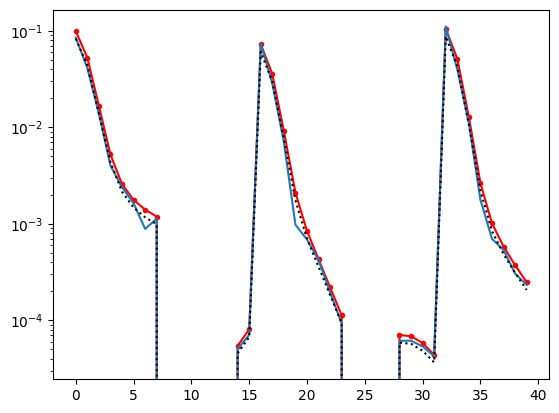

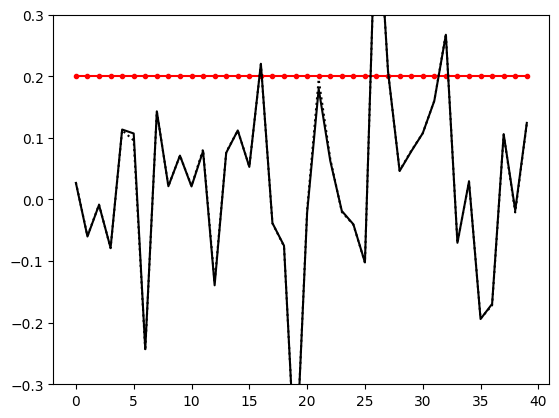

step: 250 0.19371024450000007
step: 251 0.17433922005000008
step: 252 0.15690529804500009


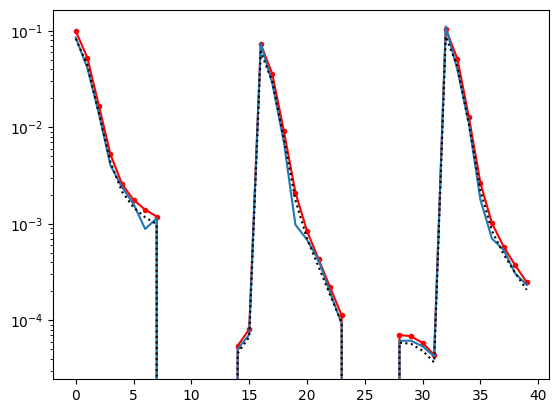

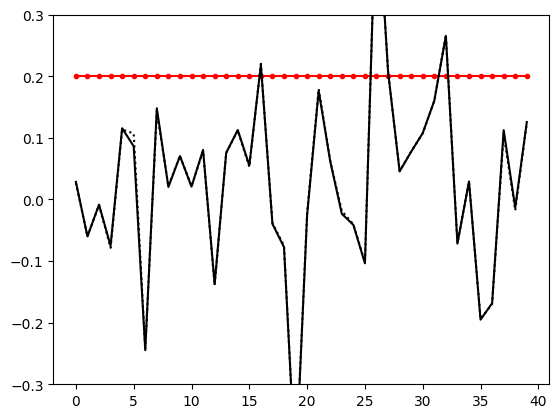

step: 253 0.14121476824050008
step: 254 0.12709329141645007
step: 255 0.11438396227480506


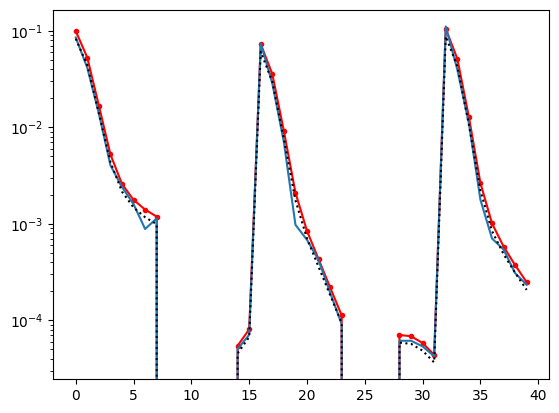

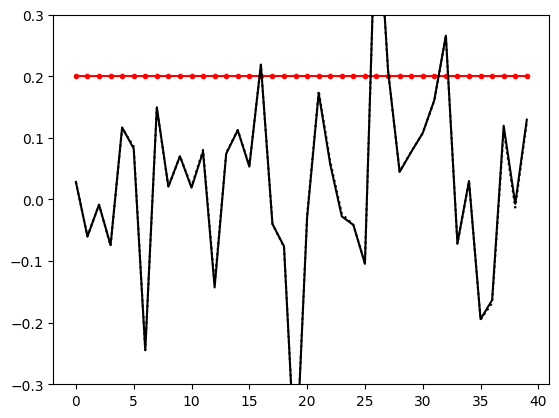

step: 256 0.10294556604732455
step: 257 0.0926510094425921
step: 258 0.08338590849833288


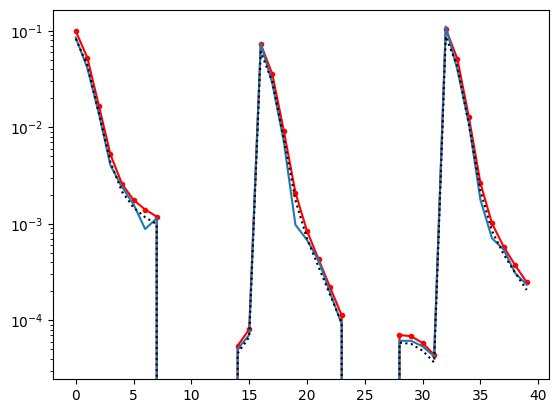

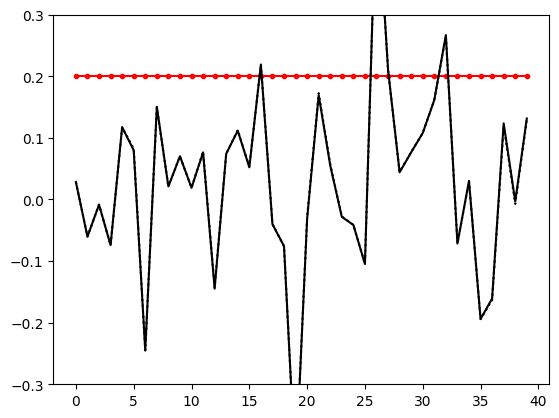

step: 259 0.0750473176484996
step: 260 0.06754258588364964
step: 261 0.5


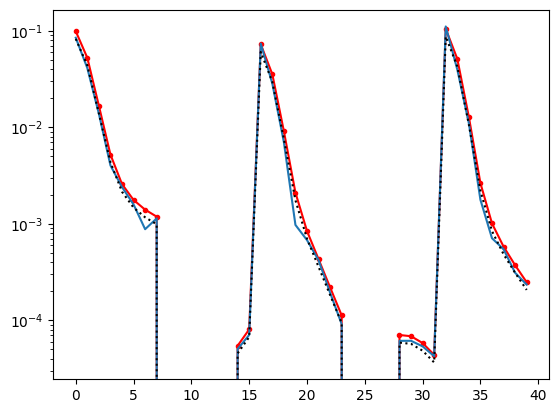

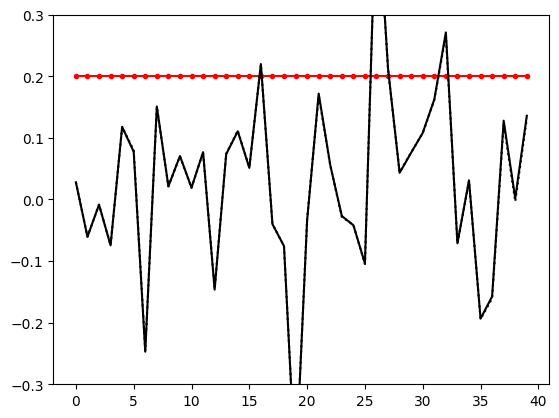

step: 262 0.45
step: 263 0.405
step: 264 0.36450000000000005


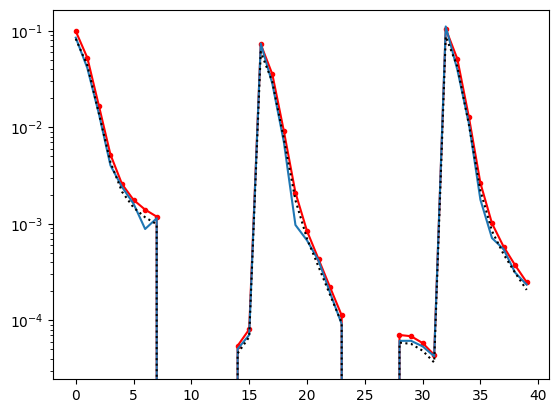

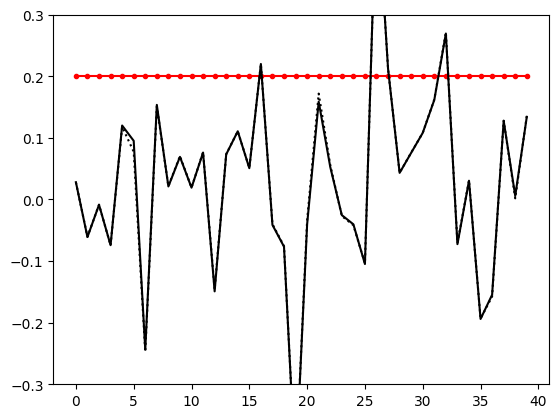

step: 265 0.32805000000000006
step: 266 0.2952450000000001
step: 267 0.2657205000000001


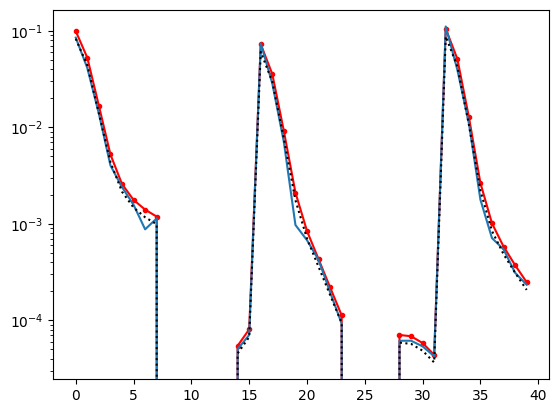

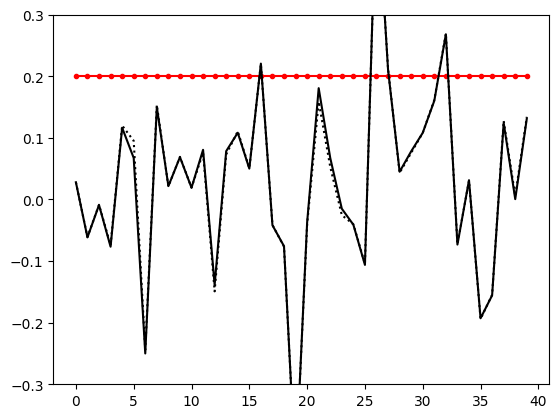

step: 268 0.23914845000000007
step: 269 0.21523360500000008
step: 270 0.19371024450000007


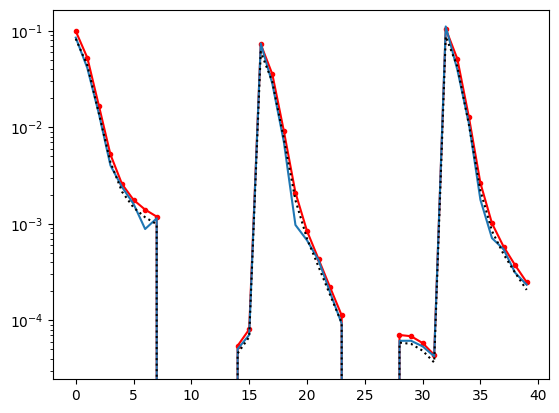

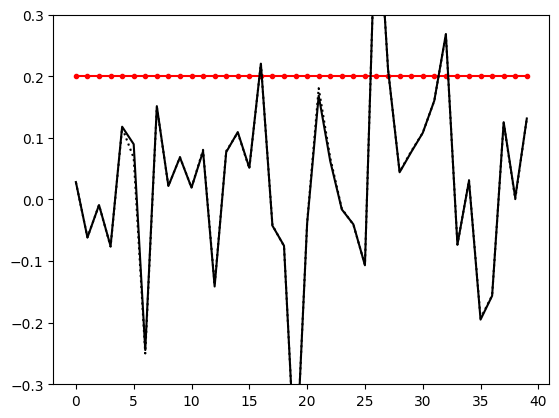

step: 271 0.17433922005000008
step: 272 0.15690529804500009
step: 273 0.14121476824050008


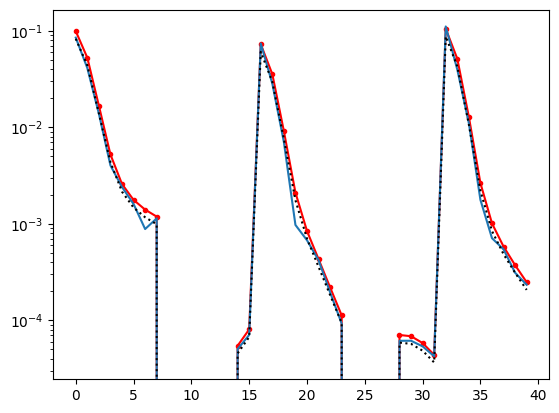

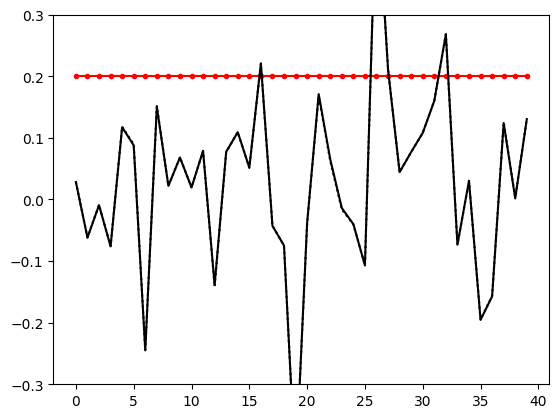

step: 274 0.12709329141645007
step: 275 0.11438396227480506
step: 276 0.10294556604732455


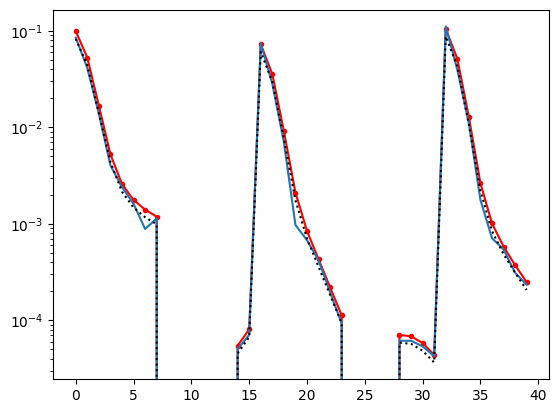

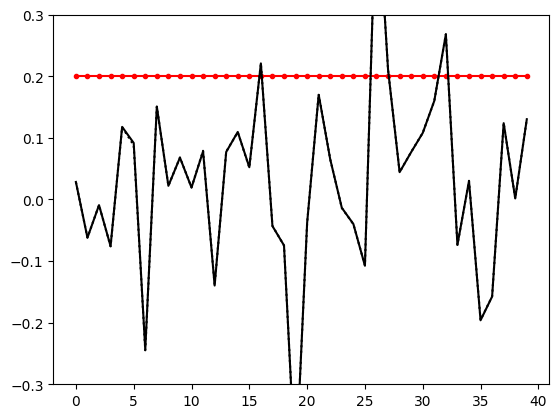

step: 277 0.0926510094425921
step: 278 0.08338590849833288
step: 279 0.0750473176484996


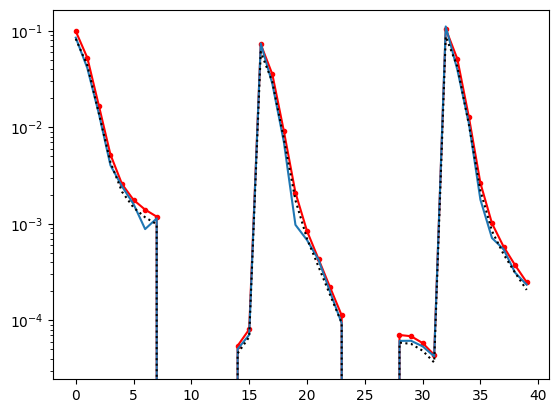

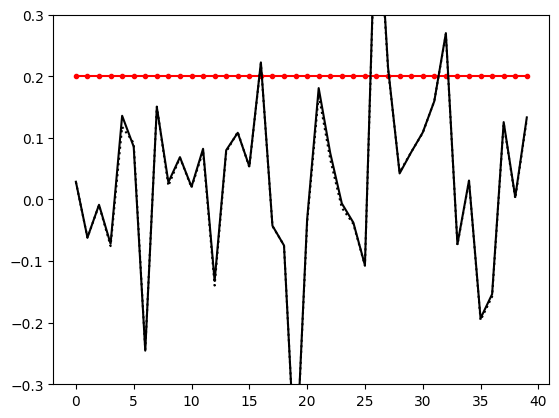

step: 280 0.06754258588364964
step: 281 0.5
step: 282 0.45


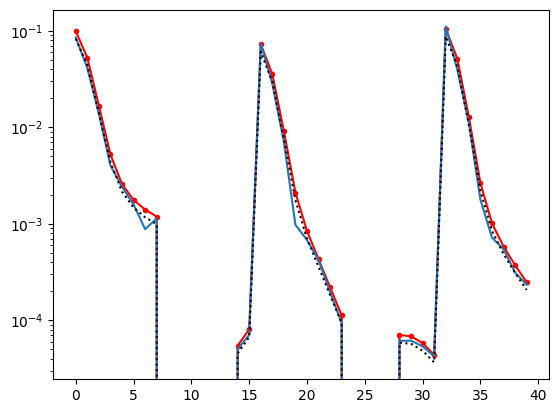

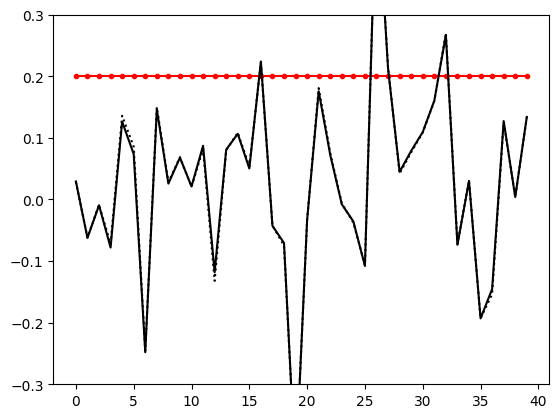

step: 283 0.405
step: 284 0.36450000000000005
step: 285 0.32805000000000006


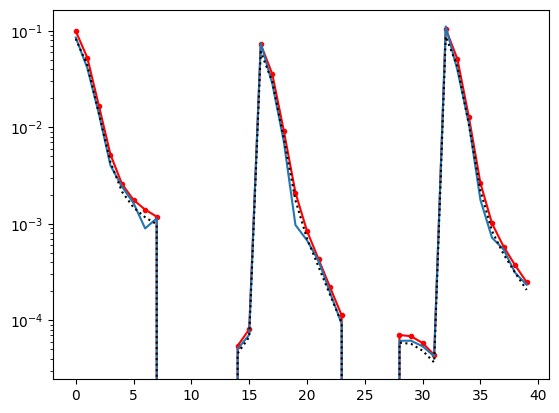

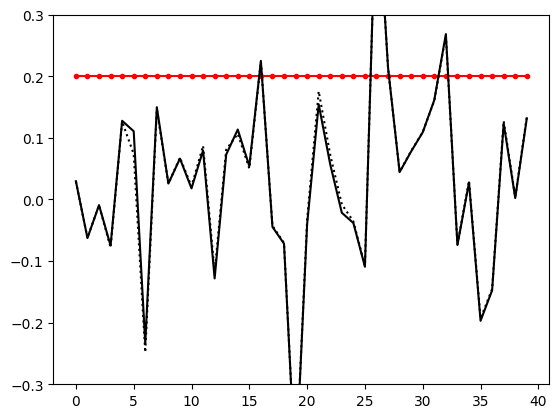

step: 286 0.2952450000000001
step: 287 0.2657205000000001
step: 288 0.23914845000000007


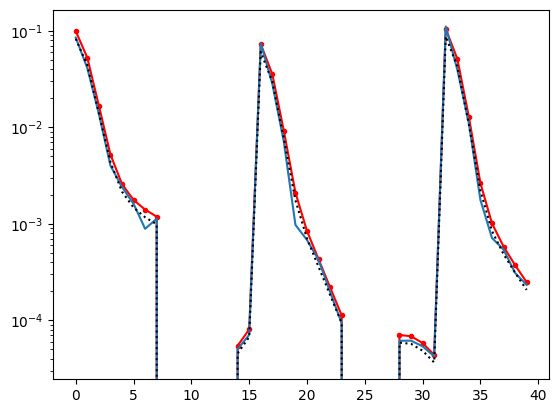

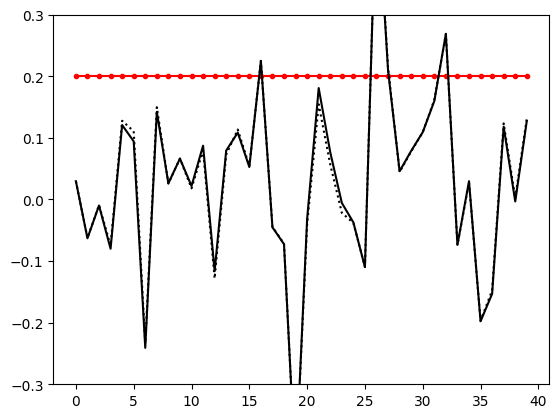

step: 289 0.21523360500000008
step: 290 0.19371024450000007
step: 291 0.17433922005000008


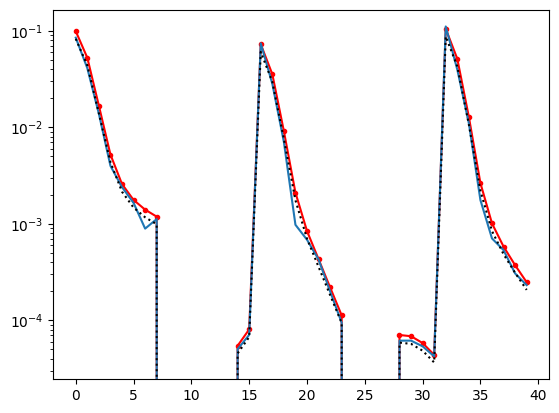

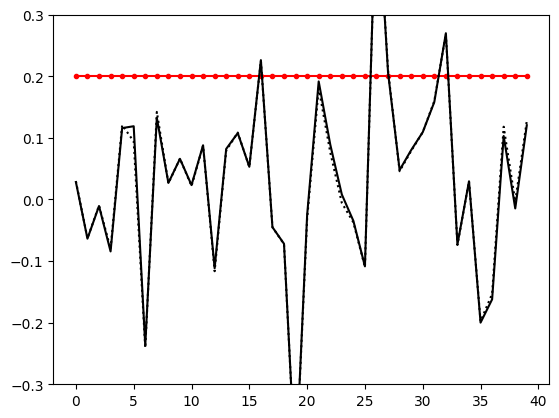

step: 292 0.15690529804500009
step: 293 0.14121476824050008
step: 294 0.12709329141645007


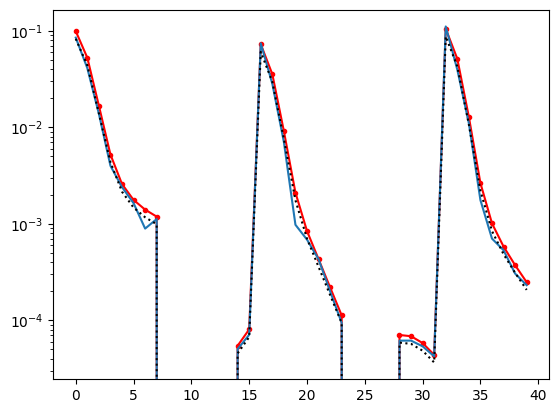

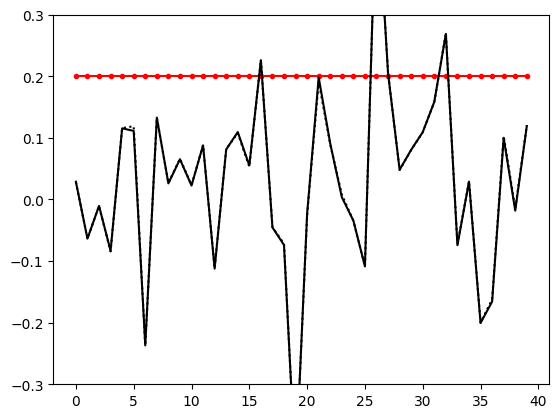

step: 295 0.11438396227480506
step: 296 0.10294556604732455
step: 297 0.0926510094425921


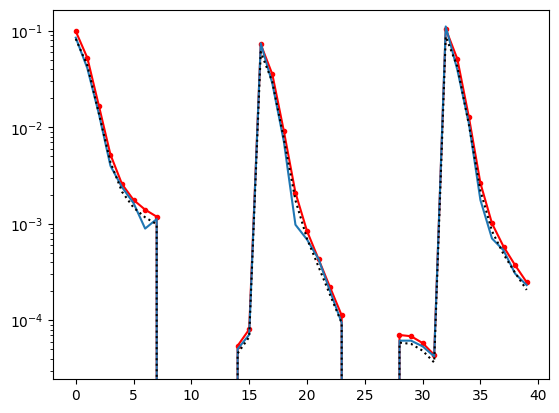

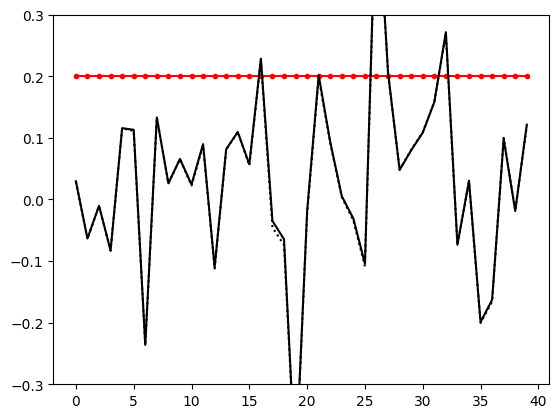

step: 298 0.08338590849833288
step: 299 0.0750473176484996
step: 300 0.06754258588364964


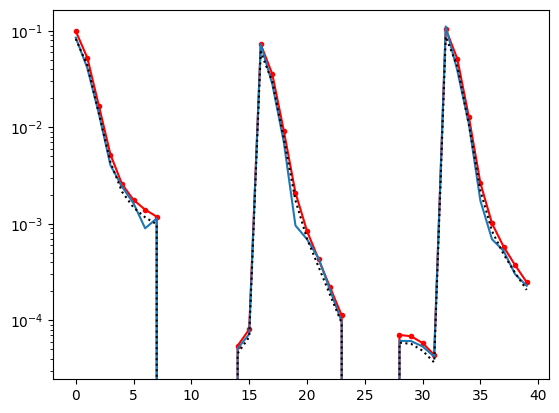

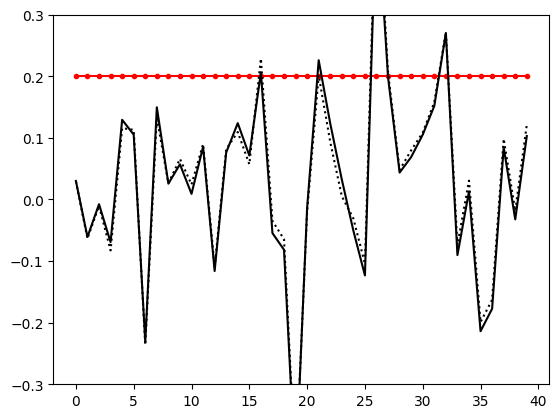

step: 301 0.5
step: 302 0.45
step: 303 0.405


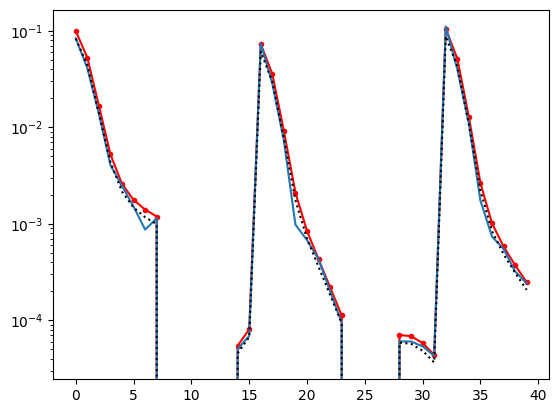

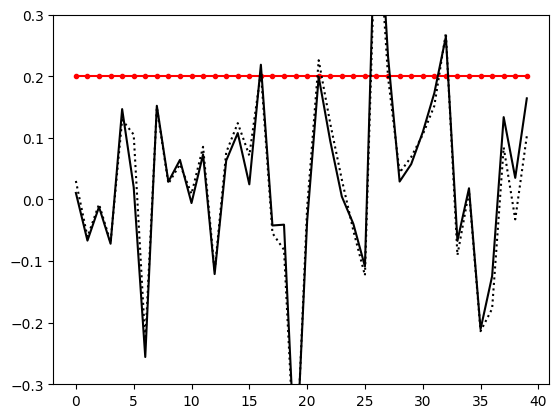

step: 304 0.36450000000000005
step: 305 0.32805000000000006
step: 306 0.2952450000000001


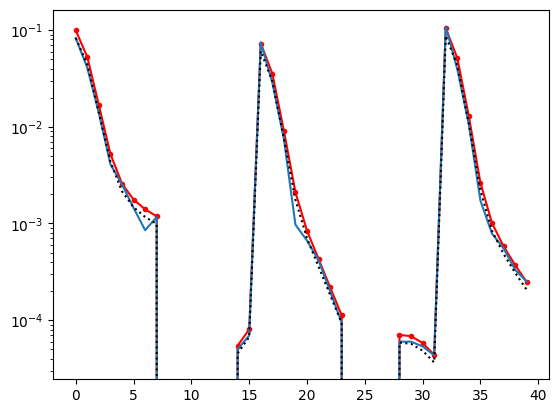

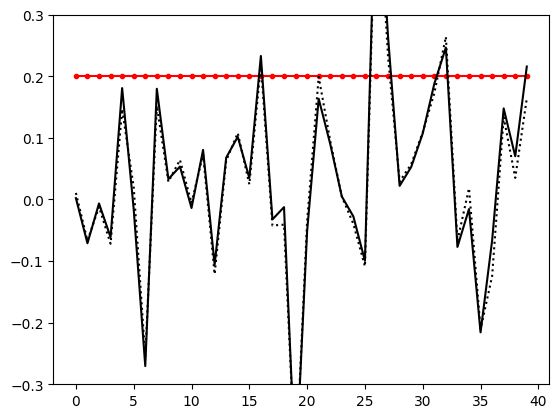

step: 307 0.2657205000000001
step: 308 0.23914845000000007
step: 309 0.21523360500000008


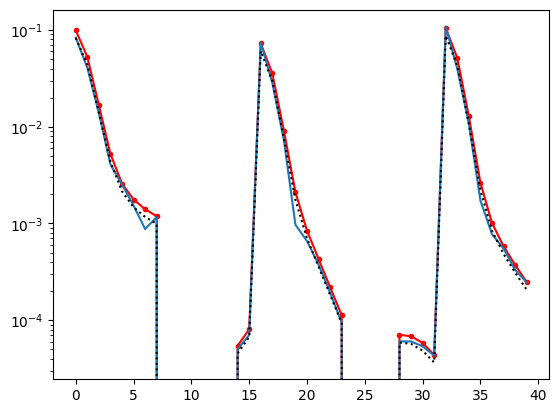

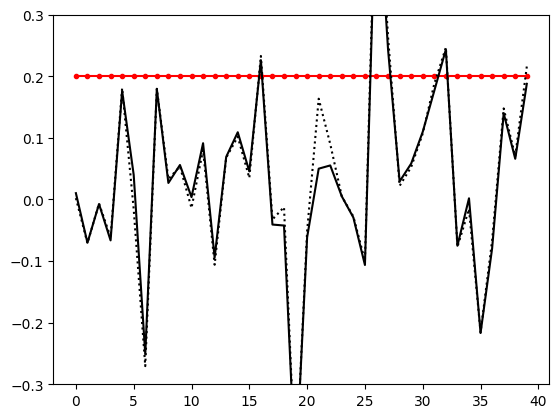

step: 310 0.19371024450000007
step: 311 0.17433922005000008
step: 312 0.15690529804500009


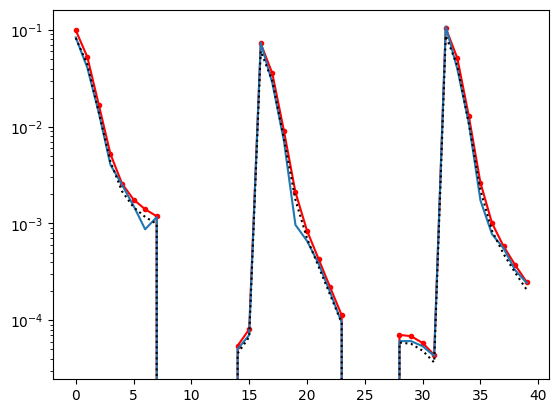

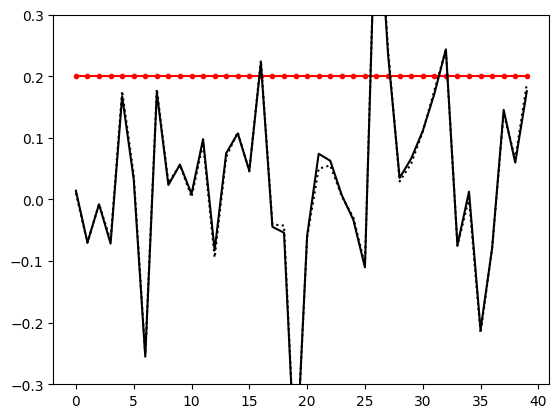

step: 313 0.14121476824050008
step: 314 0.12709329141645007
step: 315 0.11438396227480506


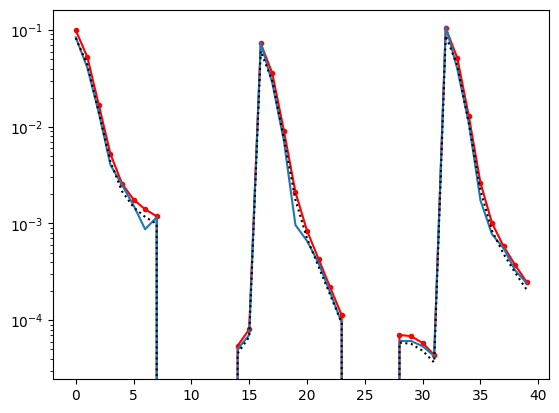

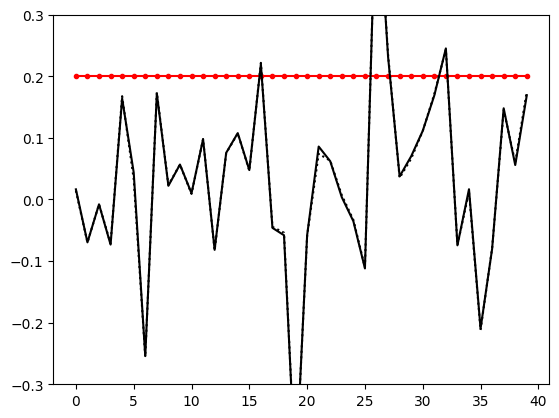

step: 316 0.10294556604732455
step: 317 0.0926510094425921
step: 318 0.08338590849833288


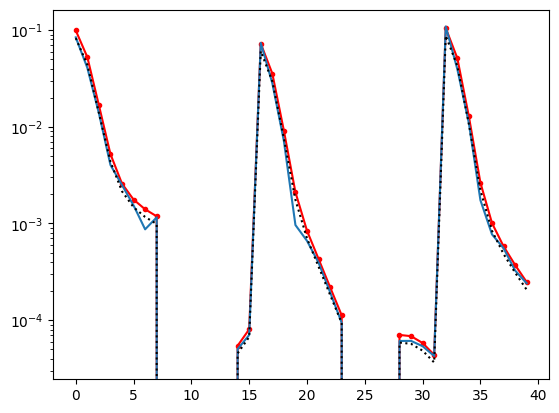

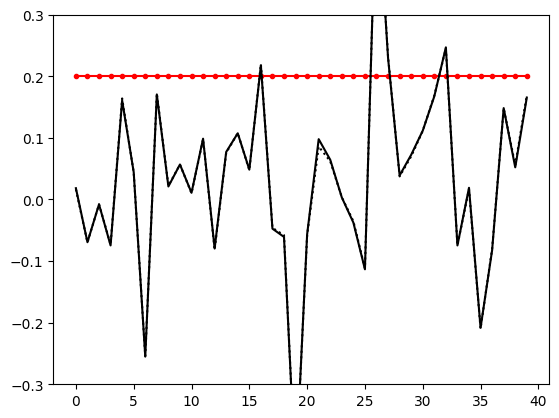

step: 319 0.0750473176484996
step: 320 0.06754258588364964
step: 321 0.5


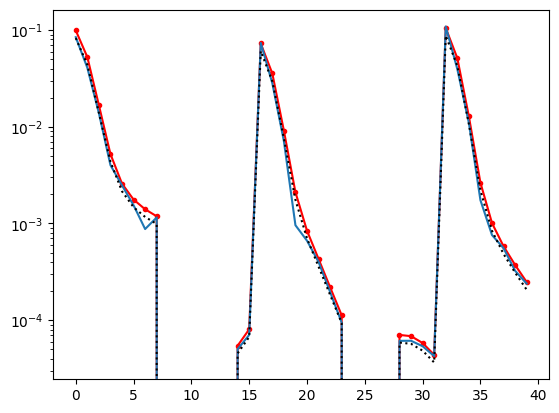

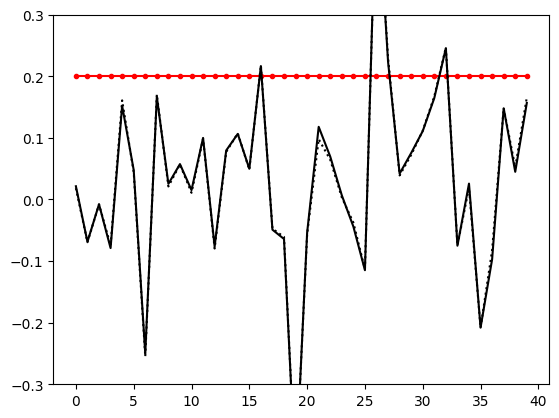

step: 322 0.45
step: 323 0.405
step: 324 0.36450000000000005


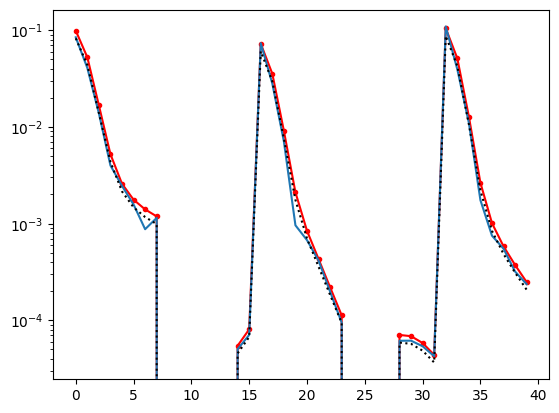

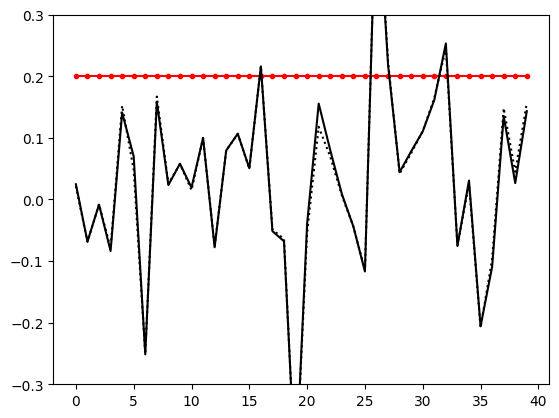

step: 325 0.32805000000000006
step: 326 0.2952450000000001
step: 327 0.2657205000000001


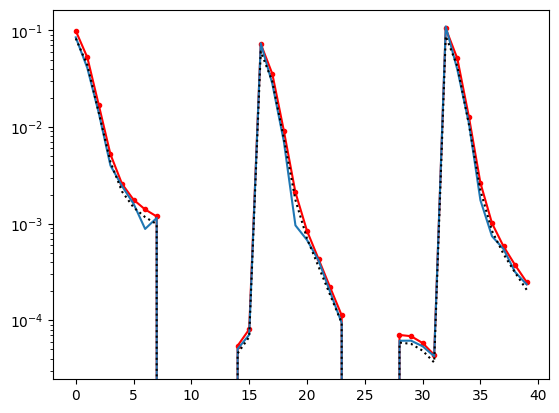

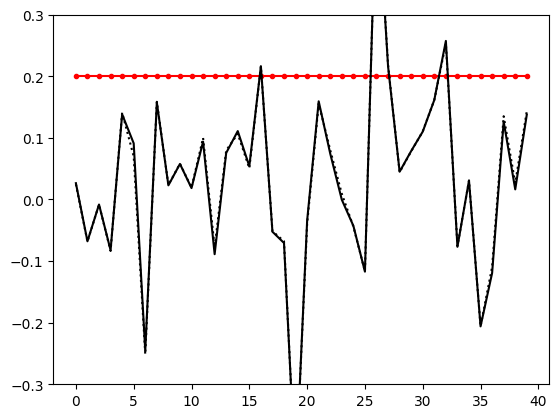

step: 328 0.23914845000000007
step: 329 0.21523360500000008
step: 330 0.19371024450000007


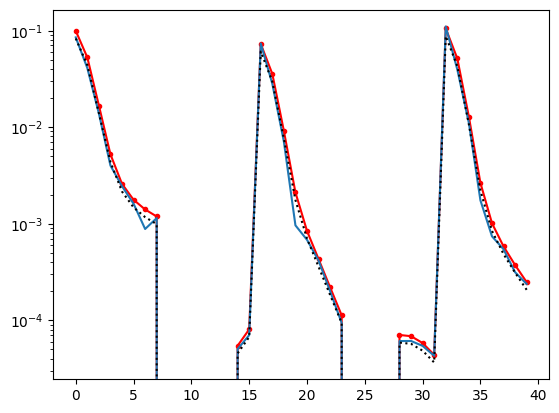

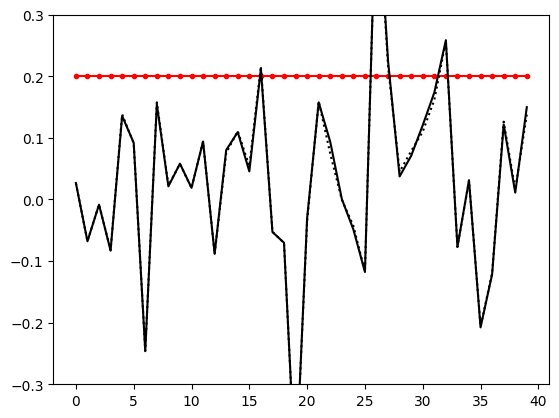

step: 331 0.17433922005000008
step: 332 0.15690529804500009
step: 333 0.14121476824050008


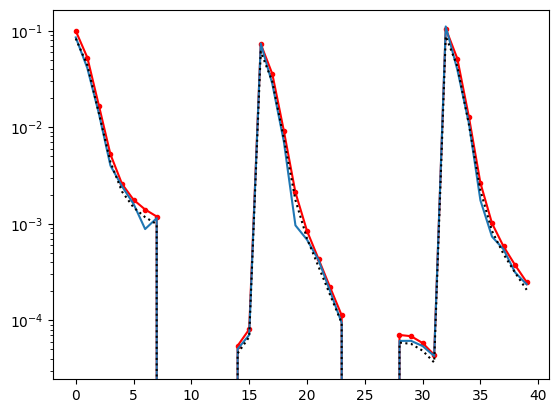

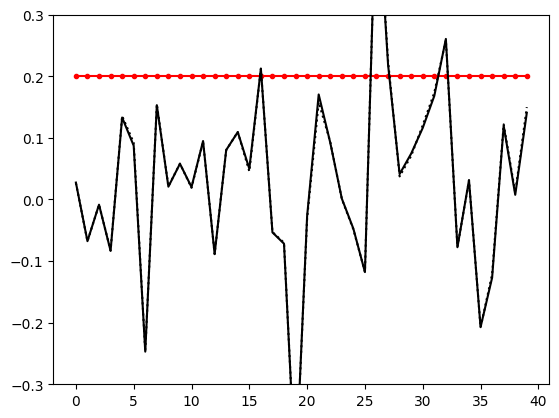

step: 334 0.12709329141645007
step: 335 0.11438396227480506
step: 336 0.10294556604732455


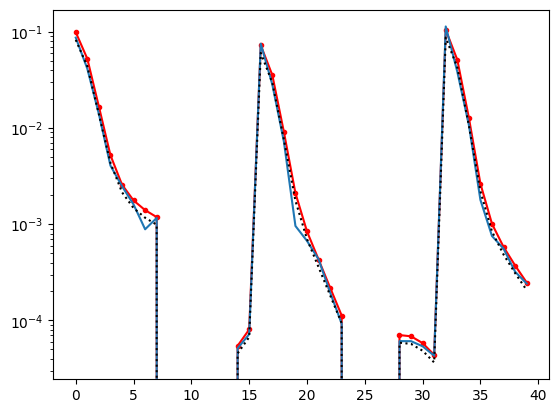

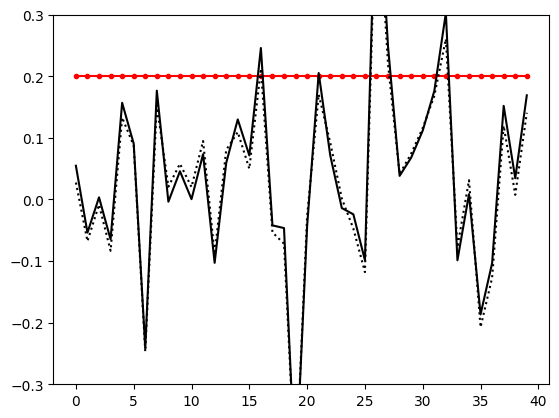

step: 337 0.0926510094425921
step: 338 0.08338590849833288
step: 339 0.0750473176484996


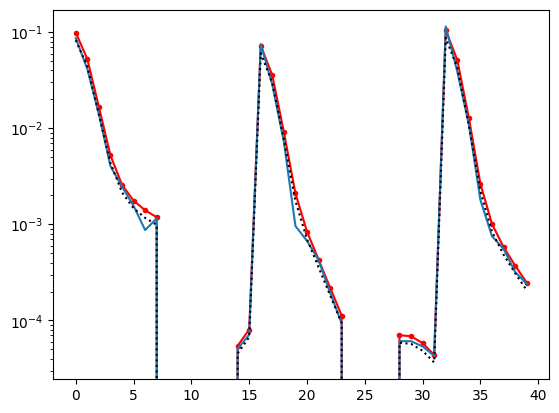

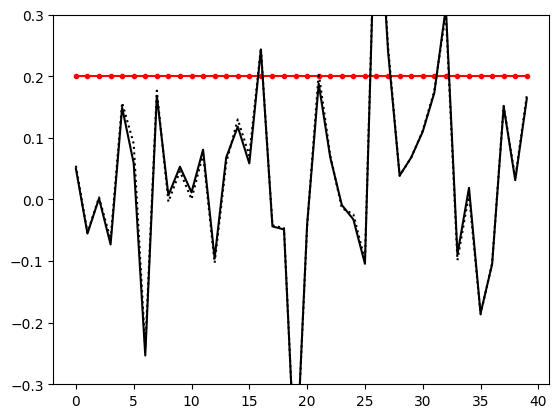

step: 340 0.06754258588364964
step: 341 0.5
step: 342 0.45


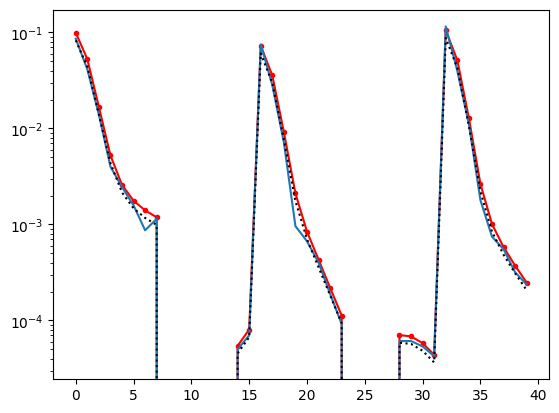

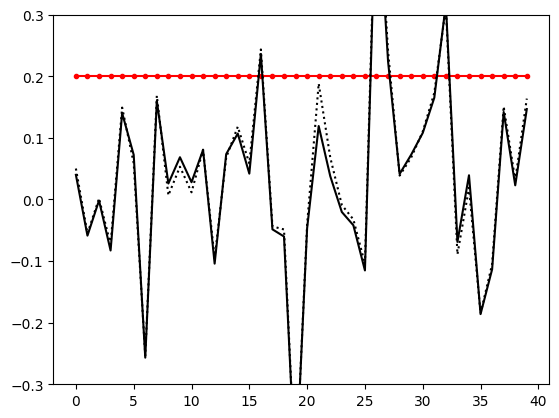

step: 343 0.405
step: 344 0.36450000000000005
step: 345 0.32805000000000006


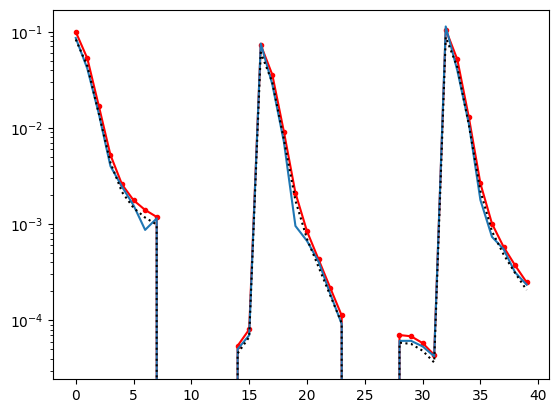

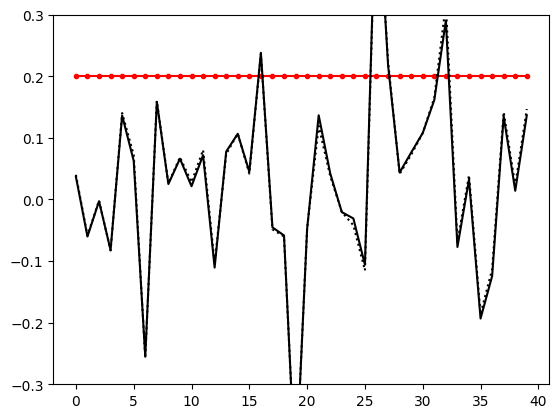

step: 346 0.2952450000000001
step: 347 0.2657205000000001
step: 348 0.23914845000000007


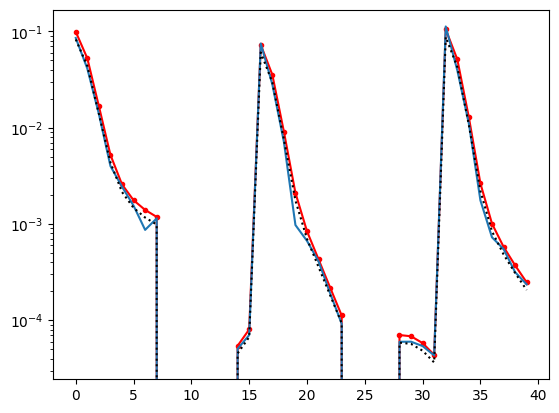

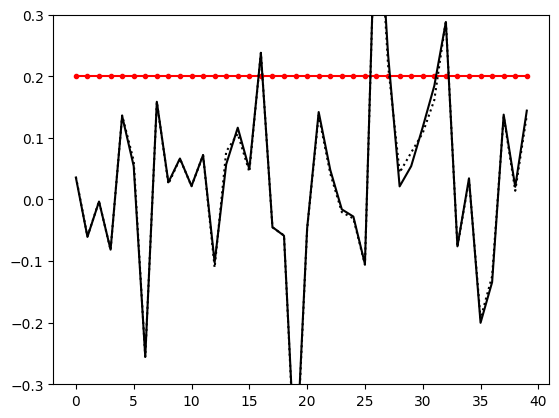

step: 349 0.21523360500000008
step: 350 0.19371024450000007
step: 351 0.17433922005000008


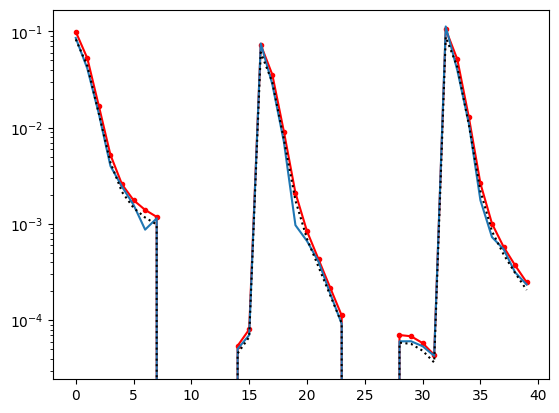

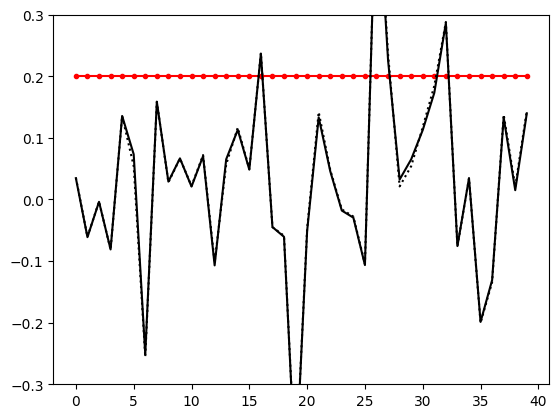

step: 352 0.15690529804500009
step: 353 0.14121476824050008
step: 354 0.12709329141645007


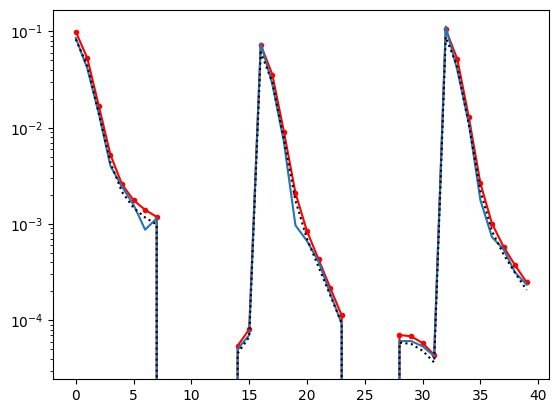

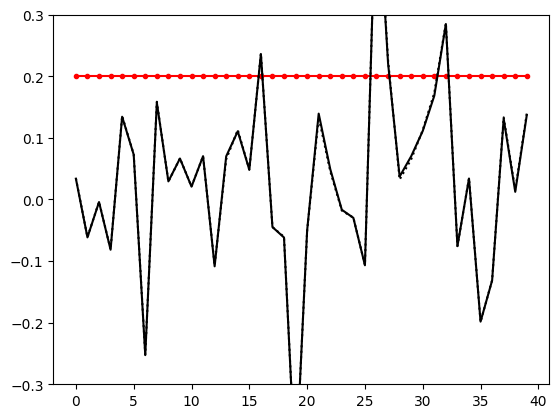

step: 355 0.11438396227480506
step: 356 0.10294556604732455
step: 357 0.0926510094425921


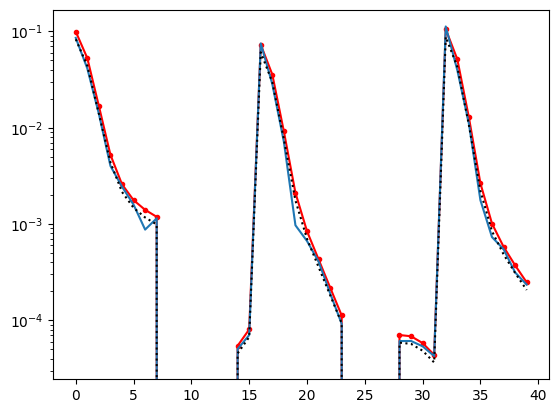

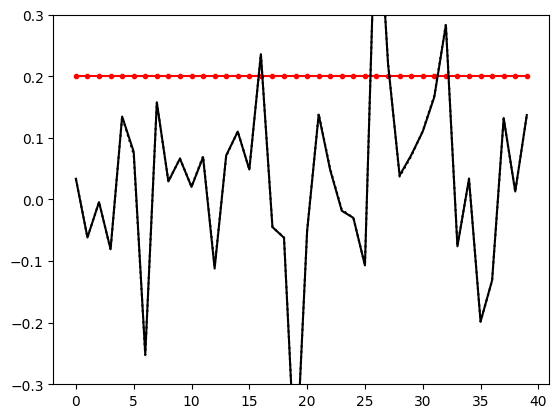

step: 358 0.08338590849833288
step: 359 0.0750473176484996
step: 360 0.06754258588364964


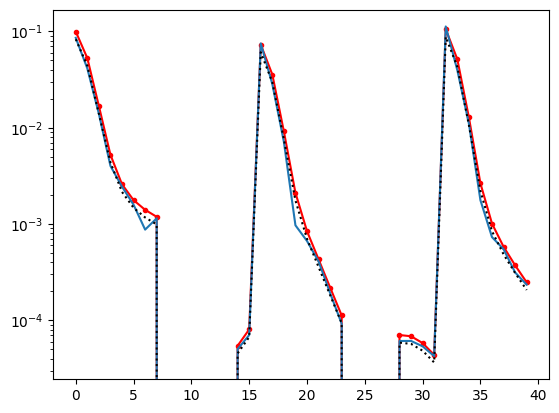

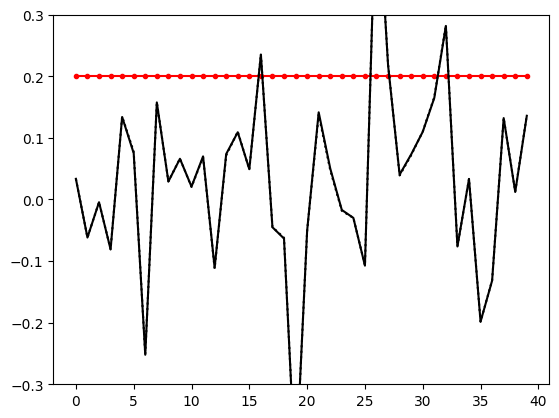

step: 361 0.5
step: 362 0.45
step: 363 0.405


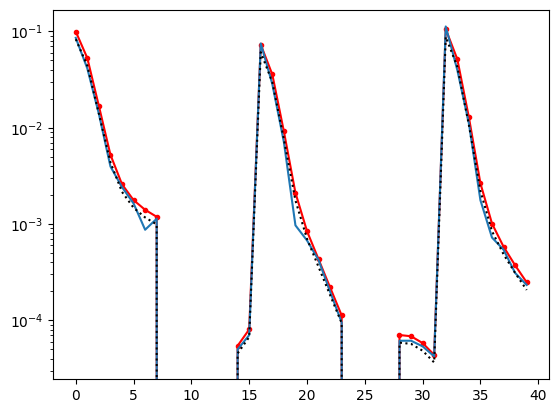

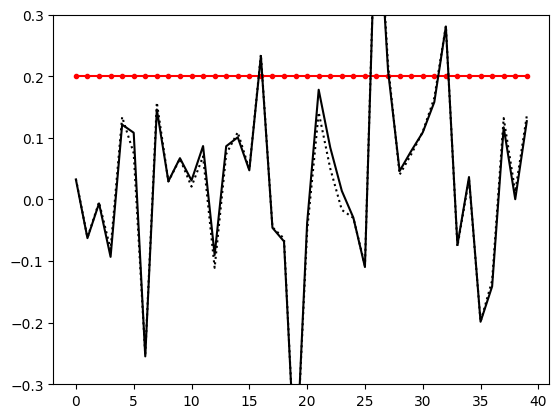

step: 364 0.36450000000000005
step: 365 0.32805000000000006
step: 366 0.2952450000000001


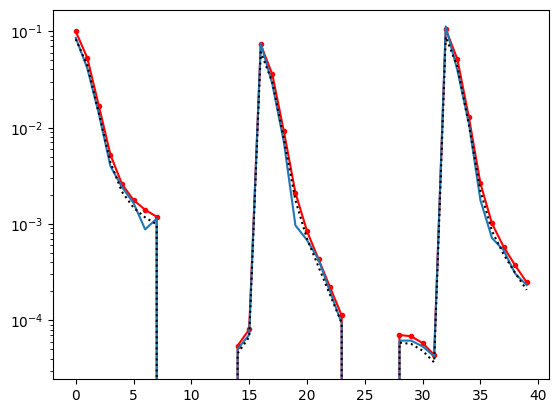

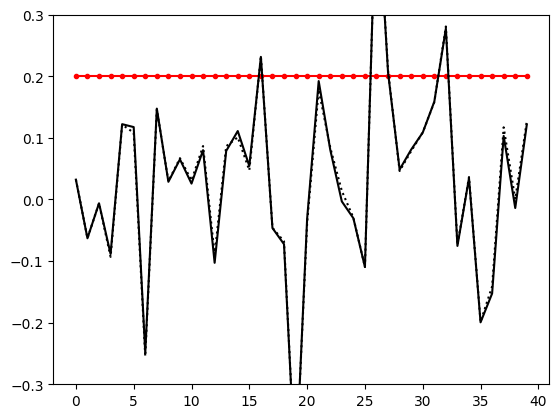

step: 367 0.2657205000000001
step: 368 0.23914845000000007
step: 369 0.21523360500000008


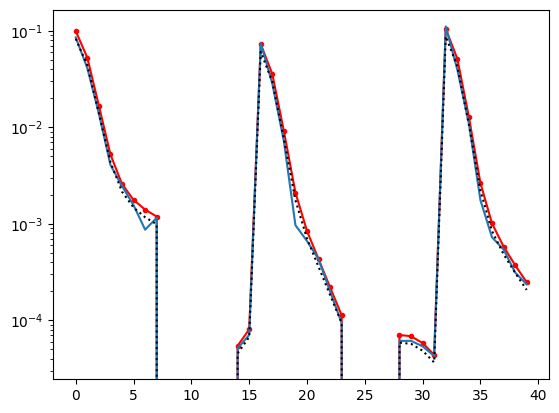

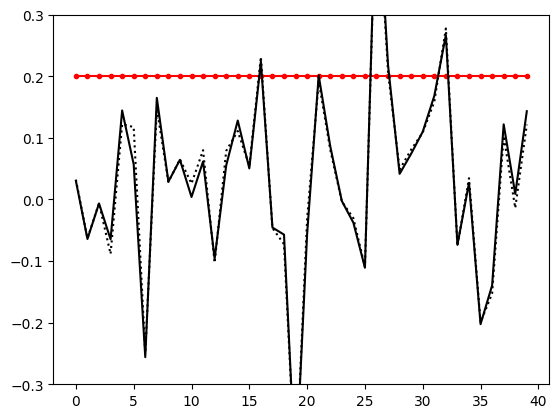

step: 370 0.19371024450000007
step: 371 0.17433922005000008
step: 372 0.15690529804500009


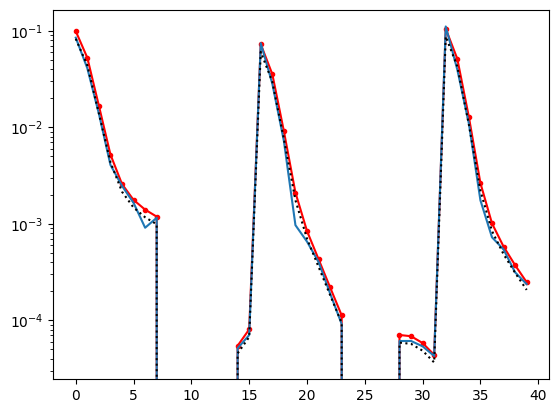

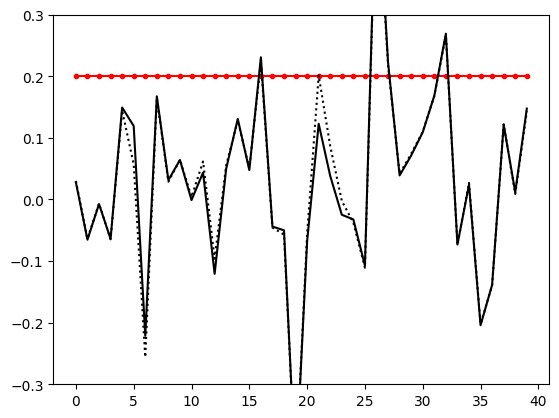

step: 373 0.14121476824050008
step: 374 0.12709329141645007
step: 375 0.11438396227480506


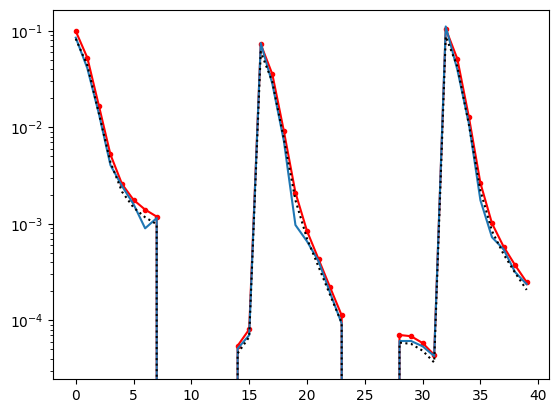

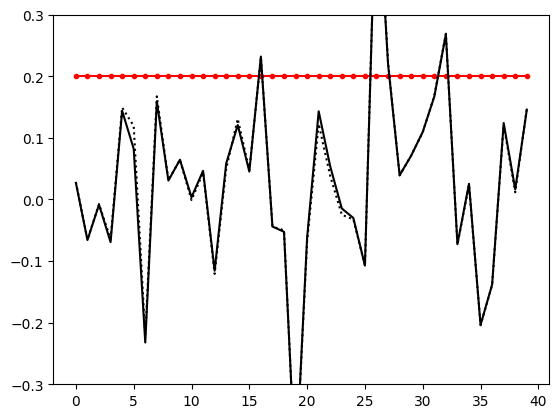

step: 376 0.10294556604732455
step: 377 0.0926510094425921
step: 378 0.08338590849833288


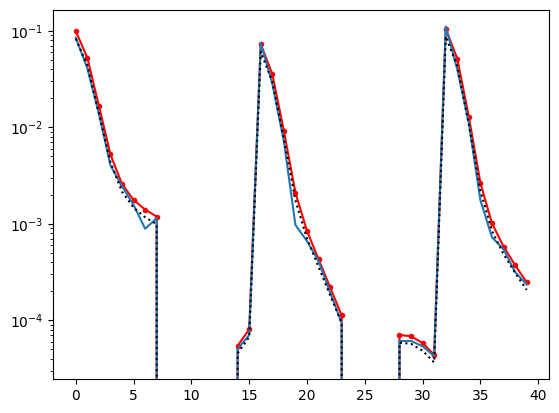

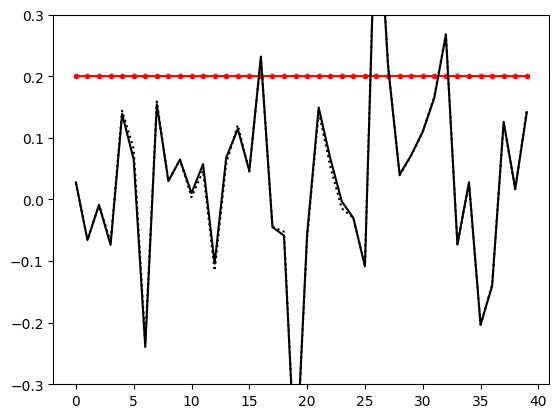

step: 379 0.0750473176484996
step: 380 0.06754258588364964
step: 381 0.5


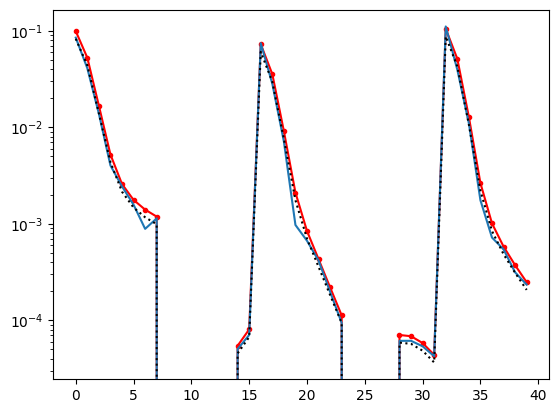

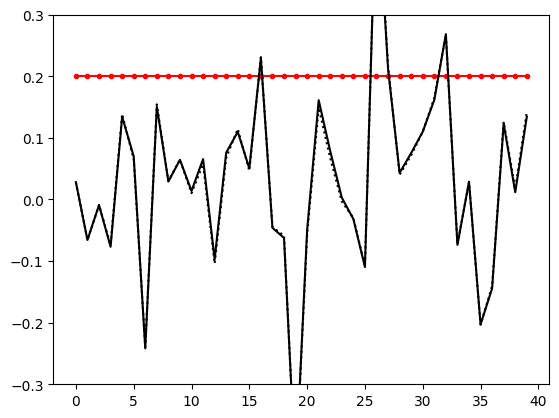

step: 382 0.45
step: 383 0.405
step: 384 0.36450000000000005


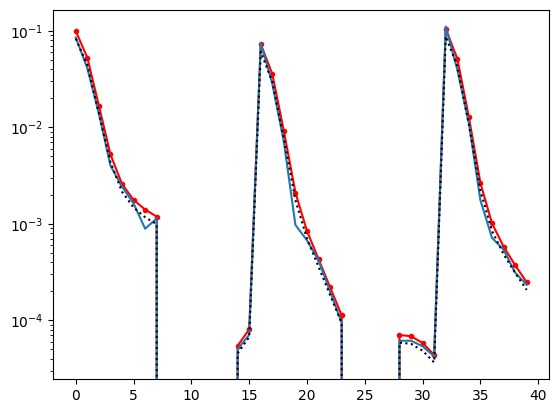

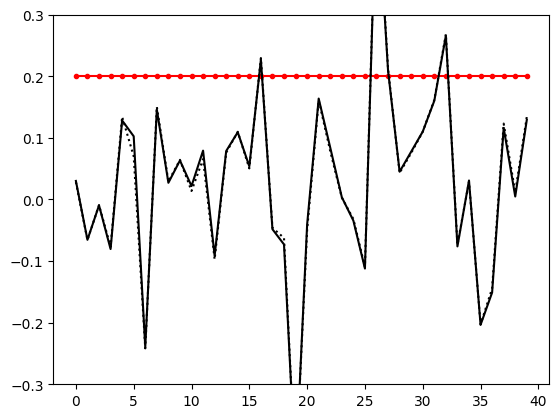

step: 385 0.32805000000000006
step: 386 0.2952450000000001
step: 387 0.2657205000000001


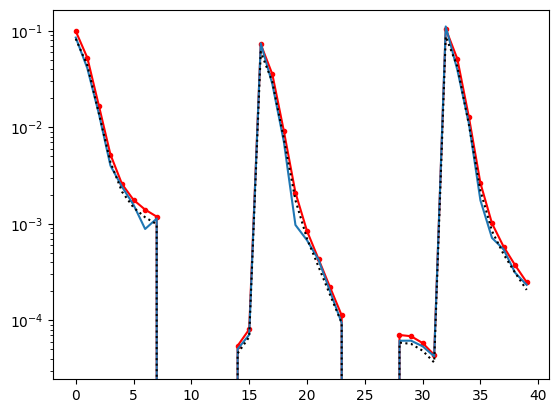

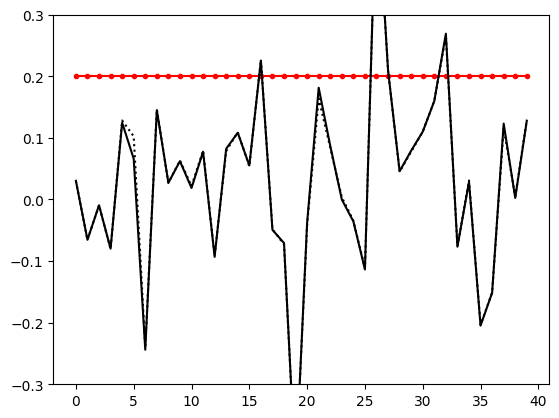

step: 388 0.23914845000000007
step: 389 0.21523360500000008
step: 390 0.19371024450000007


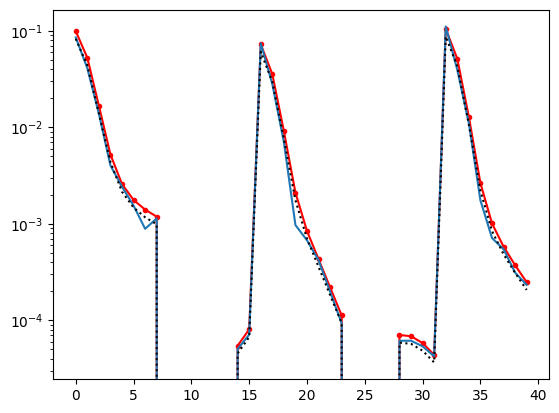

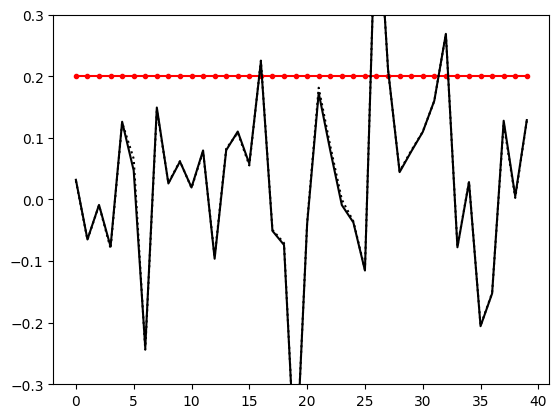

step: 391 0.17433922005000008
step: 392 0.15690529804500009
step: 393 0.14121476824050008


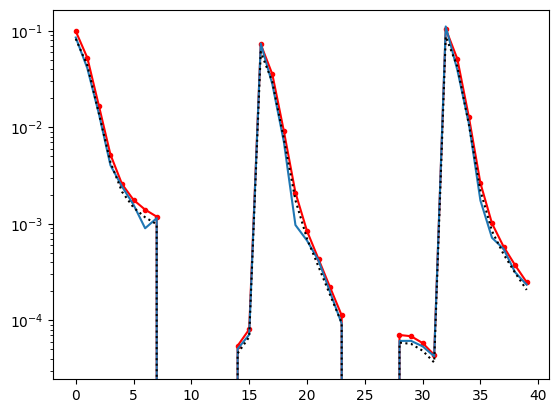

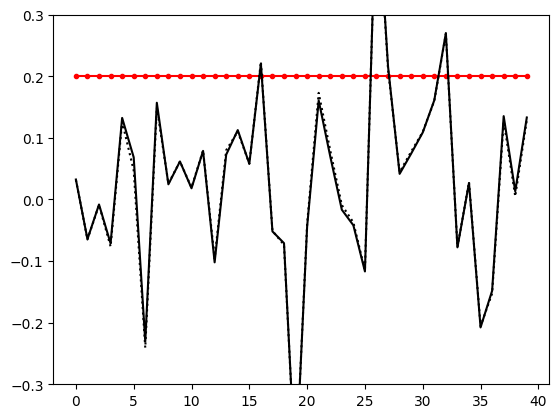

step: 394 0.12709329141645007
step: 395 0.11438396227480506
step: 396 0.10294556604732455


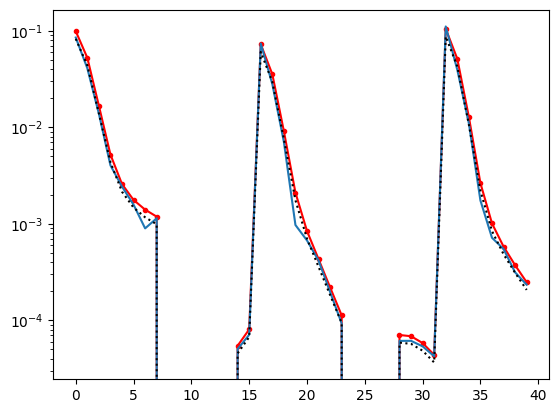

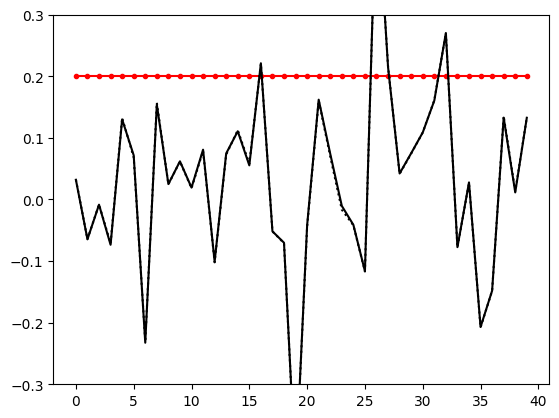

step: 397 0.0926510094425921
step: 398 0.08338590849833288
step: 399 0.0750473176484996


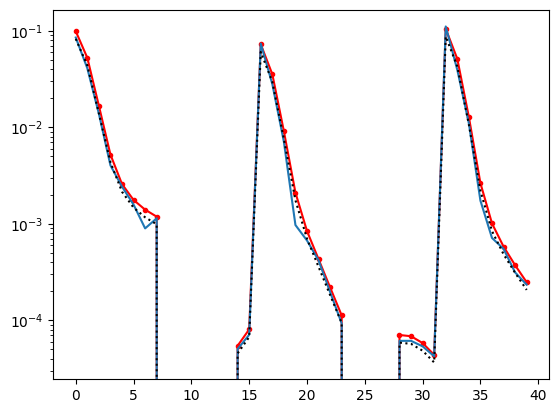

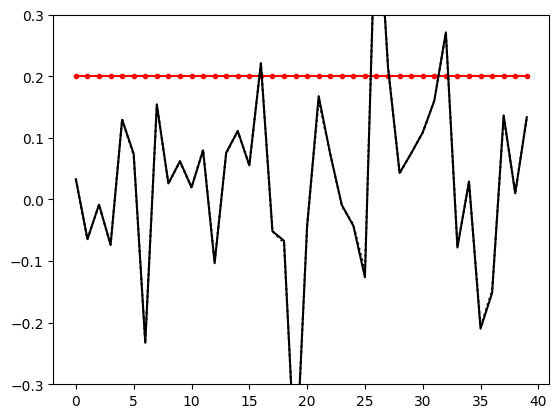

step: 400 0.06754258588364964


In [44]:
α = 0.5
for i in range(200, 400+1):
        print("step:",i,α)
        t0 = datetime.now()

        if i >= 1:
            xs = [x_data] + [prob.sample_x_z(_rng, θ)[0] for _rng in _split_rng(rng,nsims)]
            θ_tol = np.sqrt(-np.diag(H̃_inv_post)) * θ_rtol

        if i >= 1:
            Δθ̃ = ravel_θ(history[-1]["θ̃"])- ravel_θ(history[-2]["θ̃"])
          #  if np.sqrt(-np.inner(Δθ̃, np.inner(np.linalg.pinv(history[-1]["H̃_inv_post"]), Δθ̃))) < θ_rtol:
           #     break

        # MUSE gradient
        def get_MAPs(x_z):
            x, ẑ_prev = x_z
            result = prob.z_MAP_and_score(x, ẑ_prev, θ, method=method, z_tol=z_tol, θ_tol=θ_tol)
            
            return result

        MAPs = list(pmap(get_MAPs, zip(xs, ẑs)))

        ẑs = [MAP.z for MAP in MAPs]
   #     if save_MAP_history:
    #        MAP_history_dat, *MAP_history_sims = [MAP.history for MAP in MAPs]
        s_MAP_dat, *s_MAP_sims = [MAP.s for MAP in MAPs]
        s̃_MAP_dat, *s̃_MAP_sims = [MAP.s̃ for MAP in MAPs]
        s̃_MUSE = unravel_θ(ravel_θ(s̃_MAP_dat) - np.nanmean(np.stack(list(map(ravel_θ, s̃_MAP_sims))), axis=0))
        s̃_prior, H̃_prior = gradθ_hessθ_logPrior(θ̃, transformed_θ=True)
        s̃_post = unravel_θ(ravel_θ(s̃_MUSE) + ravel_θ(s̃_prior))

        # print(s̃_MAP_sims)
        # H̃_inv_like_sims = np.diag(-1 / np.nanvar(np.stack(list(map(ravel_θ, s̃_MAP_sims))), axis=0))
        epsilon = 1e-8  # A small value to avoid division by zero
        variance = np.nanvar(np.stack(list(map(ravel_θ, s̃_MAP_sims))), axis=0)
        variance += epsilon  # Add epsilon to the variance to prevent zero values
        H̃_inv_like_sims = np.diag(-1 / variance)
        # print(H̃_inv_like_sims)
        
       # try:
        # H̃_inv_post = np.linalg.pinv(np.linalg.pinv(H̃_inv_like_sims) + ravel_θ(H̃_prior).reshape(Nθ,Nθ))
        H̃_inv_post = np.linalg.pinv(np.linalg.pinv(H̃_inv_like_sims) + ravel_θ(H̃_prior).reshape(Nθ,Nθ))
        #except:
        #    print("error on Hessian inversion calc, prior ignored and trying again...")
       # H̃_inv_post = H̃_inv_like_sims
        t = datetime.now() - t0
        time += t

        history.append({
            "t":t, "θ̃":θ̃, "θ":θ,
            "s_MAP_dat": s_MAP_dat, "s_MAP_sims": s_MAP_sims,
            "s̃_MAP_dat": s̃_MAP_dat, "s̃_MAP_sims": s̃_MAP_sims, 
            "s̃_MUSE": s̃_MUSE,
            "s̃_prior": s̃_prior, "s̃_post": s̃_post, 
            "H̃_inv_post": H̃_inv_post, "H̃_prior": H̃_prior, 
            "H̃_inv_like_sims": H̃_inv_like_sims,
            "θ_tol": θ_tol,
        #    "MAP_history_dat": MAP_history_dat, 
         #   "MAP_history_sims": MAP_history_sims,
        })
        θ̃update = np.clip((np.inner(H̃_inv_post, ravel_θ(s̃_post))),-jnp.abs(ravel_θ(θ̃)*beta),jnp.abs(ravel_θ(θ̃)*beta))
        θ̃ = unravel_θ((ravel_θ(θ̃) - α * θ̃update))
        θ = θ̃
        # print(((θ-tf_cut_flat)/tf_cut_flat))
        #print(θ)
        if i%3==0:
            plt.semilogy(start_point,"r.-")
            plt.plot(θ)
            plt.plot(tf_cut_flat,"k:")
            plt.show()
            
            
            plt.plot((start_point-tf_cut_flat)/tf_cut_flat,"r.-")
            plt.plot((θ-tf_cut_flat)/tf_cut_flat,"k")
            plt.plot((θL-tf_cut_flat)/tf_cut_flat,"k:")
    
            plt.ylim([-.3,.3])
            plt.show()
            
            θL = θ
            #LR decay
        if i%20==0 and i!=0:
            α = 0.5
        else:
            α *= 0.9

In [45]:
#as you can see, convergence properties are wonky, takes a bit of time to start moving... 
#Should converge if you have the patients to let it run a couple of hours


In [46]:
#Now lets try to calculate the covariance! :D

In [47]:
s_MAP_sims = history[-1]["s_MAP_sims"]
_, *z_MAP_sims = ẑs

In [48]:
def z_MAP_guess_from_truth(x, z, θ):
        return unravel_z(0 * ravel_z(z))
    
nsims = 4
    
def get_J(
        result = None,
        θ = None,
        θ_tol = None,
        z_tol = None,
        method = None,
        rng = None,
        nsims = 10, 
        pmap = map,
        progress = False, 
        skip_errors = False,
    ):

        nsims_remaining = nsims 

        if nsims_remaining > 0:
            print(nsims_remaining)
            t0 = datetime.now()

            def get_s_MAP(rng):
                    (x, z) = prob.sample_x_z(rng, θ)
                    # if np.isnan(x).any() or np.isnan(z).any():
                    #     print("NaN detected in sampled (x, z)")
                    #     return None                    
                    z_MAP_guess = prob.z_MAP_guess_from_truth(x, z, θ)
                    # if np.isnan(z_MAP_guess).any():
                    #     print("NaN detected in z_MAP_guess!")
                    #     return None

                    #     result = prob.z_MAP_and_score(x, z_MAP_guess, θ, method=method, θ_tol=θ_tol, z_tol=z_tol)
                    #     if np.isnan(result.s).any():
                    #         print("NaN detected in s_MAP!")
                    #         return None
                    return prob.z_MAP_and_score(x, z_MAP_guess, θ, method=method, θ_tol=θ_tol, z_tol=z_tol).s
                

            rngs = _split_rng(rng, nsims_remaining)
            s_MAP_sims.extend(s for s in pmap(get_s_MAP, rngs) if s is not None)

#            time += datetime.now() - t0

        stacked_s = np.stack(list(map(ravel_θ, s_MAP_sims)))
        print("Stacked s_MAP_sims shape:", stacked_s.shape)
        print("Stacked s_MAP_sims values:", stacked_s)
        
        if np.isnan(stacked_s).any():
            print("NaN detected in stacked_s before computing J!")
            exit()
        J = np.atleast_2d(np.cov(np.stack(list(map(ravel_θ, s_MAP_sims))), rowvar=False))
        return J



In [49]:
J = get_J(rng=rng,θ =θ,method=method, θ_tol=θ_tol, z_tol=z_tol)

10
Stacked s_MAP_sims shape: (14, 40)
Stacked s_MAP_sims values: [[ 1.37716904e+04  1.19041078e+05  4.83030500e+05  1.23333312e+06
   2.12178700e+06  2.93169000e+06  3.48956050e+06  3.70661600e+06
   2.39771899e+03  1.81614883e+04  5.88688906e+04  1.59558906e+05
   2.80013094e+05  3.73649562e+05  3.76173812e+05  2.94982812e+05
  -2.01462341e+02 -2.62003467e+03 -1.32964062e+04 -4.83833047e+04
  -9.41898125e+04 -1.50643969e+05 -2.39934656e+05 -3.14043531e+05
  -1.18695084e+02 -1.52479950e+02  5.84789844e+03  8.42083557e+02
   2.95277271e+03 -3.62532251e+03 -2.63191289e+04 -3.16129414e+04
  -7.50526184e+02 -4.37583008e+03 -8.22418750e+03 -7.07416797e+03
  -1.19204248e+04 -3.12027695e+04 -3.62173359e+04 -4.72831133e+04]
 [ 1.38781719e+04  1.22422539e+05  4.81690469e+05  1.22289562e+06
   2.11320400e+06  2.91115225e+06  3.46434875e+06  3.68853900e+06
   2.14896484e+03  2.00744082e+04  6.27919922e+04  1.70084141e+05
   3.00213625e+05  3.77728062e+05  3.75863375e+05  3.01681000e+05
  -7.61383

In [50]:
J

array([[ 6.74000950e+05,  7.65665626e+05,  8.41004234e+06, ...,
         5.41238918e+05, -3.20749644e+06, -7.75969091e+05],
       [ 7.65665626e+05,  8.31975729e+06,  2.15117002e+07, ...,
         2.78777027e+06, -5.26802660e+06, -4.95792482e+06],
       [ 8.41004234e+06,  2.15117002e+07,  1.63202610e+08, ...,
        -9.56577651e+06, -8.00528892e+07, -2.44945317e+07],
       ...,
       [ 5.41238918e+05,  2.78777027e+06, -9.56577651e+06, ...,
         1.60522869e+07,  2.70741709e+07,  2.95359888e+06],
       [-3.20749644e+06, -5.26802660e+06, -8.00528892e+07, ...,
         2.70741709e+07,  8.18812694e+07,  1.59353951e+07],
       [-7.75969091e+05, -4.95792482e+06, -2.44945317e+07, ...,
         2.95359888e+06,  1.59353951e+07,  1.52766184e+07]])

In [51]:
cond_number = np.linalg.cond(J)
print(f"Condition number of J: {cond_number}")
if cond_number > 1e12:
    print("Warning: J is nearly singular!")

Condition number of J: 1.272757694035676e+21


In [52]:
Hs = []

In [53]:
def pjacobian(f, x, step, pmap=map, pbar=None):
    print(step,x)
    step = step + np.array(0 * x) # make array if scalar

    def column(i):
    
        def v(ε):
            ε_vec = np.array(0 * x)
            ε_vec[i] = ε
            v = f(x + ε_vec)
            if pbar: pbar.update()
            return v

        return (v(step[i]) - v(-step[i])) / (2 * step[i])

    return np.array(list(pmap(column, range(len(x)))))

In [54]:
#This takes a while, roughly an hour or two... Can probably parallelize it across GPUs if you want.

from tqdm import tqdm
from jax.scipy.sparse.linalg import cg

step = None
skip_errors = False
def _get_H_i_old(rng, z_MAP_guess_fid, *, θ, method=None, θ_tol=None, z_tol=None, step=None, skip_errors=False):
    
    # for each sim, do one fit at fiducial which we'll
    # reuse as a starting point when fudging θ by +/-ϵ
    θfid = θ
    (x, z) = prob.sample_x_z(rng, θfid)
    if z_MAP_guess_fid is None:
        z_MAP_guess = _MAP_guess_from_truth(x, z, θfid)
        z_MAP_guess_fid = z_MAP_and_score(x, z_MAP_guess, θfid, method=method, θ_tol=θ_tol, z_tol=z_tol).z

    def get_s_MAP(θvec):
        θ = unravel_θ(θvec)
        (x, _) = prob.sample_x_z(copy(rng), θ)
        return ravel_θ(prob.z_MAP_and_score(x, z_MAP_guess_fid, θfid, method=method, θ_tol=θ_tol, z_tol=z_tol).s)

    return pjacobian(get_s_MAP, ravel_θ(θfid), step)


def _get_H_i(rng, z_MAP, *, θ, implicit_diff_cgtol=1e-3, method=None, θ_tol=None, z_tol=None, step=None, skip_errors=False):

        #implicit implementation..
        cg_kwargs = dict(tol=implicit_diff_cgtol)

        (x, z) = prob.sample_x_z(rng, θ)
        if z_MAP is None:
            z_MAP_guess = z_MAP_guess_from_truth(x, z, θ)
            z_MAP = prob.z_MAP_and_score(x, z_MAP_guess, θ, method=method, θ_tol=θ_tol, z_tol=z_tol).z

        θ_vec, z_MAP_vec = ravel_θ(θ), ravel_z(z_MAP)
        #unravel_θ, unravel_z = unravel_θ, unravel_z

        # non-implicit-diff term
        H1 = jacfwd(
            lambda θ1: grad(
                lambda θ2: prob.logLike(prob.sample_x_z(rng, unravel_θ(θ1))[0], z_MAP, unravel_θ(θ2))
            )(θ_vec)
        )(θ_vec)

        # term involving dzMAP/dθ via implicit-diff (w/ conjugate-gradient linear solve)
        dFdθ = jacfwd(
            lambda θ: grad(
                lambda z: prob.logLike(x, unravel_z(z), unravel_θ(θ))
            )(z_MAP_vec)
        )(θ_vec)
        dFdθ1 = jacfwd(
            lambda θ1: grad(
                lambda z: prob.logLike(prob.sample_x_z(rng, unravel_θ(θ1))[0], unravel_z(z), θ)
            )(z_MAP_vec)
        )(θ_vec)
        inv_dFdz_dFdθ1 = vmap(
            lambda vec: cg(
                lambda vec: jvp(lambda z: grad(lambda z: prob.logLike(x, unravel_z(z), θ))(z), (z_MAP_vec,), (vec,))[1], 
                vec, 
                **cg_kwargs
            )[0], 
            in_axes=1, out_axes=1
        )(dFdθ1)
        H2 = -dFdθ.T @ inv_dFdz_dFdθ1
        return H1 + H2

Hs = []

nsims_remaining = nsims  #- len(result.Hs)

z_MAP_sims = z_MAP_sims[:4]

if nsims_remaining > 0:

    # default to finite difference step size of 0.1σ with σ roughly
    # estimated from s_MAP_sims sims, if we have them
    if step is None:
        if len(s_MAP_sims) > 0:
            step = 0.1 / np.std(np.stack(list(map(ravel_θ, s_MAP_sims))), axis=0)
        else:
            step = 1e-5
    
    Nθ = len(ravel_θ(θ))
    pbar = partial(tqdm, total=nsims_remaining, desc="get_H", disable=(True))

    t0 = datetime.now()
    rngs = _split_rng(rng, nsims)[-nsims_remaining:]
    z_MAP_sims = (z_MAP_sims + [None]*(max(0, nsims - len(z_MAP_sims))))[-nsims_remaining:]
    _get_H_ii = partial(_get_H_i, θ=θ, method=method, θ_tol=θ_tol, z_tol=z_tol, step=step, skip_errors=skip_errors)
    Hs.extend(H for H in pbar(map(lambda args: _get_H_ii(*args), zip(rngs, z_MAP_sims)) )if H is not None)
   # result.time += datetime.now() - t0

avg = np.mean#np.median if use_median else np.mean
H = avg(np.array(Hs), axis=0)

In [55]:
Hs[0]

Array([[ 1.05662000e+05,  1.31889500e+05,  8.40382500e+04, ...,
         1.57649375e+04,  5.30370000e+04,  1.14590500e+05],
       [ 1.34603500e+05,  1.74395600e+06,  1.87916000e+06, ...,
         9.33112500e+04,  7.73114000e+05, -7.12050000e+04],
       [ 8.61452500e+04,  1.87315200e+06,  1.40078880e+07, ...,
        -2.84772750e+05, -2.67331000e+06, -2.20576200e+06],
       ...,
       [ 1.70484375e+04,  1.30831250e+04, -3.90873750e+05, ...,
         1.06450160e+07,  8.13761200e+06,  8.88949000e+05],
       [ 6.57775000e+04,  6.11112000e+05, -2.73972600e+06, ...,
         8.36375200e+06,  1.64485920e+07,  2.82182000e+06],
       [ 1.14691000e+05, -1.03521000e+05, -2.48326800e+06, ...,
         1.17139800e+06,  2.81432000e+06,  6.50396000e+06]],      dtype=float32)

In [56]:
import scipy as sp

Nθ = len(ravel(θ))

H_prior = -ravel(prob.gradθ_hessθ_logPrior(θ, transformed_θ=False)[1]).reshape(Nθ,Nθ)
Σ_inv = H.T @ np.linalg.pinv(J) @ H + H_prior
Σ = np.linalg.pinv(Σ_inv)

try:
    if θ is not None:
        if Nθ == 1:
            dist = sp.stats.norm(ravel(θ), np.sqrt(Σ[0,0]))
        else:
            dist = sp.stats.multivariate_normal(ravel(θ), Σ)
except:
    print("likely error in covariance... proceed with caution!")

In [57]:
cond_number = np.linalg.cond(J)
print(f"Condition number of J: {cond_number}")
if cond_number > 1e12:
    print("Warning: J is nearly singular!")

Condition number of J: 1.272757694035676e+21


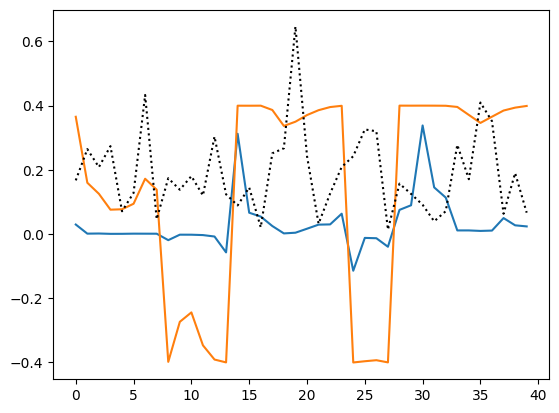

In [58]:
plt.plot(1/np.sqrt(np.diag(Σ_inv))/tf_cut_flat)
plt.plot(np.sqrt(np.diag(Σ))/tf_cut_flat)

plt.plot(abs((start_point-θ)/tf_cut_flat),"k:")

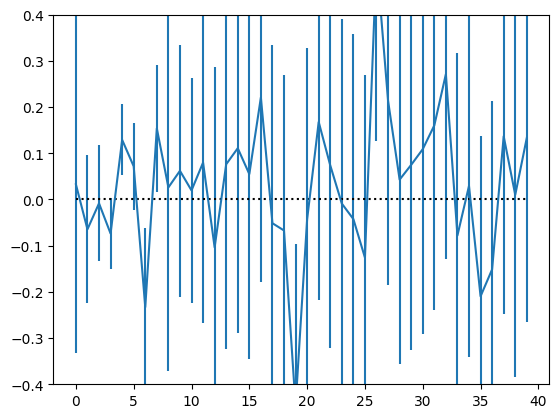

In [59]:
#need to run optimization for longer, since thsoe smaller scale modes in each mu-bin are not converged...
# plt.errorbar(np.arange(len(tf_cut_flat)),(θ-tf_cut_flat)/tf_cut_flat,yerr=np.abs(1/np.sqrt(np.diag(Σ_inv))/tf_cut_flat))
plt.errorbar(np.arange(len(tf_cut_flat)),(θ-tf_cut_flat)/tf_cut_flat,yerr = np.abs(np.sqrt(np.diag(Σ)) / tf_cut_flat))
plt.plot(np.arange(len(tf_cut_flat)),np.arange(len(tf_cut_flat))*0.0,"k:")
plt.ylim(-0.4,0.4)
plt.show()

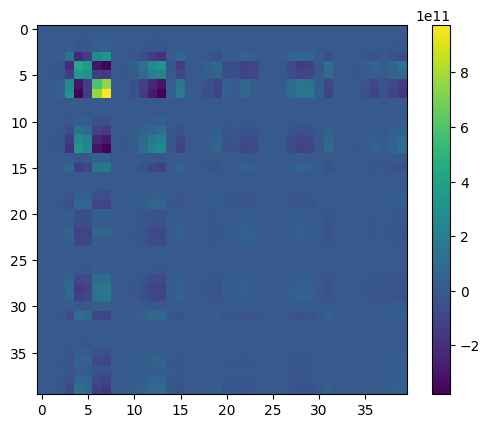

In [60]:
imshow(Σ_inv)
colorbar()

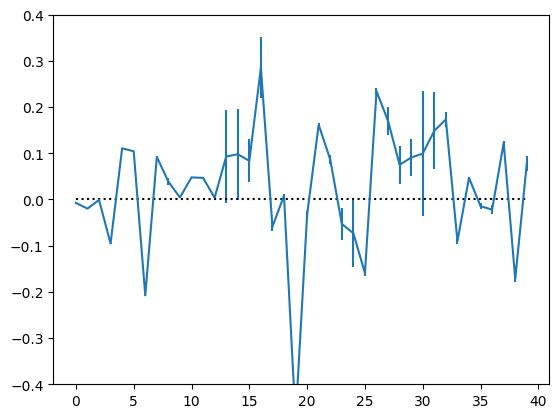

In [39]:
#need to run optimization for longer, since thsoe smaller scale modes in each mu-bin are not converged...
plt.errorbar(np.arange(len(tf_cut_flat)),(θ-tf_cut_flat)/tf_cut_flat,yerr=np.abs(1/np.sqrt(np.diag(Σ_inv))/tf_cut_flat))
plt.plot(np.arange(len(tf_cut_flat)),np.arange(len(tf_cut_flat))*0.0,"k:")
plt.ylim(-0.4,0.4)
plt.show()